# Imports and Settings

In [1]:
import os
from typing import Dict, List, Optional, Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold, train_test_split
from tqdm.notebook import tqdm

In [2]:
# Настроиваем pandas
# Показывать все столбцы
pd.set_option("display.max_columns", None)
# Отображать полный текст в ячейках столбцов без усечения
pd.set_option("display.max_colwidth", None)

# Functions

## Functions for assembling a dataset from parquet files

In [3]:
def read_parquet_dataset_from_local(
    path_to_dataset: str,
    start_from: int = 0,
    num_parts_to_read: int = 2,
    columns: Optional[List[str]] = None,
    verbose: bool = False,
) -> pd.DataFrame:
    """
    Читает num_parts_to_read партиций, преобразовывает их к pd.DataFrame и возвращает.

    Args:
    path_to_dataset : путь до директории с партициями
    start_from : номер партиции, с которой нужно начать чтение
    num_parts_to_read : количество партиций, которые требуется прочитать
    columns : список колонок, которые нужно прочитать из партиции
    verbose : выводить ли дополнительную информацию

    Returns:
    pd.DataFrame
    """
    res = []
    dataset_paths = sorted(
        os.path.join(path_to_dataset, filename)
        for filename in os.listdir(path_to_dataset)
        if filename.startswith("train")
    )

    if verbose:
        print("Dataset paths:")
        for path in dataset_paths:
            print(path)

    start_from = max(0, start_from)
    chunks = dataset_paths[start_from : start_from + num_parts_to_read]

    if verbose:
        print("Reading chunks:")
        for chunk in chunks:
            print(chunk)

    for chunk_path in tqdm(chunks, desc="Reading dataset with pandas"):
        if verbose:
            print("Reading chunk:", chunk_path)
        chunk = pd.read_parquet(chunk_path, columns=columns)
        res.append(chunk)

    return pd.concat(res).reset_index(drop=True)

In [4]:
def prepare_transactions_dataset(
    path_to_dataset: str,
    num_parts_to_preprocess_at_once: int = 1,
    num_parts_total: int = 50,
    save_to_path: str = None,
    verbose: bool = False,
) -> pd.DataFrame:
    """
    Возвращает исходный pd.DataFrame с признаками из которых нужно собрать
    учебный датасет.

    Args:
    path_to_dataset : путь до датасета с партициями
    num_parts_to_preprocess_at_once : количество партиций,
        которые будут одновременно держаться и обрабатываться в памяти
    num_parts_total : общее количество партиций, которые нужно обработать
    save_to_path : путь до папки для сохранения обработанных блоков в .parquet-формате;
        если None, сохранение не происходит
    verbose : логировать каждую обрабатываемую часть данных

    Returns:
    pd.DataFrame : датафрейм с объединёнными данными
    """
    preprocessed_frames = []

    for step in tqdm(
        range(0, num_parts_total, num_parts_to_preprocess_at_once),
        desc="Transforming transactions data",
    ):
        transactions_frame = read_parquet_dataset_from_local(
            path_to_dataset,
            start_from=step,
            num_parts_to_read=num_parts_to_preprocess_at_once,
            verbose=verbose,
        )

        # Записываем подготовленные данные в файл
        if save_to_path:
            block_as_str = str(step)
            if len(block_as_str) == 1:
                block_as_str = "00" + block_as_str
            else:
                block_as_str = "0" + block_as_str
            transactions_frame.to_parquet(
                os.path.join(save_to_path, f"processed_chunk_{block_as_str}.parquet")
            )

        preprocessed_frames.append(transactions_frame)

    return pd.concat(preprocessed_frames)

## Feature engineering functions

In [236]:
def create_rn_max_feature(
    df_source: pd.DataFrame, df_to_update: pd.DataFrame
) -> pd.DataFrame:
    """
    Добавляет в df_to_update новую колонку 'rn_max',
    содержащую максимальное значение 'rn' для каждого 'id' из df_source.

    Args:
    df_source (pd.DataFrame): исходный DataFrame с колонками 'id' и 'rn'.
    df_to_update (pd.DataFrame): DataFrame, в который добавляется новая колонка.

    Returns:
    pd.DataFrame: обновлённый df_to_update с колонкой 'rn_max'.
    """
    # Группируем df_source по 'id' и вычисляем максимальное значение 'rn' для каждой группы
    rn_max = (
        df_source.groupby("id", as_index=False)["rn"]
        .max()
        .rename(columns={"rn": "rn_max"})
    )

    # Объединяем df_to_update с результатом группировки по колонке 'id'
    df_to_update = df_to_update.merge(rn_max, on="id", how="left")

    return df_to_update

In [6]:
def create_all_value_proportion_features(
    df_source: pd.DataFrame, df_to_update: pd.DataFrame, column: str
) -> Tuple[pd.DataFrame, List[str]]:
    """
    Для каждого уникального значения признака column
    функция создаёт новые числовые признаки,
    отражающие долю кредитов клиента (id), в которых это значение встречается.

    Args:
    df_source : исходный датафрейм.
    df_to_update : целевой датафрейм, к которому добавляются новые признаки.
    column : имя столбца, по уникальным значениям которого создаются признаки.

    Returns:
    df_to_update : обновлённый датафрейм с добавленными признаками.
    new_features_list : список имён новых признаков.
    """
    new_features_list = []

    for value in sorted(df_source[column].unique()):
        new_column = f"{column}_prop_{value}"
        new_features_list.append(new_column)

        # Группируем по 'id' количество записей с текущим значением признака
        group_value = (
            df_source[df_source[column] == value]
            .groupby("id")
            .size()
            .rename(new_column)
        )

        # Объединяем с целевым датафреймом по ключу 'id'
        df_to_update = df_to_update.merge(group_value, on="id", how="left")

        # Заполняем пропуски нулями (отсутствие записей с данным значением)
        df_to_update[new_column] = df_to_update[new_column].fillna(0)

        # Вычисляем долю записей с этим значением относительно количества кредитов клиента
        df_to_update[new_column] = df_to_update[new_column] / df_to_update["rn_max"]

    return df_to_update, new_features_list

In [238]:
def choose_n_most_imp_features(
    df_train: pd.DataFrame,
    new_features_list: List[str],
    n_features: int,
    seed: int = 0,
    n_splits: int = 5,
) -> List[int]:
    """
    Принимает тренировочный датафрейм и создаёт его урезанную версию
    со столбцами из new_features_list.
    На ней обучает CatBoostClassifier с стратифицированной кросс-валидацией на выбранном количестве
    фолдов(5 по умолчанию),
    собирает важности признаков и вычисляет средние метрики ROC AUC.

    Возвращает список числовых значений, извлечённых из имён "n_features" наиболее важных признаков.

    Args:
        df_train : тренировочный датафрейм с признаками и целевой переменной 'flag'.
        new_features_list : список имён новых признаков для оценки.
        n_features : количество  признаков для выбора.
        seed : зерно рандома для воспроизводимости (по умолчанию 0).
        n_splits : Количество фолдов при разделении (по умолчанию 5).
    Returns:
        List: список числовых значений, извлечённых из имён "n_features" наиболее важных признаков.
    """
    # Выбираем целевую переменную и признаки
    X = df_train[new_features_list]
    y = df_train["flag"]

    # Создадим списки для хранения ROC AUC по фолдам
    roc_auc_scores_train = []
    roc_auc_scores_val = []

    # Создадим словарь для накопления важностей признаков на каждом фолде
    importances_dict = {col: [] for col in X.columns}

    # Инициализируем стратифицированный KFold
    kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)

    # Поделим данные на train/val
    for train_idx, val_idx in kf.split(X, y):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

        # Упакуем результат в Pool
        train_pool = Pool(data=X_train, label=y_train)
        val_pool = Pool(data=X_val, label=y_val)

        # Обучим модель CatBoost
        model = CatBoostClassifier(
            early_stopping_rounds=100,
            eval_metric="AUC",
            random_seed=seed,
            verbose=False,
            auto_class_weights="Balanced",
        )
        model.fit(train_pool, eval_set=val_pool, use_best_model=True)

        # Сохраним важности признаков в словарь
        importances = model.get_feature_importance()
        for col, imp in zip(X.columns, importances, strict=True):
            importances_dict[col].append(imp)

        # Предскажем вероятности и оценим ROC AUC
        train_pred_proba = model.predict_proba(X_train)[:, 1]
        val_pred_proba = model.predict_proba(X_val)[:, 1]

        roc_auc_scores_train.append(roc_auc_score(y_train, train_pred_proba))
        roc_auc_scores_val.append(roc_auc_score(y_val, val_pred_proba))

    # Выведем средние и стандартные отклонения ROC AUC по фолдам
    mean_roc_auc = np.mean(roc_auc_scores_train)
    std_roc_auc = np.std(roc_auc_scores_train)
    print(f"Среднее ROC AUC на трейне: {mean_roc_auc:.4f} ± {std_roc_auc:.4f}")

    mean_roc_auc = np.mean(roc_auc_scores_val)
    std_roc_auc = np.std(roc_auc_scores_val)
    print(f"Среднее ROC AUC на валидации: {mean_roc_auc:.4f} ± {std_roc_auc:.4f}")

    # Выведем медианные важности признаков как более устойчивые к выбросам
    median_importances = {
        col: np.median(imps) for col, imps in importances_dict.items()
    }

    # Отсортируем признаки по убыванию важности
    sorted_features = sorted(
        median_importances.items(), key=lambda x: x[1], reverse=True
    )

    # Выберем n_features наиболее важных признаков
    most_imp_features = [feat for feat, _ in sorted_features[:n_features]]

    # Извлечем числовые значения из имён признаков (число после последнего '_')
    values = [int(feature.rsplit("_", 1)[-1]) for feature in most_imp_features]

    return values

In [8]:
def create_definite_value_proportion_features(
    df_source: pd.DataFrame,
    df_to_update: pd.DataFrame,
    features_dictionary: Dict[str, List],
) -> pd.DataFrame:
    """
    На основе заданных словарём признаков и их значений создаёт новые числовые признаки,
    отражающие долю кредитов клиента (id), в которых это значение встречается.
    Новые признаки добавляются в целевой датафрейм

    Args:
        df_source : исходный датафрейм.
        df_to_update : датафрейм, в который добавляются новые признаки.
        features_dictionary : словарь, где ключи — имена столбцов исходного датафрейма,
            а значения — списки значений, по которым создаются признаки.

    Returns:
        pd.DataFrame: обновлённый датафрейм с добавленными частотными признаками.
    """
    for col in features_dictionary.keys():
        print("-" * 50)
        print("Исходный признак:", col)
        print("Новые фичи:")

        for value in features_dictionary[col]:
            new_column = f"{col}_prop_{value}"
            print(new_column)

            # Фильтруем df_source по текущему значению и считаем количество записей для каждого id
            group_value = (
                df_source[df_source[col] == value]
                .groupby("id")
                .size()
                .rename(new_column)
            )

            # Объединяем с целевым датафреймом по ключу 'id'
            df_to_update = df_to_update.merge(group_value, on="id", how="left")

            # Заполняем пропуски нулями (отсутствие записей с данным значением)
            df_to_update[new_column] = df_to_update[new_column].fillna(0)

            # Вычисляем долю записей с этим значением относительно общего количества кредитов клиента
            df_to_update[new_column] = df_to_update[new_column] / df_to_update["rn_max"]

    return df_to_update

In [237]:
def check_cat_boost(
    train_data: pd.DataFrame,
    test_data: pd.DataFrame,
    dataset_name: str,
    seed: int = 0,
    n_splits: int = 5,
) -> Tuple[pd.DataFrame, Dict[str, float]]:
    """
    Оценивает качество модели CatBoost на тренировочном, валидационном и тестовом наборах данных
    с помощью 5-кратной стратифицированной кросс-валидации.
    Вычисляет метрику ROC AUC для каждого фолда, аккумулирует важности признаков и возвращает
    отсортированный словарь с медианными значениями важности признаков.

    Args:
        train_data : тренировочный датасет с признаками и целевой переменной 'flag'.
        test_data  : тестовый датасет с признаками и целевой переменной 'flag'.
        dataset_name : версия тренировочного датасета для записи в итоговый DataFrame с метриками.
        seed : зерно рандома для воспроизводимости (по умолчанию 0).
        n_splits : Количество фолдов при разделении (по умолчанию 5).
    Returns:
        Dict[str, float]: словарь признаков с их медианной важностью, отсортированный по убыванию.

        Tuple[pd.DataFrame, Dict[str, float]]:
            DataFrame с одной строкой и средними ROC AUC для train/val/test.
            Словарь признаков с их медианной важностью, отсортированный по убыванию.
    """
    # Датафрейм для метрик
    df_metrics = pd.DataFrame(
        data=[{}],
        columns=[
            "dataset_name",
            "train_mean",
            "train_std",
            "val_mean",
            "val_std",
            "test_mean",
            "test_std",
        ],
    )
    df_metrics["dataset_name"] = dataset_name

    # Отделяем признаки и целевую переменную в тренировочном и тестовом датасетах
    X = train_data.drop(["id", "flag"], axis=1)
    y = train_data["flag"]
    X_test = test_data.drop(["id", "flag"], axis=1)
    y_test = test_data["flag"]

    # Создадим списки для хранения ROC AUC по фолдам
    roc_auc_scores_train = []
    roc_auc_scores_val = []
    roc_auc_scores_test = []

    # Создадим словарь для накопления важности признаков по каждому фолду
    importances_dict = {col: [] for col in X.columns}

    # Инициализируем стратифицированное разбиение на 5 фолдов
    kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)

    # В цикл добавим enumerate для индексации
    for i, (train_index, val_index) in enumerate(kf.split(X, y)):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        train_pool = Pool(data=X_train, label=y_train)
        val_pool = Pool(data=X_val, label=y_val)

        # Обучим модель
        model = CatBoostClassifier(
            early_stopping_rounds=100,
            eval_metric="AUC",
            random_seed=seed,
            verbose=False,
            auto_class_weights="Balanced",
        )
        model.fit(train_pool, eval_set=val_pool, use_best_model=True)

        # Сохраним важности признаков в словаре
        importances = model.get_feature_importance()
        for col, imp in zip(X.columns, importances, strict=True):
            importances_dict[col].append(imp)

        # Предскажем вероятности для тренировочного, валидационного и тестового наборов
        train_pred_proba = model.predict_proba(X_train)[:, 1]
        val_pred_proba = model.predict_proba(X_val)[:, 1]
        test_pred_proba = model.predict_proba(X_test)[:, 1]

        # Вычислим ROC AUC для каждого набора
        train_roc_auc = roc_auc_score(y_train, train_pred_proba)
        val_roc_auc = roc_auc_score(y_val, val_pred_proba)
        test_roc_auc = roc_auc_score(y_test, test_pred_proba)

        # Сохраненим метрики
        roc_auc_scores_train.append(train_roc_auc)
        roc_auc_scores_val.append(val_roc_auc)
        roc_auc_scores_test.append(test_roc_auc)

        print(f"Фолд {i}")
        print(f"ROC AUC на трейне: {train_roc_auc:.4f}")
        print(f"ROC AUC на валидации: {val_roc_auc:.4f}")
        print(f"ROC AUC на тесте: {test_roc_auc:.4f}")

    """ 
    Выведем среднее и стандартное отклонение ROC AUC по фолдам 
    для каждого набора и запишем в df_metrics
    """
    mean_roc_auc = np.mean(roc_auc_scores_train)
    std_roc_auc = np.std(roc_auc_scores_train)
    df_metrics["train_mean"] = mean_roc_auc
    df_metrics["train_std"] = std_roc_auc
    print(f"Среднее ROC AUC на трейне: {mean_roc_auc:.4f} ± {std_roc_auc:.4f}")

    mean_roc_auc = np.mean(roc_auc_scores_val)
    std_roc_auc = np.std(roc_auc_scores_val)
    df_metrics["val_mean"] = mean_roc_auc
    df_metrics["val_std"] = std_roc_auc
    print(f"Среднее ROC AUC на валидации: {mean_roc_auc:.4f} ± {std_roc_auc:.4f}")

    mean_roc_auc = np.mean(roc_auc_scores_test)
    std_roc_auc = np.std(roc_auc_scores_test)
    df_metrics["test_mean"] = mean_roc_auc
    df_metrics["test_std"] = std_roc_auc
    print(f"Среднее ROC AUC на тесте: {mean_roc_auc:.4f} ± {std_roc_auc:.4f}")

    # Вычислим медианные важности признаков по всем фолдам
    median_importances_dict = {
        col: np.median(imps) for col, imps in importances_dict.items()
    }

    # Отсортируем признаки по убыванию важности
    sorted_median_importances_dict = dict(
        sorted(median_importances_dict.items(), key=lambda x: x[1], reverse=True)
    )

    return df_metrics, sorted_median_importances_dict

In [10]:
def create_mean_values_frequency_feature(
    df_source: pd.DataFrame, df_to_update: pd.DataFrame, column: str
) -> pd.DataFrame:
    """
    Создаёт агрегированный признак,
    отражающий среднюю частоту (относительную встречаемость) значений заданного столбца
    column из исходного датафрейма для каждого уникального id.
    Результат добавляется в целевой датафрейм
    с нормировкой на количество записей (rn_max) для каждого id.

    Args:
    df_source : Исходный датафрейм.
    df_to_update : Целевой датафрейм.
    column : Имя столбца в df_source, по уникальным значениям которого вычисляются частоты.

    Returns:
    df_to_update : Обновлённый датафрейм с добавленным новым столбцом {column}_mean_freq.
    """
    new_column = f"{column}_mean_freq"
    print(new_column)
    """
    Вычисляем долю каждого уникального значения в столбце column
    относительно общего числа записей и сохраняем в словарь
    """
    value_freq = df_source[column].value_counts(normalize=True).to_dict()
    """
    Создаём Series, где каждому значению из столбца column в df_source 
    сопоставляется его относительная встречаемость из словаря bin_freq.
    """
    freq_series = df_source[column].map(value_freq)

    # Группируем по 'id' и суммируем частоты значений для каждой группы
    agg_freq = freq_series.groupby(df_source["id"]).sum().reset_index(name=new_column)

    # Объединяем с целевым датафреймом по ключу 'id'
    df_to_update = df_to_update.merge(agg_freq, on="id", how="left")

    # Нормируем сумму частот на общее количество записей (rn_max) для каждого id
    df_to_update[new_column] = df_to_update[new_column] / df_to_update["rn_max"]

    return df_to_update

In [11]:
def from_enc_paym_create_normalized_group_sum_features(
    df_source: pd.DataFrame,
    df_to_update: pd.DataFrame,
    enc_paym_columns_list: List[str],
    time_span: str,
) -> pd.DataFrame:
    """
    Создаёт агрегированные признаки, отражающие среднее количество
    различных статусов платежей (от 0 до 3) за заданный временной промежуток.

    Для каждого статуса платежа i в диапазоне [0, 3] функция:
    - подсчитывает количество появлений статуса i в столбцах enc_paym_columns_list
      для каждой записи в исходном DataFrame df_source,
    - агрегирует эти количества по  'id' суммированием,
    - добавляет полученные агрегаты в целевой DataFrame df_to_update с именами столбцов вида
      'enc_paym_avg_i_{time_span}',
    - нормирует агрегированные суммы на количество записей 'rn_max' для каждого id,
      получая среднее количество статусов i на один кредит.

    Args:
        df_source : Исходный DataFrame с данными по платежам.
        df_to_update : Целевой DataFrame, в который добавляются новые признаки.
        enc_paym_columns_list : Список имён столбцов в df_source, содержащих статусы платежей.
        time_span : Метка временного промежутка, добавляемая в имя нового признака.

    Returns:
        df_to_update : Обновлённый df_to_update с добавленными  признаками.
    """
    # Создаём временный DataFrame с колонкой 'id' из df_source
    df = pd.DataFrame({"id": df_source["id"]})

    # Для статусов платежей по кредитам от 0 до 3
    for status in range(4):
        new_col = f"enc_paym_avg_{status}_{time_span}"
        print(new_col)

        # Подсчитываем количество появлений  status в указанных столбцах для каждой записи
        status_counts = np.sum(
            [df_source[col] == status for col in enc_paym_columns_list], axis=0
        )
        df[new_col] = status_counts

        # Группируем по 'id' и суммируем значения
        agg_sum = df.groupby("id")[new_col].sum().reset_index(name=new_col)

        # Добавляем агрегированные данные в df_to_update
        df_to_update = df_to_update.merge(agg_sum, on="id", how="left")

        # Нормируем агрегированные суммы на количество записей 'rn_max' для каждого id
        df_to_update[new_col] = df_to_update[new_col] / df_to_update["rn_max"]

    return df_to_update

In [12]:
def create_enc_paym_avg_pair_diff_one_period(
    df_to_update: pd.DataFrame, time_span: str
) -> pd.DataFrame:
    """
    Создаёт новые признаки, отражающие разницу между средними значениями
    статусов платежей (от 0 до 3) в рамках одного временного промежутка
    для всех возможных пар.

    Args:
        df_to_update : Целевой DataFrame, в который
            добавляются новые признаки.
        time_span : Метка временного промежутка, используемая в именах
            столбцов для обозначения периода.

    Returns:
        pd.DataFrame: Обновлённый DataFrame с добавленными признаками разницы
            между средними значениями статусов платежей.
    """
    # Вычисляем разницу между средним значением статуса 0 и 1, 2, 3
    for i in range(1, 4):
        df_to_update[f"enc_paym_avg_0_{i}_{time_span}_diff"] = (
            df_to_update[f"enc_paym_avg_0_{time_span}"]
            - df_to_update[f"enc_paym_avg_{i}_{time_span}"]
        )

    # Вычисляем разницу между средним значением статуса 1 и 2, 3
    for i in range(2, 4):
        df_to_update[f"enc_paym_avg_1_{i}_{time_span}_diff"] = (
            df_to_update[f"enc_paym_avg_1_{time_span}"]
            - df_to_update[f"enc_paym_avg_{i}_{time_span}"]
        )

    # Вычисляем разницу между средним значением статуса 2 и 3
    df_to_update[f"enc_paym_avg_2_3_{time_span}_diff"] = (
        df_to_update[f"enc_paym_avg_2_{time_span}"]
        - df_to_update[f"enc_paym_avg_3_{time_span}"]
    )

    return df_to_update

In [13]:
def create_enc_paym_avg_pair_diff_years(df_to_update: pd.DataFrame) -> pd.DataFrame:
    """
    Создаёт признаки, отражающие разницу между средними значениями
    статусов платежей (от 0 до 3) за текущий и предыдущий год.

    Args:
        df_to_update : Целевой DataFrame, в который будут
            добавлены новые признаки.

    Returns:
        pd.DataFrame: Обновлённый df_to_update с добавленными столбцами.
    """
    # Вычисляем разницу между средними значениями статусов за текущий и предыдущий год
    for i in range(4):
        df_to_update[f"enc_paym_avg_{i}_years_diff"] = (
            df_to_update[f"enc_paym_avg_{i}_this_year"]
            - df_to_update[f"enc_paym_avg_{i}_last_year"]
        )

    return df_to_update

In [14]:
def from_is_zero_prop_1_create_sum_prop_1_feature(
    df_to_update: pd.DataFrame,
) -> pd.DataFrame:
    """
    Вычисляет среднее значение признаков is_zero_*_prop_1 по строкам.

    Args:
        df_to_update : DataFrame с исходными признаками.

    Returns:
        pd.DataFrame: Обновлённый DataFrame с добавленным признаком 'is_zero_sum_prop_1'.
    """
    columns = [
        "is_zero_loans5_prop_1",
        "is_zero_loans530_prop_1",
        "is_zero_loans3060_prop_1",
        "is_zero_loans6090_prop_1",
        "is_zero_loans90_prop_1",
    ]

    # Вычисляем среднее значение по выбранным столбцам для каждой строки
    df_to_update["is_zero_sum_prop_1"] = df_to_update[columns].sum(axis=1) / len(
        columns
    )

    return df_to_update

In [15]:
def from_pre_since_opened_create_pre_since_opened_sum_mean_repeated(
    df_source: pd.DataFrame, df_to_update: pd.DataFrame
) -> pd.DataFrame:
    """
    Создаёт признак, отражающий пропорцию повторяющихся значений 'pre_since_opened'
    для каждого уникального 'id'.

    Логика работы:
    - Подсчитывает количество появлений каждого значения 'pre_since_opened' для каждого 'id'.
    - Оставляет только повторяющиеся значения (где количество > 1), вычитая 1,
      чтобы не считать первое появление.
    - Суммирует количество повторов по всем значениям 'pre_since_opened' для каждого 'id'.
    - Объединяет полученные агрегаты с целевым DataFrame по ключу 'id'.
    - Заполняет отсутствующие значения нулями для 'id' без повторов.
    - Нормирует сумму повторов на количество записей 'rn_max' для каждого 'id',
      получая среднее количество повторов на одну запись.

    Args:
        df_source : Исходный DataFrame с колонками 'id' и 'pre_since_opened'.
        df_to_update : Целевой DataFrame, в который добавляется новый признак.

    Returns:
        pd.DataFrame: Обновлённый df_to_update с добавленным признаком
                      'pre_since_opened_repeated_prop'.
    """
    # Подсчёт количества появлений каждого значения 'pre_since_opened' для каждого 'id'
    counts = df_source.groupby(["id", "pre_since_opened"]).size()

    # Оставляем только повторяющиеся значения (count > 1) и вычитаем 1, чтобы не считать первое появление
    repeated_pre_since_opened = counts[counts > 1] - 1

    # Суммируем результаты по каждому id
    sum_repeated = (
        repeated_pre_since_opened.groupby("id")
        .sum()
        .rename("pre_since_opened_repeated_prop")
    )

    # Объединяем с df_to_update по 'id', добавляя новый признак
    df_to_update = df_to_update.merge(sum_repeated, on="id", how="left")

    # Заполняем пропуски нулями для 'id' без повторов
    df_to_update["pre_since_opened_repeated_prop"] = df_to_update[
        "pre_since_opened_repeated_prop"
    ].fillna(0)

    # Нормируем значение на количество записей 'rn_max' для каждого 'id'
    df_to_update["pre_since_opened_repeated_prop"] = (
        df_to_update["pre_since_opened_repeated_prop"] / df_to_update["rn_max"]
    )

    return df_to_update

In [16]:
def from_pre_term_till_mean_freq_create_diff_features(
    df_to_update: pd.DataFrame,
) -> pd.DataFrame:
    """
    Создаёт признаки, отражающие разницу между парами признаков
    средней относительной частотой значений.

    Рассматриваемые признаки:
        - pre_pterm: Плановое количество дней с даты открытия кредита до даты закрытия.
        - pre_fterm: Фактическое количество дней с даты открытия кредита до даты закрытия.
        - pre_till_pclose: Плановое количество дней с даты сбора данных до даты закрытия кредита.
        - pre_till_fclose: Фактическое количество дней с даты сбора данных до даты закрытия кредита.

    Новые признаки:
        - pre_fterm_pterm_mean_freq_diff: разница между средними относительными
                    частотами pre_fterm и pre_pterm.
        - pre_till_fclose_pclose_mean_freq_diff: разница между средними относительными
                    частотами pre_till_fclose и pre_till_pclose.

    Args:
        df_to_update : DataFrame, в который добавляются новые признаки.

    Returns:
        pd.DataFrame: Обновлённый DataFrame с добавленными признаками.
    """
    df_to_update["pre_fterm_pterm_mean_freq_diff"] = (
        df_to_update["pre_fterm_mean_freq"] - df_to_update["pre_pterm_mean_freq"]
    )
    df_to_update["pre_till_fclose_pclose_mean_freq_diff"] = (
        df_to_update["pre_till_fclose_mean_freq"]
        - df_to_update["pre_till_pclose_mean_freq"]
    )

    return df_to_update

# Description of the dataset

In [17]:
# Описание признаков датасета
df_schema = pd.read_excel("../resources/description.xlsx", sheet_name="features")
df_schema

,Поле,Описание
0,id,"Идентификатор заявки. Заявки пронумерованы так, что большему номеру соответствует более поздняя дата заявки."
1,rn,Порядковый номер кредитного продукта в кредитной истории. Большему номеру соответствует продукт с более поздней датой открытия.
2,pre_since_opened,Дней с даты открытия кредита до даты сбора данных (бинаризовано*)
3,pre_since_confirmed,Дней с даты подтверждения информации по кредиту до даты сбора данных (бинаризовано*)
4,pre_pterm,Плановое количество дней с даты открытия кредита до даты закрытия (бинаризовано*)
5,pre_fterm,Фактическое количество дней с даты открытия кредита до даты закрытия (бинаризовано*)
6,pre_till_pclose,Плановое количество дней с даты сбора данных до даты закрытия кредита (бинаризовано*)
7,pre_till_fclose,Фактическое количество дней с даты сбора данных до даты закрытия кредита (бинаризовано*)
8,pre_loans_credit_limit,Кредитный лимит (бинаризовано*)
9,pre_loans_next_pay_summ,Сумма следующего платежа по кредиту (бинаризовано*)


# Target

In [2]:
# Загрузим датасет с целевой переменной
df_target = pd.read_csv("../data/target/train_target.csv")
df_target

,id,flag
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0
...,...,...
2999995,2999995,0
2999996,2999996,0
2999997,2999997,0
2999998,2999998,0


In [20]:
# Проверим на пустые значения
print("Количество пустых строк", df_target[df_target.isnull().any(axis=1)].shape[0])

Количество пустых строк 0


In [21]:
# Проверим на дубликаты строк
print("Количество дубликатов строк", df_target[df_target.duplicated()].shape[0])

Количество дубликатов строк 0


In [22]:
df_target.dtypes

id      int64
flag    int64
dtype: object

In [23]:
# Проверим на монотонное возрастание id
print("id возростает монотонно", df_target["id"].is_monotonic_increasing)

id возростает монотонно True


In [24]:
# Вычислим коэффициент дисбаланса
print(
    "Коэффициент дисбаланса",
    df_target[df_target.flag == 0].shape[0] / df_target[df_target.flag == 1].shape[0],
)

Коэффициент дисбаланса 27.18436331523271


Выводы.    
Дубликатов и пустых значений нет, типы данных правильные, id идёт по порядку возрастания.  
Датасет перекошен в 27 раз сторону класса 0.

# Assemble the source dataset from parquet files

In [25]:
# Путь до исходных данных в проекте
path = "../data/raw"

In [26]:
# Исходный данные находятся в двенадцати файлах parquet
df = prepare_transactions_dataset(
    path,
    num_parts_to_preprocess_at_once=1,
    num_parts_total=12,
    save_to_path="../data/temp",
)

Transforming transactions data:   0%|          | 0/12 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/1 [00:00<?, ?it/s]

In [27]:
df.shape

(26162717, 61)

In [28]:
df.head(10)

,id,rn,pre_since_opened,pre_since_confirmed,pre_pterm,pre_fterm,pre_till_pclose,pre_till_fclose,pre_loans_credit_limit,pre_loans_next_pay_summ,pre_loans_outstanding,pre_loans_total_overdue,pre_loans_max_overdue_sum,pre_loans_credit_cost_rate,pre_loans5,pre_loans530,pre_loans3060,pre_loans6090,pre_loans90,is_zero_loans5,is_zero_loans530,is_zero_loans3060,is_zero_loans6090,is_zero_loans90,pre_util,pre_over2limit,pre_maxover2limit,is_zero_util,is_zero_over2limit,is_zero_maxover2limit,enc_paym_0,enc_paym_1,enc_paym_2,enc_paym_3,enc_paym_4,enc_paym_5,enc_paym_6,enc_paym_7,enc_paym_8,enc_paym_9,enc_paym_10,enc_paym_11,enc_paym_12,enc_paym_13,enc_paym_14,enc_paym_15,enc_paym_16,enc_paym_17,enc_paym_18,enc_paym_19,enc_paym_20,enc_paym_21,enc_paym_22,enc_paym_23,enc_paym_24,enc_loans_account_holder_type,enc_loans_credit_status,enc_loans_credit_type,enc_loans_account_cur,pclose_flag,fclose_flag
0,0,1,18,9,2,3,16,10,11,3,3,0,2,11,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,3,3,3,3,3,3,3,3,3,4,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,4,1,0,0
1,0,2,18,9,14,14,12,12,0,3,3,0,2,11,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,4,1,3,4,1,0,0
2,0,3,18,9,4,8,1,11,11,0,5,0,2,8,6,16,5,4,8,1,1,1,1,1,15,2,17,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,4,1,2,3,1,1,1
3,0,4,4,1,9,12,16,7,12,2,3,0,2,4,6,16,5,4,8,0,1,1,1,1,16,2,17,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,1,1,0,0
4,0,5,5,12,15,2,11,12,10,2,3,0,2,4,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,0,0,0,0,0,3,3,3,3,4,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,4,1,0,0
5,0,6,5,0,11,8,12,11,4,2,3,0,2,4,6,16,5,4,8,1,1,1,1,1,9,5,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,3,4,3,3,3,4,1,2,3,1,0,1
6,0,7,3,9,1,2,12,14,15,5,3,0,2,3,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,0,0,0,0,0,0,3,3,3,4,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,4,1,0,0
7,0,8,2,9,2,3,12,14,15,5,3,0,2,13,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,3,3,3,3,3,3,3,3,3,4,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,4,1,0,0
8,0,9,1,9,11,13,14,8,2,5,1,0,2,11,6,16,5,4,8,1,1,1,1,1,1,2,17,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,3,3,3,3,3,3,4,3,3,3,4,1,2,4,1,0,0
9,0,10,7,9,2,10,8,8,16,4,2,0,2,11,6,16,5,4,8,1,1,1,1,1,15,2,17,0,1,1,0,0,0,0,0,0,3,3,3,3,3,4,3,3,3,3,3,3,3,3,4,3,3,3,4,1,2,4,1,0,0


In [29]:
print("Количество уникальных id", f"{df.id.nunique():,}")

Количество уникальных id 3,000,000


In [30]:
# Проверим на пустые значения
print("Количество пустых строк", df[df.isnull().any(axis=1)].shape[0])

Количество пустых строк 0


In [31]:
# Проверим на дубликаты строк
print("Количество дубликатов строк", df[df.duplicated()].shape[0])

Количество дубликатов строк 0


In [32]:
df.dtypes.tolist()

[dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'),
 dtype('int64'

In [33]:
# Проверим на монотонное возрастание id
print("id возростает монотонно", df["id"].is_monotonic_increasing)

id возростает монотонно False


In [34]:
# Пусть id и rn идут по возрастанию
df.sort_values(by=["id", "rn"], ignore_index=True, inplace=True)

print("id возростает монотонно", df["id"].is_monotonic_increasing)

id возростает монотонно True


In [35]:
# Проверим на монотонное возрастание и уникальность индексов
print("Индекс возрастает монотонно", df.index.is_monotonic_increasing)

print("Индексы уникальны", df.index.is_unique)

Индекс возрастает монотонно True
Индексы уникальны True


In [36]:
# Запишем исходный датасет в файл
df.to_csv("../data/processed/source_data.csv", index=False)

# Create train/test datasets, split sourse dataset

Разделим таргет датасет на тренировочную и тестовую часть и создадим df_train/df_test,    
датасет с исходными данными поделим на source_df_train/source_df_test     
соответсвенно id в df_train/df_test.    
В df_train/df_test будем набирать фичи через агрегирование признаков в source_df_train/source_df_test.

In [37]:
# Разделим  таргет датасет на тренировочную и тестовую подвыборки
df_train, df_test = train_test_split(
    df_target, train_size=0.8, random_state=0, stratify=df_target.flag
)
df_train.shape, df_test.shape

((2400000, 2), (600000, 2))

In [38]:
# Отсортируем результат по id
df_train = df_train.sort_values(by="id").reset_index(drop=True)
df_test = df_test.sort_values(by="id").reset_index(drop=True)

In [39]:
# Выберем id из тренировочной и тестовой подвыборок
train_id = df_train["id"].values
test_id = df_test["id"].values

In [40]:
# Разделим исходный датасет по id на тренировочную и тестовую подвыборки
source_df_train = df[df["id"].isin(train_id)]
source_df_test = df[df["id"].isin(test_id)]
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [41]:
# Проверим что в исходныхм и целевых датасетах наборы id одинаковые
all(df_train.id.unique() == source_df_train.id.unique())

True

In [42]:
all(df_test.id.unique() == source_df_test.id.unique())

True

In [43]:
df_train.head(3)

,id,flag
0,0,0
1,1,0
2,2,0


In [44]:
source_df_train.head(3)

,id,rn,pre_since_opened,pre_since_confirmed,pre_pterm,pre_fterm,pre_till_pclose,pre_till_fclose,pre_loans_credit_limit,pre_loans_next_pay_summ,pre_loans_outstanding,pre_loans_total_overdue,pre_loans_max_overdue_sum,pre_loans_credit_cost_rate,pre_loans5,pre_loans530,pre_loans3060,pre_loans6090,pre_loans90,is_zero_loans5,is_zero_loans530,is_zero_loans3060,is_zero_loans6090,is_zero_loans90,pre_util,pre_over2limit,pre_maxover2limit,is_zero_util,is_zero_over2limit,is_zero_maxover2limit,enc_paym_0,enc_paym_1,enc_paym_2,enc_paym_3,enc_paym_4,enc_paym_5,enc_paym_6,enc_paym_7,enc_paym_8,enc_paym_9,enc_paym_10,enc_paym_11,enc_paym_12,enc_paym_13,enc_paym_14,enc_paym_15,enc_paym_16,enc_paym_17,enc_paym_18,enc_paym_19,enc_paym_20,enc_paym_21,enc_paym_22,enc_paym_23,enc_paym_24,enc_loans_account_holder_type,enc_loans_credit_status,enc_loans_credit_type,enc_loans_account_cur,pclose_flag,fclose_flag
0,0,1,18,9,2,3,16,10,11,3,3,0,2,11,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,3,3,3,3,3,3,3,3,3,4,3,3,3,3,3,3,3,3,4,3,3,3,4,1,3,4,1,0,0
1,0,2,18,9,14,14,12,12,0,3,3,0,2,11,6,16,5,4,8,1,1,1,1,1,16,2,17,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,4,1,3,4,1,0,0
2,0,3,18,9,4,8,1,11,11,0,5,0,2,8,6,16,5,4,8,1,1,1,1,1,15,2,17,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,4,1,2,3,1,1,1


In [45]:
# Сохраним тренировочную и тестовую подвыборки таргет датасета
df_train.to_csv("../data/processed/features_data_train.csv", index=False)
df_test.to_csv("../data/processed/features_data_test.csv", index=False)

In [46]:
# Сохраним тренировочную и тестовую подвыборки исходного датасета
source_df_train.to_csv("../data/processed/source_data_train.csv", index=False)
source_df_test.to_csv("../data/processed/source_data_test.csv", index=False)

# Feature engineering

Будем обрабатывать признаки группами.   
Сначала создам все задуманные фичи, после удалю лишние в соответствии с их важностью для модели catBoost,  
а так же мультиколениарные фичи.

## Lists of feature groups

In [49]:
# rn - уникальный признак

# Бинаризированные
pre_features = [
    "pre_since_opened",
    "pre_since_confirmed",
    "pre_pterm",
    "pre_fterm",
    "pre_till_pclose",
    "pre_till_fclose",
    "pre_loans_credit_limit",
    "pre_loans_next_pay_summ",
    "pre_loans_outstanding",
    "pre_loans_total_overdue",
    "pre_loans_max_overdue_sum",
    "pre_loans_credit_cost_rate",
    "pre_loans5",
    "pre_loans530",
    "pre_loans3060",
    "pre_loans6090",
    "pre_loans90",
    "pre_util",
    "pre_over2limit",
    "pre_maxover2limit",
]

# Закодированные
enc_features = [
    "enc_loans_account_holder_type",
    "enc_loans_credit_status",
    "enc_loans_credit_type",
    "enc_loans_account_cur",
]

# Статусы ежемесячных платежей
enc_paym_features = [
    "enc_paym_0",
    "enc_paym_1",
    "enc_paym_2",
    "enc_paym_3",
    "enc_paym_4",
    "enc_paym_5",
    "enc_paym_6",
    "enc_paym_7",
    "enc_paym_8",
    "enc_paym_9",
    "enc_paym_10",
    "enc_paym_11",
    "enc_paym_12",
    "enc_paym_13",
    "enc_paym_14",
    "enc_paym_15",
    "enc_paym_16",
    "enc_paym_17",
    "enc_paym_18",
    "enc_paym_19",
    "enc_paym_20",
    "enc_paym_21",
    "enc_paym_22",
    "enc_paym_23",
    "enc_paym_24",
]

#  Флаги
flag_features = [
    "is_zero_loans5",
    "is_zero_loans530",
    "is_zero_loans3060",
    "is_zero_loans6090",
    "is_zero_loans90",
    "is_zero_util",
    "is_zero_over2limit",
    "is_zero_maxover2limit",
    "pclose_flag",
    "fclose_flag",
]

##  Rn feature

In [50]:
df_train = pd.read_csv("../data/processed/features_data_train.csv")
df_test = pd.read_csv("../data/processed/features_data_test.csv")
df_train.shape, df_test.shape

((2400000, 2), (600000, 2))

In [51]:
source_df_train = pd.read_csv("../data/processed/source_data_train.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [52]:
print(
    "Количество уникальных значений rn в source_df_train  ",
    source_df_train.rn.nunique(),
)
print(
    "Количество уникальных значений rn в source_df_test  ", source_df_test.rn.nunique()
)

Количество уникальных значений rn в source_df_train   55
Количество уникальных значений rn в source_df_test   58


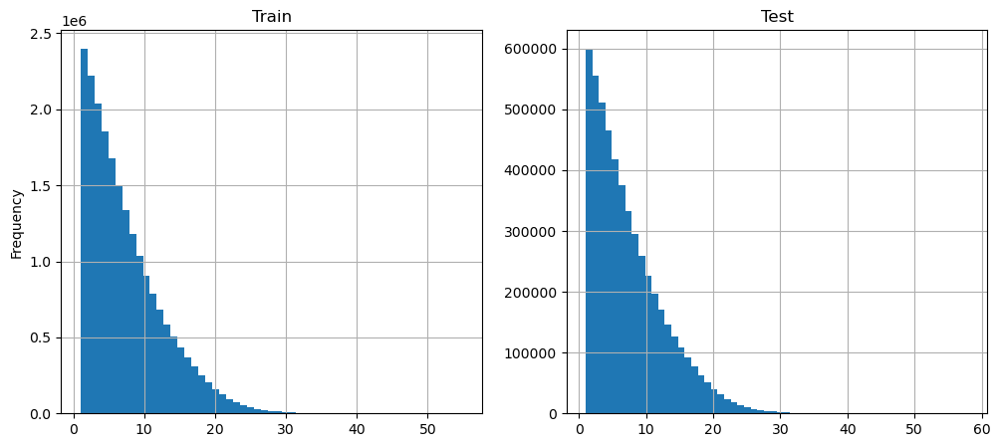

In [53]:
"""
Так как количество уникальных значений признака в train и test наборах отличаются, 
то построим их гистограммы в разных окнах, а для удобного сравнения форм распределений 
зададим каждому графику собственный масштаб (sharey=False)
"""
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=False)

# Гистограмма для train
source_df_train["rn"].hist(bins=55, ax=axes[0])
axes[0].set_title("Train")
axes[0].set_ylabel("Frequency")

# Гистограмма для test
source_df_test["rn"].hist(bins=58, ax=axes[1])
axes[1].set_title("Test")

plt.show()

В тестовом наборе наблюдается немного больше уникальных значений признака rn — 58 против 55 в обучающей выборке, что говорит о наличии клиентов с большим количеством кредитов. Тем не менее, распределения rn в train и test остаются визуально схожими, что свидетельствует о стабильности признака и отсутствии значимого сдвига в данных. Новые значения встречаются крайне редко, не искажают общую структуру распределения и, как следствие, не должны существенно повлиять на предсказательную способность модели.

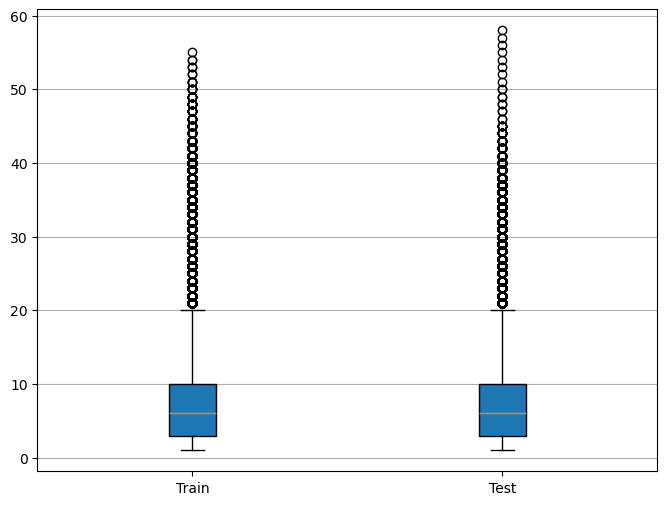

In [54]:
# Оценим визуально наличие выбросов в наборах данных
data = [source_df_train.rn, source_df_test.rn]

plt.figure(figsize=(8, 6))
plt.boxplot(data, tick_labels=["Train", "Test"], patch_artist=True)
plt.grid(axis="y")
plt.show()

На графике заметны выбросы среди клиентов с большим количеством кредитов. Однако я принял решение не удалять эти значения, поскольку они могут отражать важную характеристику - высокую закредитованность. Подобные случаи встречаются и в реальных данных, поэтому исключение таких наблюдений из учебного набора могло бы исказить распределение и снизить способность модели правильно обрабатывать нетипичные сценарии. Важно, чтобы модель оставалась устойчивой к аномалиям и могла эффективно выявлять и оценивать риски, связанные с редкими, но значимыми случаями.

In [55]:
"""
Добавим в df_train/df_test новую колонку 'rn_max',    
содержащую максимальное значение 'rn' для каждого 'id' из df_source.
"""
df_train = create_rn_max_feature(source_df_train, df_train)
df_test = create_rn_max_feature(source_df_test, df_test)
df_train.shape, df_test.shape

((2400000, 3), (600000, 3))

In [56]:
nan_count = df_train.isna().sum().sum()
print("Количество NaN в df_train:", nan_count)

nan_count = df_test.isna().sum().sum()
print("Количество NaN в df_test:", nan_count)

Количество NaN в df_train: 0
Количество NaN в df_test: 0


In [57]:
# Сохраним промежуточный результат
df_train.to_csv("../data/processed/rn_train.csv", index=False)
df_test.to_csv("../data/processed/rn_test.csv", index=False)

## Pre_features

### Research pre_features

In [58]:
source_df_train = pd.read_csv("../data/processed/source_data_train.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [59]:
# Посмотрим на количество уникальных значений признаков
for col in df[pre_features]:
    print(col, df[col].nunique())

pre_since_opened 20
pre_since_confirmed 18
pre_pterm 18
pre_fterm 17
pre_till_pclose 17
pre_till_fclose 16
pre_loans_credit_limit 20
pre_loans_next_pay_summ 7
pre_loans_outstanding 5
pre_loans_total_overdue 2
pre_loans_max_overdue_sum 4
pre_loans_credit_cost_rate 14
pre_loans5 13
pre_loans530 20
pre_loans3060 10
pre_loans6090 5
pre_loans90 7
pre_util 20
pre_over2limit 20
pre_maxover2limit 20


In [60]:
# Посмотрим на признак с двумя значениями
df.pre_loans_total_overdue.value_counts()

pre_loans_total_overdue
0    26162716
1           1
Name: count, dtype: int64

In [61]:
# Удалим его из списка как неинформативный
pre_features_cut = [x for x in pre_features if x != "pre_loans_total_overdue"]
pre_features_cut

['pre_since_opened',
 'pre_since_confirmed',
 'pre_pterm',
 'pre_fterm',
 'pre_till_pclose',
 'pre_till_fclose',
 'pre_loans_credit_limit',
 'pre_loans_next_pay_summ',
 'pre_loans_outstanding',
 'pre_loans_max_overdue_sum',
 'pre_loans_credit_cost_rate',
 'pre_loans5',
 'pre_loans530',
 'pre_loans3060',
 'pre_loans6090',
 'pre_loans90',
 'pre_util',
 'pre_over2limit',
 'pre_maxover2limit']

In [62]:
"""
Посмотрим есть ли различия в уникальных значениях между трен и тест выборками,
выведем только признаки с различиями
"""
for col in pre_features_cut:
    if sorted(source_df_train[col].unique()) != sorted(source_df_test[col].unique()):
        print(col, sorted(source_df_train[col].unique()))
        print(col, sorted(source_df_test[col].unique()))

pre_loans_max_overdue_sum [0, 1, 2, 3]
pre_loans_max_overdue_sum [1, 2, 3]
pre_loans5 [0, 1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 16]
pre_loans5 [0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 13, 16]
pre_loans530 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
pre_loans530 [0, 1, 2, 3, 4, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 18, 19]
pre_loans3060 [0, 1, 2, 3, 5, 6, 7, 8, 9]
pre_loans3060 [1, 2, 4, 5, 6, 7, 8, 9]
pre_loans6090 [1, 2, 3, 4]
pre_loans6090 [0, 1, 2, 3, 4]


В некоторых признаках уникальные значения в тренировочной и тестовой выборках не совпадают,     
что может привести к проблемам с обобщением модели на новых данных.

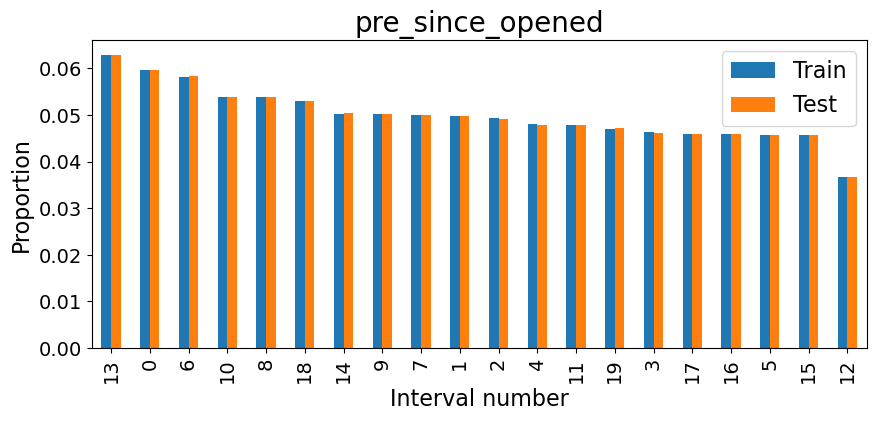

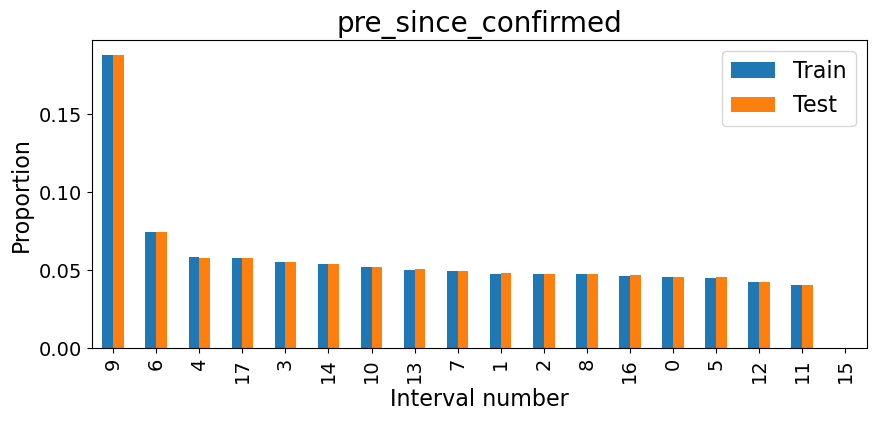

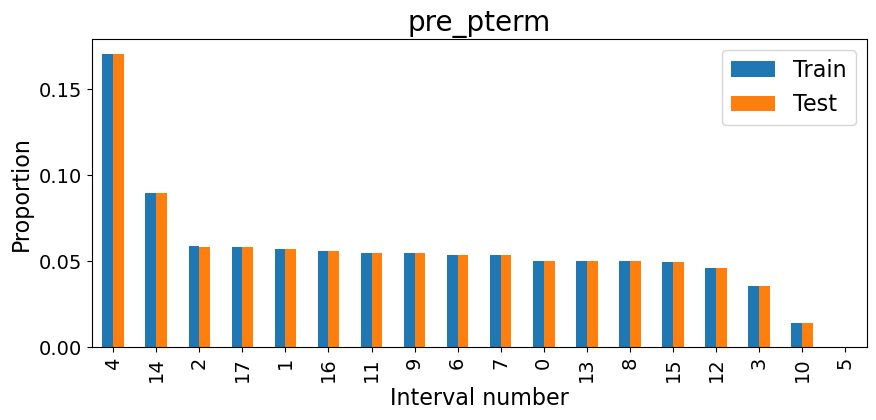

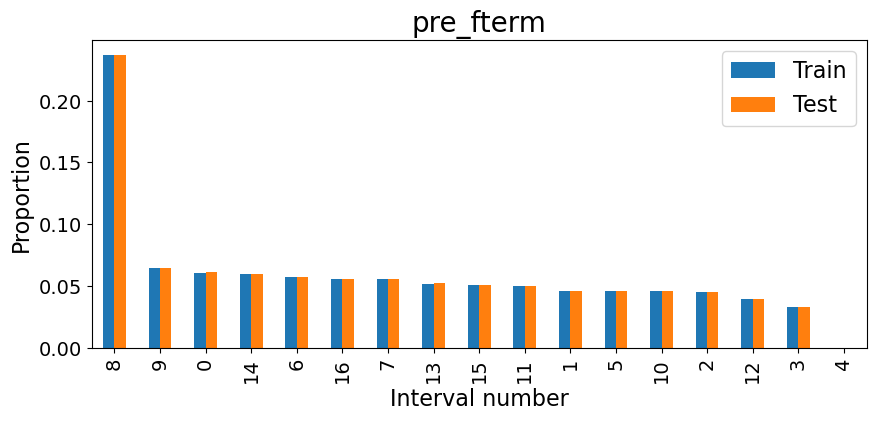

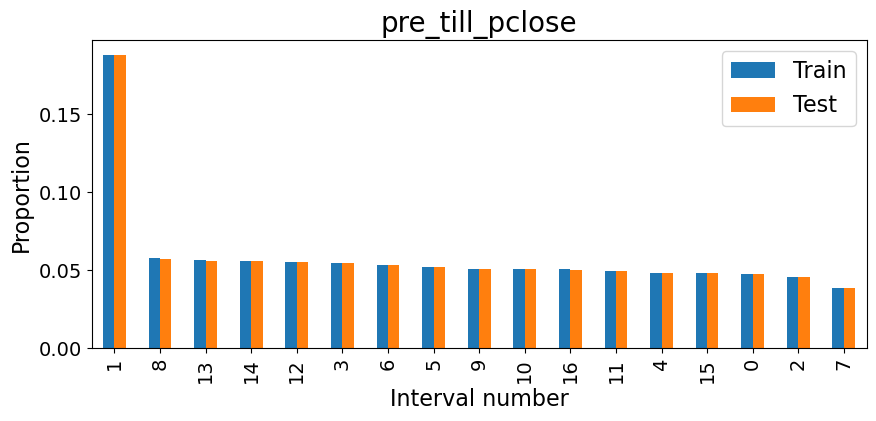

...

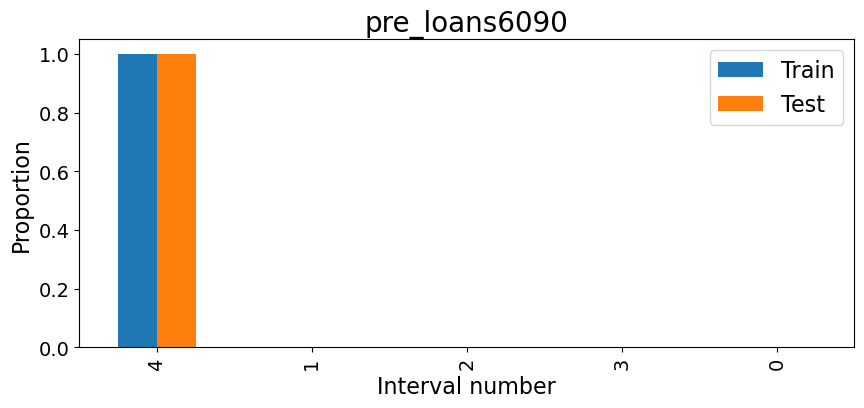

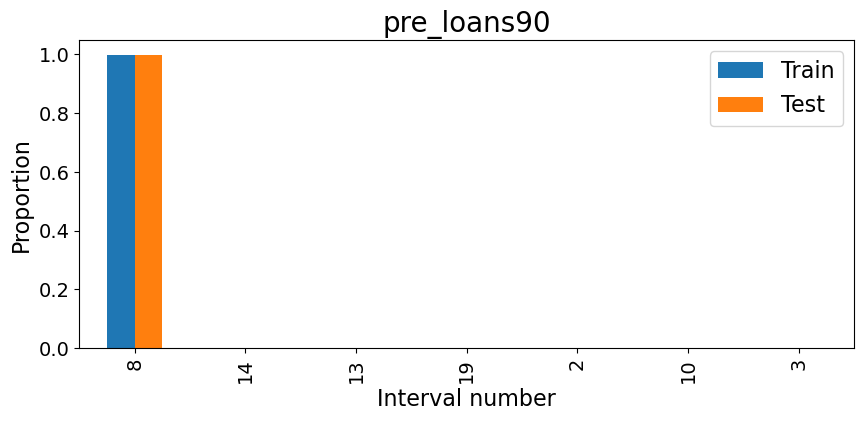

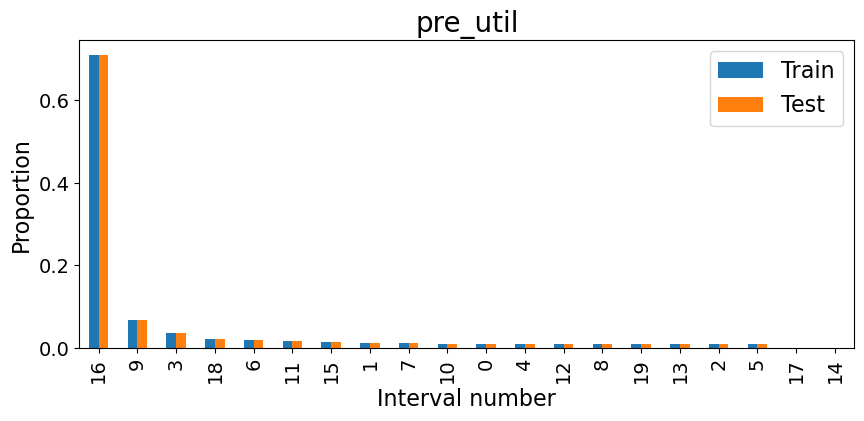

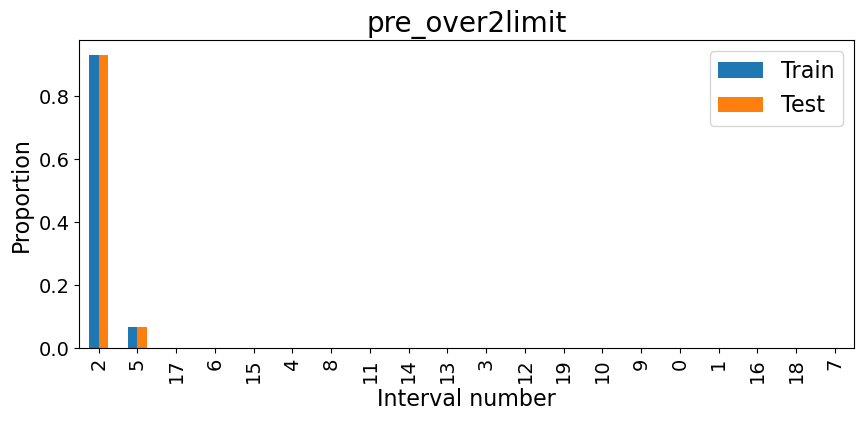

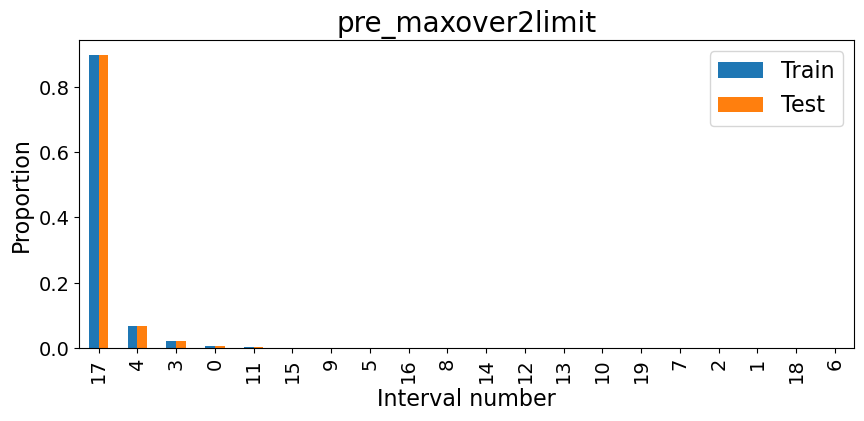

In [64]:
"""
Посмотрим на формы распределений признаков группы и сравним 
их схожесть между тренировочный и тестовым набором
"""
for col in pre_features_cut:
    # Считаем пропорцию каждого уникального значения признака в train и test
    train_counts = source_df_train[col].value_counts(normalize=True)
    test_counts = source_df_test[col].value_counts(normalize=True)

    """
    Объединяем результаты в DataFrame с двумя столбцами: Train и Test.
    Если какая-то категория встречается только в одной из выборок,
    то для другой ставится NaN, который после объединения заменяется  на 0.
    """
    df_plot = pd.DataFrame({"Train": train_counts, "Test": test_counts}).fillna(0)

    """
    Для сортировки категорий по убыванию доли, создадим столбец суммы частот 
    категорий в train и test.
    """
    df_plot["sum"] = df_plot["Train"] + df_plot["Test"]

    # Сортируем датафрейм и удаляем колонку sum
    df_plot_sorted = df_plot.sort_values(by="sum", ascending=False).drop(columns="sum")

    # Строим bar plot
    ax = df_plot_sorted.plot(kind="bar", figsize=(10, 4))

    # Создаём подписи
    ax.set_title(col, fontsize=20)
    ax.set_xlabel("Interval number", fontsize=16)
    ax.set_ylabel("Proportion", fontsize=16)

    # Задаём размер чисел на графике
    ax.tick_params(axis="x", labelsize=14)
    ax.tick_params(axis="y", labelsize=14)

    ax.legend(fontsize=16)
    plt.show()

Визуально распределения признаков практически совпадают, что свидетельствует о корректном разбиении данных и отсутствии явного сдвига между выборками.      
Распределения по большинству признаков сильно смещены: для многих из них наблюдается выраженное преобладание одного или нескольких значений, тогда как остальные встречаются значительно реже. Это говорит о наличии дисбаланса и специфических частотных свойств в данных, что, вероятно, соответствует дисбалансу таргета.  

Бинаризация сильно искажает информацию о реальных значениях признаков: после неё нельзя утверждать, что большее значение бинаризованного признака соответствует большему количеству исходного или наоборот. При бинаризации теряется количественная информация, и признаки становятся лишь индикаторами попадания в некий общий интервал исходного признака.   
Поэтому поиск выбросов для бинаризованных признаков теряет смысл, 
а для построения признаков тренировочного датасета следует опираться на частотные свойства значений признаков.

### Create proportion value pre_feature

In [239]:
df_train = pd.read_csv("../data/processed/rn_train.csv")
df_test = pd.read_csv("../data/processed/rn_test.csv")
df_train.shape, df_test.shape

((2400000, 3), (600000, 3))

In [240]:
""" 
Создадим словарь, где ключами будут имена исходных признаков из pre_features,
а значениями — три уникальных значения признака, на основе которых
были созданы новые частотные признаки с наибольшим вкладом в качество модели.
"""
pre_prop_features_dictionary = {}

for col in pre_features_cut:
    print("-" * 50)
    print("Исходный признак:", col)

    # Создаём новые частотные признаки для каждого уникального значения признака col
    df_train, new_features_list = create_all_value_proportion_features(
        source_df_train, df_train, col
    )
    print("Новые признаки тренировочного датасета:\n" + "\n".join(new_features_list))

    # Определяем 3 наиболее важных значения признака с помощью CatBoost
    values = choose_n_most_imp_features(df_train, new_features_list, 3)
    print("Наиболее важные категории признака:", values)

    # Сохраняем их в словарь
    pre_prop_features_dictionary[col] = values

    # Удаляем все новые признаки из тренировочного датафрейма
    df_train = df_train.drop(new_features_list, axis=1)

--------------------------------------------------
Исходный признак: pre_since_opened
Новые признаки тренировочного датасета:
pre_since_opened_prop_0
pre_since_opened_prop_1
pre_since_opened_prop_2
pre_since_opened_prop_3
pre_since_opened_prop_4
pre_since_opened_prop_5
pre_since_opened_prop_6
pre_since_opened_prop_7
pre_since_opened_prop_8
pre_since_opened_prop_9
pre_since_opened_prop_10
pre_since_opened_prop_11
pre_since_opened_prop_12
pre_since_opened_prop_13
pre_since_opened_prop_14
pre_since_opened_prop_15
pre_since_opened_prop_16
pre_since_opened_prop_17
pre_since_opened_prop_18
pre_since_opened_prop_19
Среднее ROC AUC на трейне: 0.6363 ± 0.0018
Среднее ROC AUC на валидации: 0.6219 ± 0.0012
Наиболее важные категории признака: [12, 19, 8]
--------------------------------------------------
Исходный признак: pre_since_confirmed
Новые признаки тренировочного датасета:
pre_since_confirmed_prop_0
pre_since_confirmed_prop_1
pre_since_confirmed_prop_2
pre_since_confirmed_prop_3
pre_since_

In [241]:
pre_prop_features_dictionary

{'pre_since_opened': [12, 19, 8],
 'pre_since_confirmed': [7, 4, 9],
 'pre_pterm': [6, 3, 4],
 'pre_fterm': [3, 8, 7],
 'pre_till_pclose': [0, 10, 7],
 'pre_till_fclose': [4, 3, 1],
 'pre_loans_credit_limit': [2, 18, 15],
 'pre_loans_next_pay_summ': [5, 2, 0],
 'pre_loans_outstanding': [3, 5, 1],
 'pre_loans_max_overdue_sum': [2, 1, 3],
 'pre_loans_credit_cost_rate': [6, 4, 11],
 'pre_loans5': [6, 0, 3],
 'pre_loans530': [13, 16, 2],
 'pre_loans3060': [5, 8, 9],
 'pre_loans6090': [4, 2, 1],
 'pre_loans90': [8, 14, 13],
 'pre_util': [16, 6, 3],
 'pre_over2limit': [2, 5, 17],
 'pre_maxover2limit': [17, 4, 9]}

In [242]:
# Создадим признаки из выбранных значений в тренировочном датасете
df_train = create_definite_value_proportion_features(
    source_df_train, df_train, pre_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: pre_since_opened
Новые фичи:
pre_since_opened_prop_12
pre_since_opened_prop_19
pre_since_opened_prop_8
--------------------------------------------------
Исходный признак: pre_since_confirmed
Новые фичи:
pre_since_confirmed_prop_7
pre_since_confirmed_prop_4
pre_since_confirmed_prop_9
--------------------------------------------------
Исходный признак: pre_pterm
Новые фичи:
pre_pterm_prop_6
pre_pterm_prop_3
pre_pterm_prop_4
--------------------------------------------------
Исходный признак: pre_fterm
Новые фичи:
pre_fterm_prop_3
pre_fterm_prop_8
pre_fterm_prop_7
--------------------------------------------------
Исходный признак: pre_till_pclose
Новые фичи:
pre_till_pclose_prop_0
pre_till_pclose_prop_10
pre_till_pclose_prop_7
--------------------------------------------------
Исходный признак: pre_till_fclose
Новые фичи:
pre_till_fclose_prop_4
pre_till_fclose_prop_3
pre_till_fclose_prop_1
-----------------------------

In [243]:
# Создадим признаки из выбранных значений в тестовом датасете
df_test = create_definite_value_proportion_features(
    source_df_test, df_test, pre_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: pre_since_opened
Новые фичи:
pre_since_opened_prop_12
pre_since_opened_prop_19
pre_since_opened_prop_8
--------------------------------------------------
Исходный признак: pre_since_confirmed
Новые фичи:
pre_since_confirmed_prop_7
pre_since_confirmed_prop_4
pre_since_confirmed_prop_9
--------------------------------------------------
Исходный признак: pre_pterm
Новые фичи:
pre_pterm_prop_6
pre_pterm_prop_3
pre_pterm_prop_4
--------------------------------------------------
Исходный признак: pre_fterm
Новые фичи:
pre_fterm_prop_3
pre_fterm_prop_8
pre_fterm_prop_7
--------------------------------------------------
Исходный признак: pre_till_pclose
Новые фичи:
pre_till_pclose_prop_0
pre_till_pclose_prop_10
pre_till_pclose_prop_7
--------------------------------------------------
Исходный признак: pre_till_fclose
Новые фичи:
pre_till_fclose_prop_4
pre_till_fclose_prop_3
pre_till_fclose_prop_1
-----------------------------

In [70]:
# Запишем промежуточные результаты в файлы
df_train.to_csv("../data/processed/pre_p_rn_train.csv", index=False)
df_test.to_csv("../data/processed/pre_p_rn_test.csv", index=False)
df_train.shape, df_test.shape

((2400000, 60), (600000, 60))

In [244]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[3:]

for col in columns:
    print(df_train[col].nunique(), col)

483 pre_since_opened_prop_12
370 pre_since_opened_prop_19
255 pre_since_opened_prop_8
226 pre_since_confirmed_prop_7
240 pre_since_confirmed_prop_4
463 pre_since_confirmed_prop_9
230 pre_pterm_prop_6
493 pre_pterm_prop_3
536 pre_pterm_prop_4
483 pre_fterm_prop_3
495 pre_fterm_prop_8
199 pre_fterm_prop_7
222 pre_till_pclose_prop_0
273 pre_till_pclose_prop_10
452 pre_till_pclose_prop_7
182 pre_till_fclose_prop_4
245 pre_till_fclose_prop_3
236 pre_till_fclose_prop_1
320 pre_loans_credit_limit_prop_2
453 pre_loans_credit_limit_prop_18
228 pre_loans_credit_limit_prop_15
300 pre_loans_next_pay_summ_prop_5
468 pre_loans_next_pay_summ_prop_2
229 pre_loans_next_pay_summ_prop_0
336 pre_loans_outstanding_prop_3
152 pre_loans_outstanding_prop_5
205 pre_loans_outstanding_prop_1
335 pre_loans_max_overdue_sum_prop_2
289 pre_loans_max_overdue_sum_prop_1
238 pre_loans_max_overdue_sum_prop_3
521 pre_loans_credit_cost_rate_prop_6
512 pre_loans_credit_cost_rate_prop_4
287 pre_loans_credit_cost_rate_prop_1

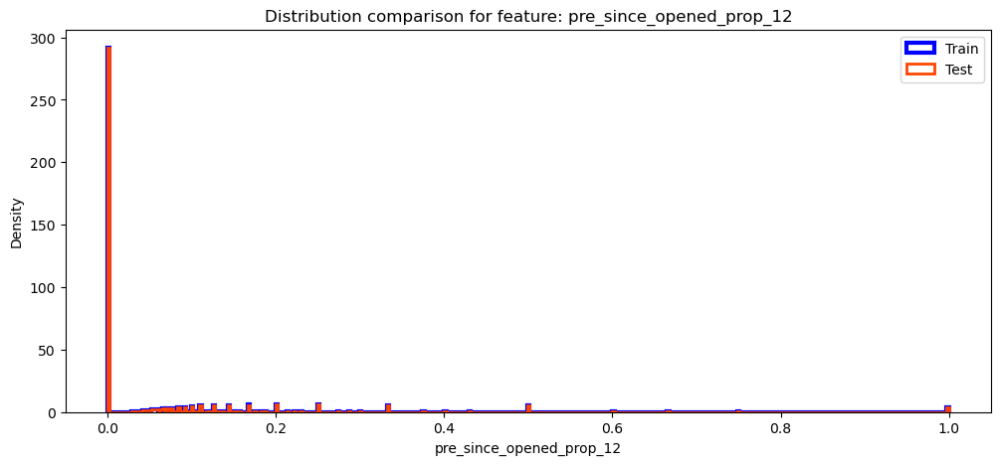

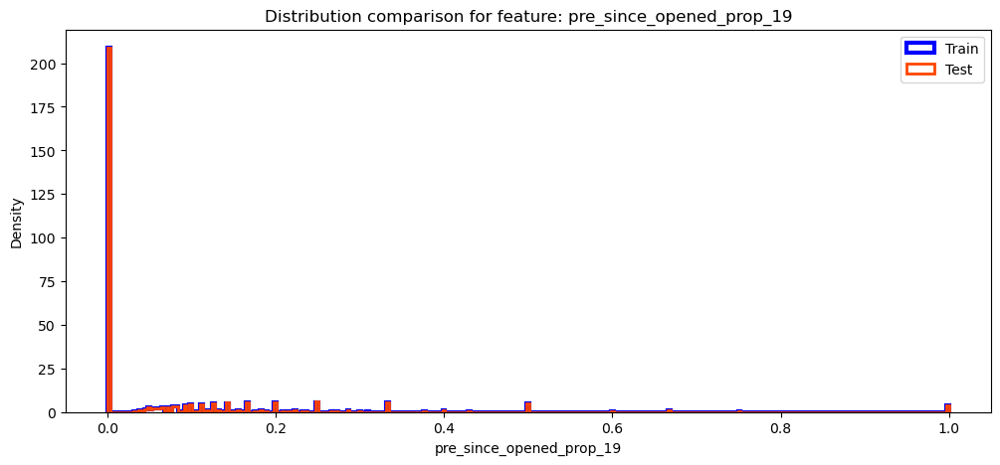

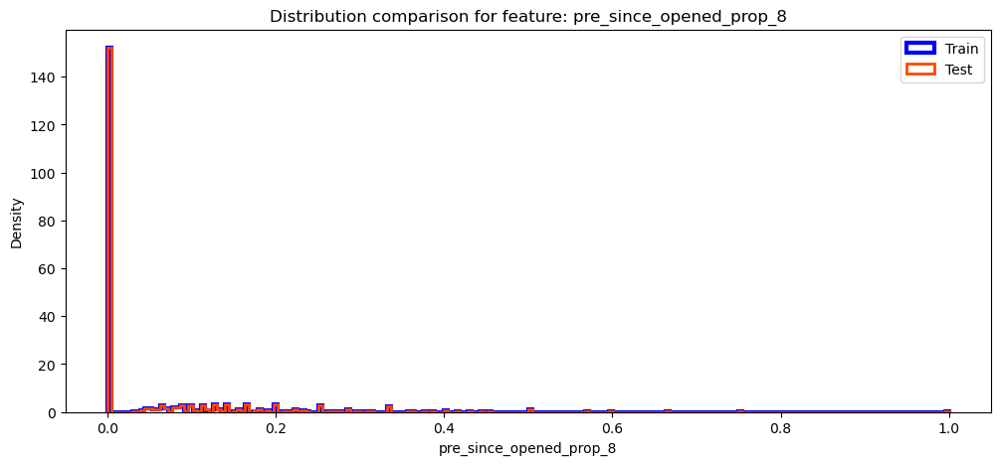

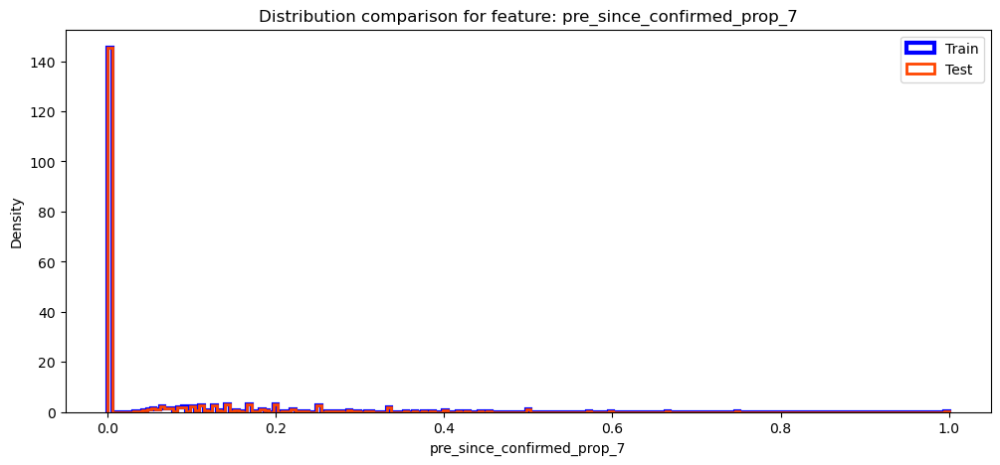

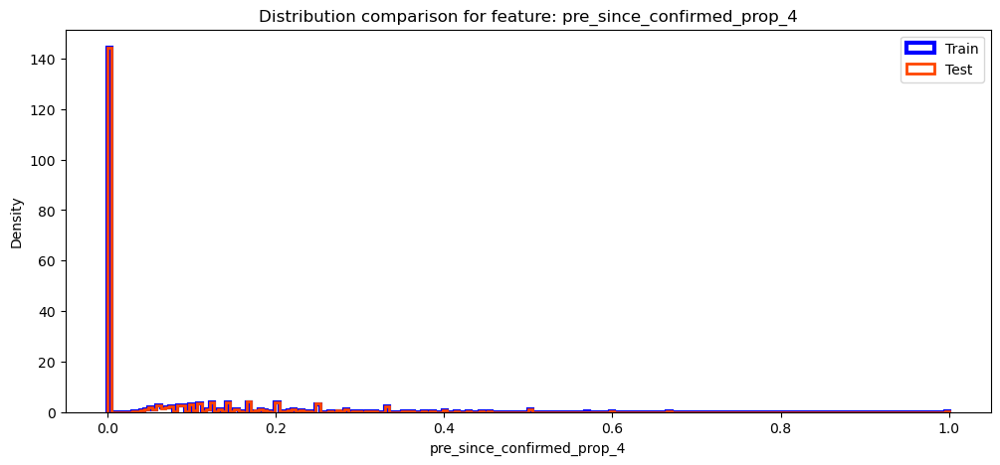

...

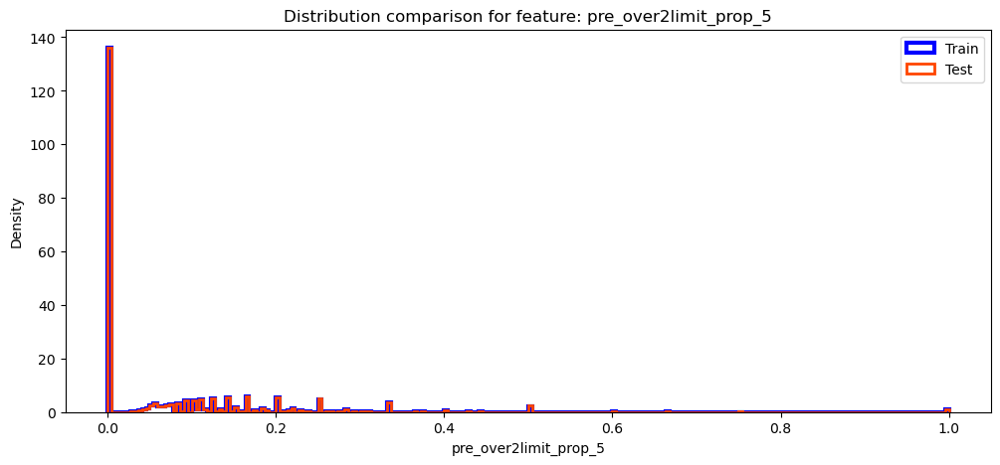

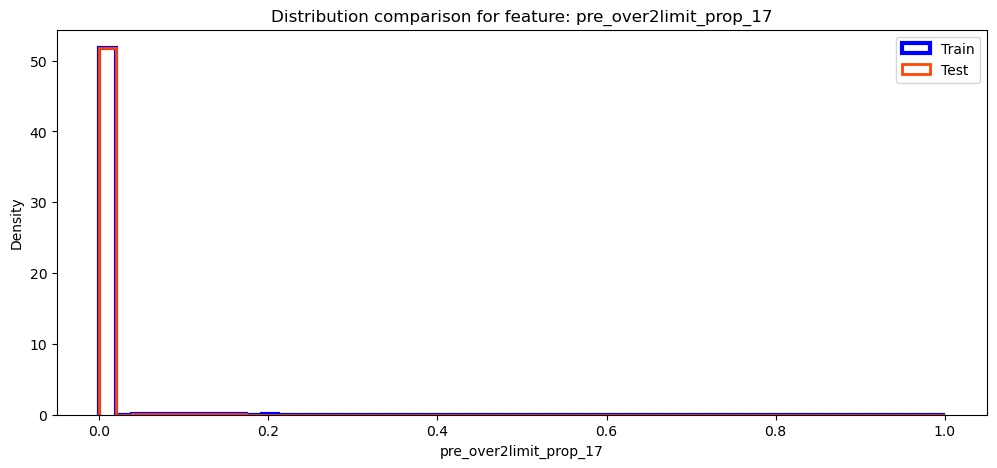

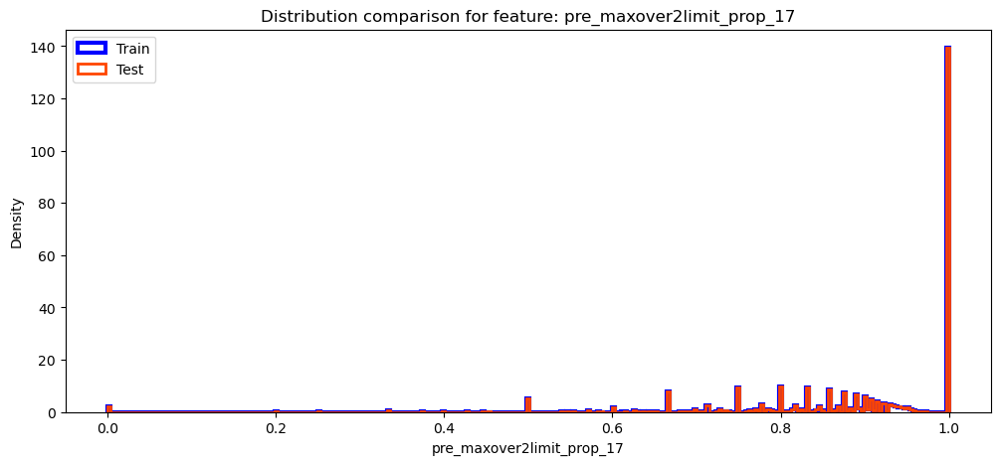

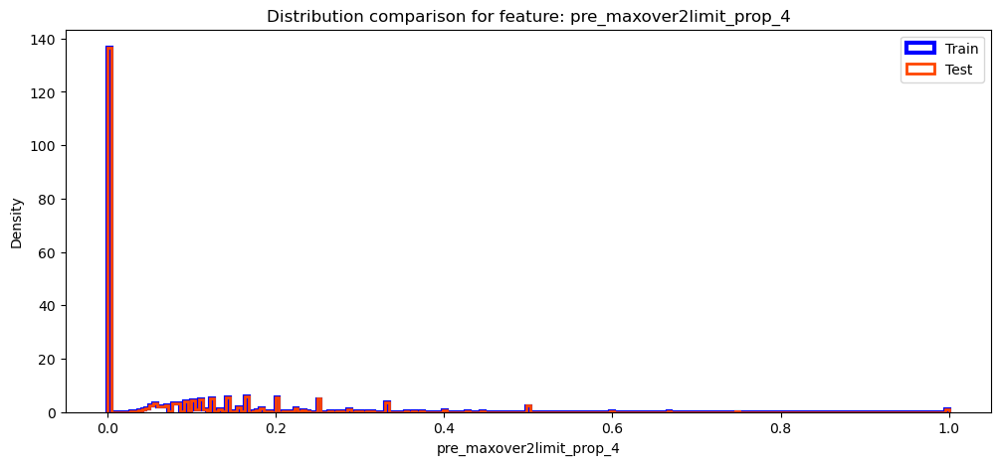

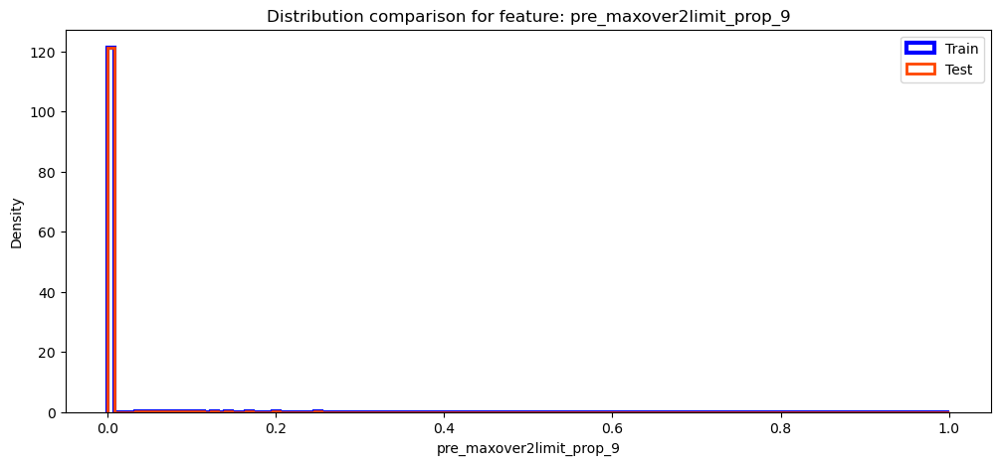

In [72]:
# Визуально сравним распределения признаков для тренировочного и тестового датасетов
columns = df_train.columns[3:]
for col in columns:
    plt.figure(figsize=(12, 5))

    # Выбираем количество бинов как минимальное число уникальных значений в train и test
    bins = min(df_train[col].nunique(), df_test[col].nunique())

    # Строим нормализованные гистограммы для тренировочного и тестового наборов
    plt.hist(
        df_train[col],
        bins=bins,
        density=True,
        label="Train",
        color="blue",
        histtype="step",
        linewidth=3,
    )
    plt.hist(
        df_test[col],
        bins=bins,
        density=True,
        label="Test",
        color="orangered",
        histtype="step",
        linewidth=2,
    )

    plt.title(f"Distribution comparison for feature: {col}")
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.legend()
    plt.show()

За исключением pre_loans3060_prop_9 распределения практически совпадают.   
Можно отметить что смещение распределений усилилось по сравнению с исходными признаками.

In [245]:
# Проведём кроссвалидацию нового датасета
df_metrics, importances_dict = check_cat_boost(df_train, df_test, "pre_p_rn")

Фолд 0
ROC AUC на трейне: 0.7479
ROC AUC на валидации: 0.7268
ROC AUC на тесте: 0.7256
Фолд 1
ROC AUC на трейне: 0.7461
ROC AUC на валидации: 0.7227
ROC AUC на тесте: 0.7258
Фолд 2
ROC AUC на трейне: 0.7460
ROC AUC на валидации: 0.7233
ROC AUC на тесте: 0.7263
Фолд 3
ROC AUC на трейне: 0.7454
ROC AUC на валидации: 0.7248
ROC AUC на тесте: 0.7265
Фолд 4
ROC AUC на трейне: 0.7452
ROC AUC на валидации: 0.7241
ROC AUC на тесте: 0.7260
Среднее ROC AUC на трейне: 0.7461 ± 0.0009
Среднее ROC AUC на валидации: 0.7243 ± 0.0014
Среднее ROC AUC на тесте: 0.7260 ± 0.0003


In [75]:
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326


In [76]:
# Посмотрим на важности признаков
importances_dict

{'pre_loans_credit_limit_prop_2': 6.376457919873512,
 'pre_util_prop_3': 5.5796541574975,
 'pre_util_prop_16': 5.255955813946264,
 'rn_max': 4.821434332757035,
 'pre_loans_credit_cost_rate_prop_6': 4.6313343374306895,
 'pre_till_pclose_prop_10': 4.406546352355341,
 'pre_loans_max_overdue_sum_prop_2': 4.27265930851066,
 'pre_util_prop_6': 4.109190451463819,
 'pre_since_opened_prop_12': 4.063472699933333,
 'pre_loans_credit_cost_rate_prop_4': 3.260494649492927,
 'pre_loans_next_pay_summ_prop_2': 3.1928362158296006,
 'pre_loans_max_overdue_sum_prop_1': 3.147872631654345,
 'pre_loans_credit_cost_rate_prop_11': 3.017675727010026,
 'pre_loans_outstanding_prop_1': 2.9772081398563963,
 'pre_loans_next_pay_summ_prop_5': 2.59410965272306,
 'pre_fterm_prop_8': 2.3815563754818414,
 'pre_pterm_prop_6': 2.279425445971348,
 'pre_maxover2limit_prop_17': 2.1491539414438616,
 'pre_loans_credit_limit_prop_18': 2.1323545632698,
 'pre_loans_credit_limit_prop_15': 1.932169274411099,
 'pre_loans_outstanding_

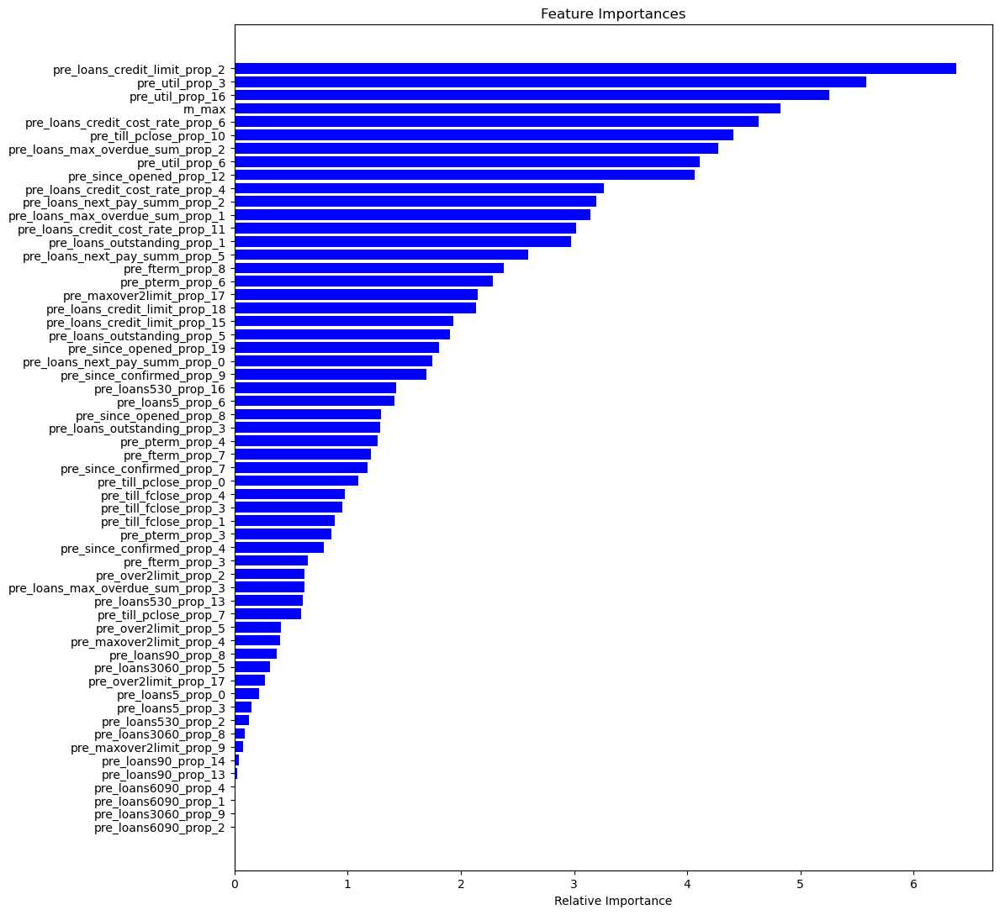

In [77]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

### Create mean value frequency pre_features

In [78]:
df_train = pd.read_csv("../data/processed/pre_p_rn_train.csv")
df_test = pd.read_csv("../data/processed/pre_p_rn_test.csv")
df_train.shape, df_test.shape

((2400000, 60), (600000, 60))

Циклом пройдём по списку pre_features и для каждого исходного признака  
создадим агрегированный признак отражающий суммированную относительную встречаемость  
значений исходного признака по каждому id, нормированную на количество записей у id.  

In [79]:
print("New  df_train columns")
for col in pre_features_cut:
    df_train = create_mean_values_frequency_feature(source_df_train, df_train, col)

df_train.shape

New  df_train columns
pre_since_opened_mean_freq
pre_since_confirmed_mean_freq
pre_pterm_mean_freq
pre_fterm_mean_freq
pre_till_pclose_mean_freq
pre_till_fclose_mean_freq
pre_loans_credit_limit_mean_freq
pre_loans_next_pay_summ_mean_freq
pre_loans_outstanding_mean_freq
pre_loans_max_overdue_sum_mean_freq
pre_loans_credit_cost_rate_mean_freq
pre_loans5_mean_freq
pre_loans530_mean_freq
pre_loans3060_mean_freq
pre_loans6090_mean_freq
pre_loans90_mean_freq
pre_util_mean_freq
pre_over2limit_mean_freq
pre_maxover2limit_mean_freq


(2400000, 79)

In [80]:
print("New df_test columns")
for col in pre_features_cut:
    df_test = create_mean_values_frequency_feature(source_df_test, df_test, col)

df_test.shape

New df_test columns
pre_since_opened_mean_freq
pre_since_confirmed_mean_freq
pre_pterm_mean_freq
pre_fterm_mean_freq
pre_till_pclose_mean_freq
pre_till_fclose_mean_freq
pre_loans_credit_limit_mean_freq
pre_loans_next_pay_summ_mean_freq
pre_loans_outstanding_mean_freq
pre_loans_max_overdue_sum_mean_freq
pre_loans_credit_cost_rate_mean_freq
pre_loans5_mean_freq
pre_loans530_mean_freq
pre_loans3060_mean_freq
pre_loans6090_mean_freq
pre_loans90_mean_freq
pre_util_mean_freq
pre_over2limit_mean_freq
pre_maxover2limit_mean_freq


(600000, 79)

In [81]:
# Запишем промежуточные результаты в файлы
df_train.to_csv("../data/processed/pre_f_p_rn_train.csv", index=False)
df_test.to_csv("../data/processed/pre_f_p_rn_test.csv", index=False)
df_train.shape, df_test.shape

((2400000, 79), (600000, 79))

In [82]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-19:]

for col in columns:
    print(df_train[col].nunique(), col)

1334951 pre_since_opened_mean_freq
1247657 pre_since_confirmed_mean_freq
1260740 pre_pterm_mean_freq
1159709 pre_fterm_mean_freq
1245038 pre_till_pclose_mean_freq
1124589 pre_till_fclose_mean_freq
1360109 pre_loans_credit_limit_mean_freq
108618 pre_loans_next_pay_summ_mean_freq
9832 pre_loans_outstanding_mean_freq
2162 pre_loans_max_overdue_sum_mean_freq
742565 pre_loans_credit_cost_rate_mean_freq
1668 pre_loans5_mean_freq
5910 pre_loans530_mean_freq
314 pre_loans3060_mean_freq
81 pre_loans6090_mean_freq
335 pre_loans90_mean_freq
328242 pre_util_mean_freq
5817 pre_over2limit_mean_freq
27874 pre_maxover2limit_mean_freq


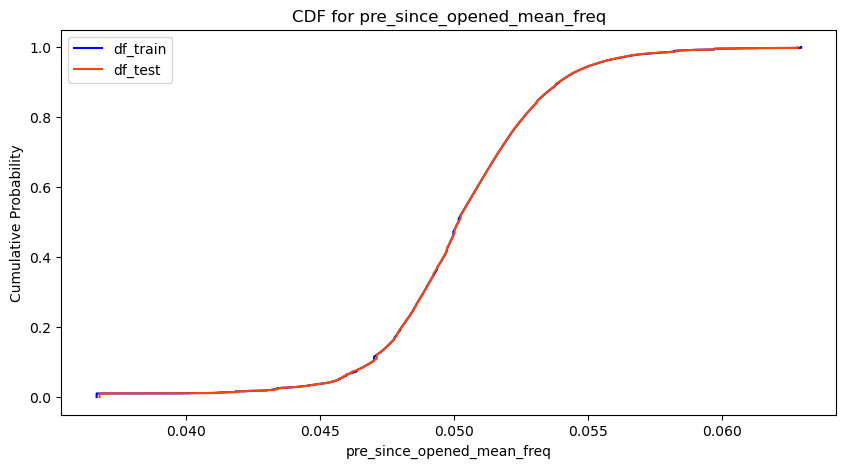

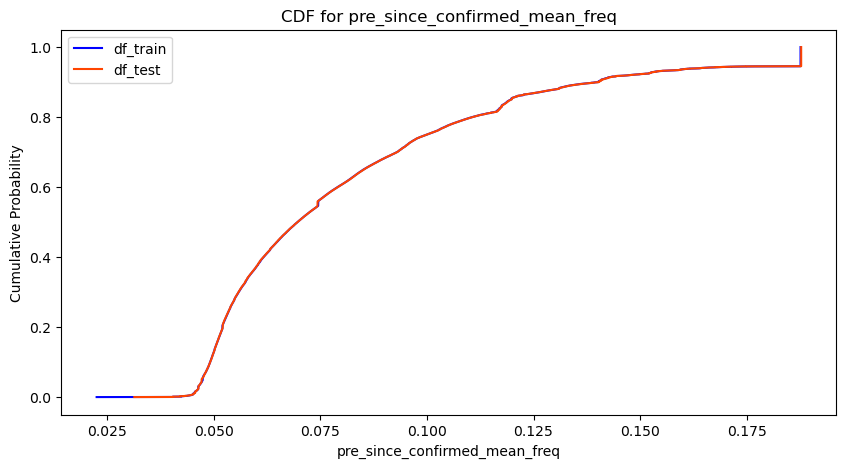

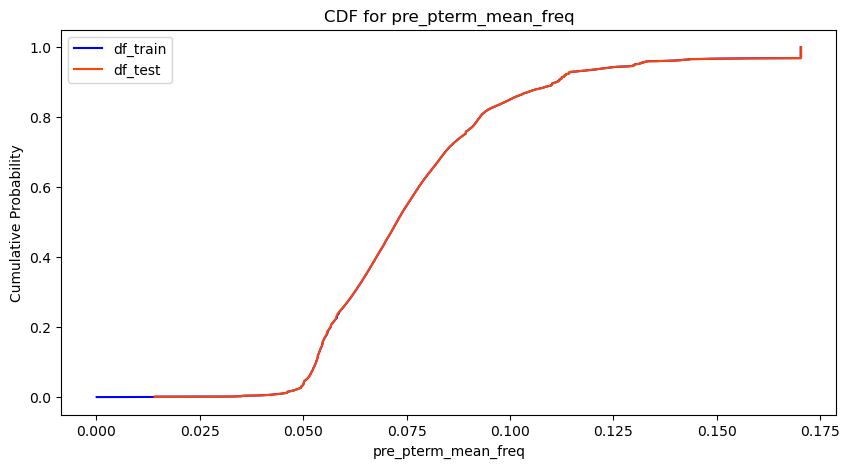

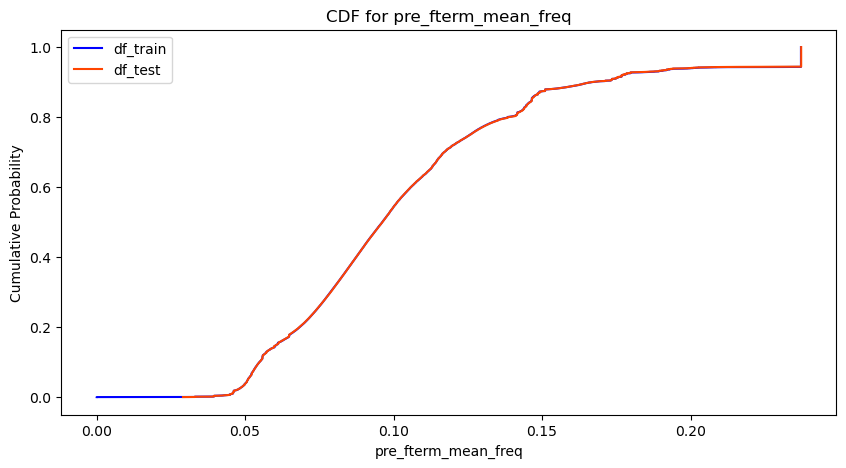

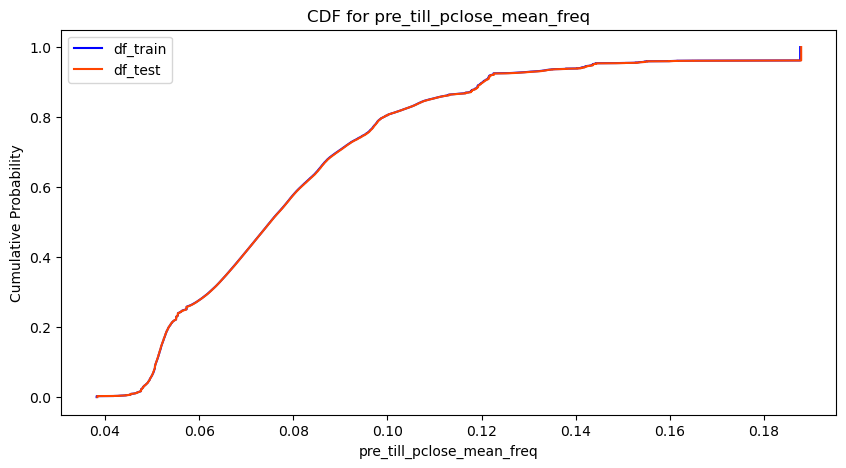

...

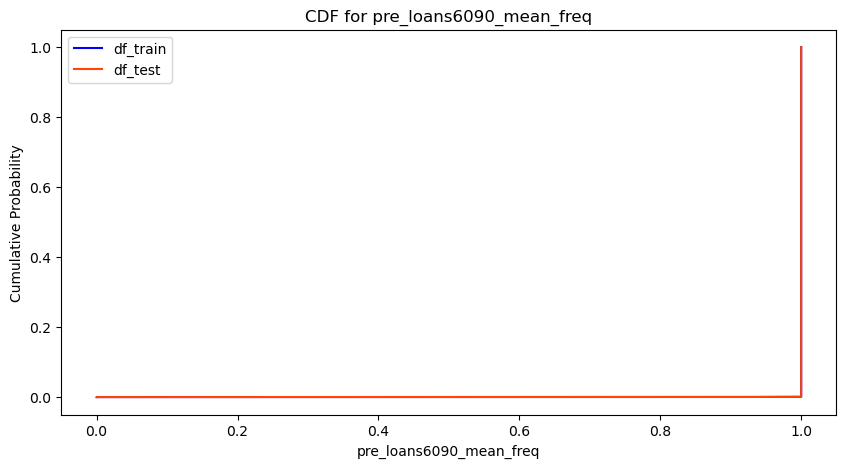

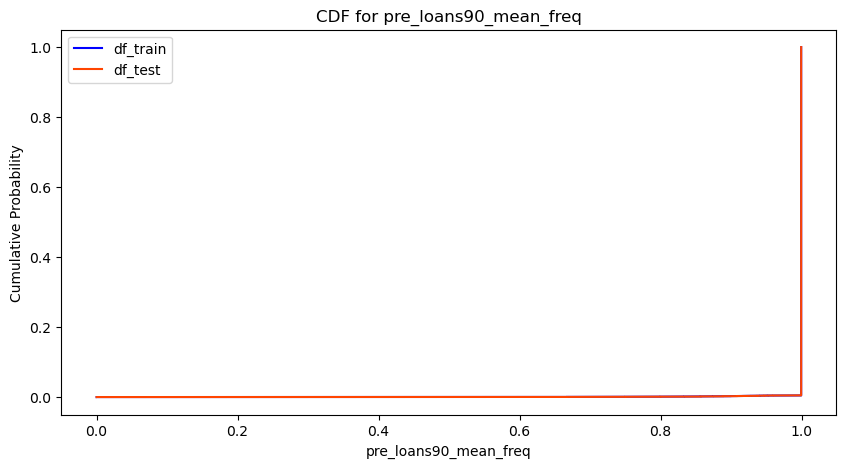

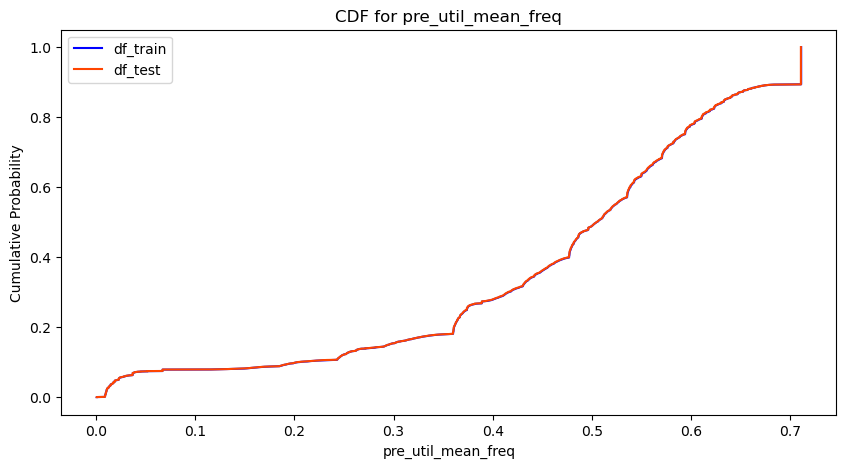

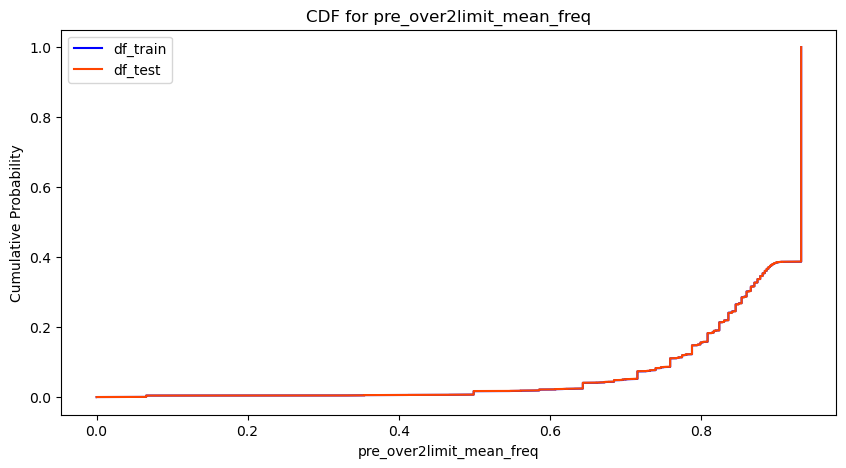

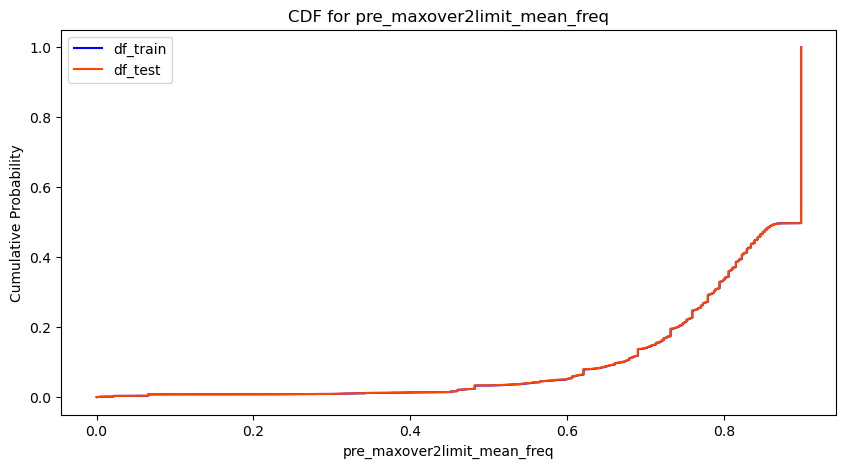

In [83]:
""" 
Так как у нас есть признаки с очень большим количеством уникальных значений 
то для сравнения распределений новых признаков используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-19:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

Распределения новых признаков в тренировочном и тестовом датасетах практически идентичны.
Распределения некоторых признаки имеют сильный перекос. 

In [85]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(df_train, df_test, "pre_f_p_rn")

Фолд 0
ROC AUC на трейне: 0.7507
ROC AUC на валидации: 0.7315
ROC AUC на тесте: 0.7292
Фолд 1
ROC AUC на трейне: 0.7522
ROC AUC на валидации: 0.7279
ROC AUC на тесте: 0.7293
Фолд 2
ROC AUC на трейне: 0.7515
ROC AUC на валидации: 0.7267
ROC AUC на тесте: 0.7294
Фолд 3
ROC AUC на трейне: 0.7623
ROC AUC на валидации: 0.7276
ROC AUC на тесте: 0.7292
Фолд 4
ROC AUC на трейне: 0.7510
ROC AUC на валидации: 0.7278
ROC AUC на тесте: 0.7297
Среднее ROC AUC на трейне: 0.7535 ± 0.0044
Среднее ROC AUC на валидации: 0.7283 ± 0.0016
Среднее ROC AUC на тесте: 0.7293 ± 0.0002


In [86]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196


In [87]:
# Посмотрим на важности признаков
importances_dict

{'pre_loans_credit_limit_prop_2': 5.6804090789257815,
 'pre_util_prop_3': 4.962454227907478,
 'pre_loans_credit_cost_rate_prop_6': 4.452110235755611,
 'pre_since_opened_mean_freq': 4.33822323858817,
 'pre_till_pclose_prop_10': 3.914136034415266,
 'rn_max': 3.6952836916156486,
 'pre_util_prop_6': 3.661882795614431,
 'pre_loans_credit_limit_mean_freq': 3.164961466612138,
 'pre_loans_max_overdue_sum_prop_1': 2.928329326206444,
 'pre_util_prop_16': 2.923756028824394,
 'pre_since_opened_prop_12': 2.8419989147883196,
 'pre_loans_credit_cost_rate_prop_11': 2.780109437665167,
 'pre_util_mean_freq': 2.744236578827554,
 'pre_loans_outstanding_prop_1': 2.6338910825309005,
 'pre_loans_credit_cost_rate_prop_4': 2.5970933756493193,
 'pre_loans_next_pay_summ_prop_5': 2.234772426430629,
 'pre_loans_credit_cost_rate_mean_freq': 2.234575831132636,
 'pre_till_fclose_mean_freq': 2.035984553568312,
 'pre_loans_max_overdue_sum_prop_2': 1.9995950196290464,
 'pre_pterm_prop_6': 1.9452148253223687,
 'pre_loans

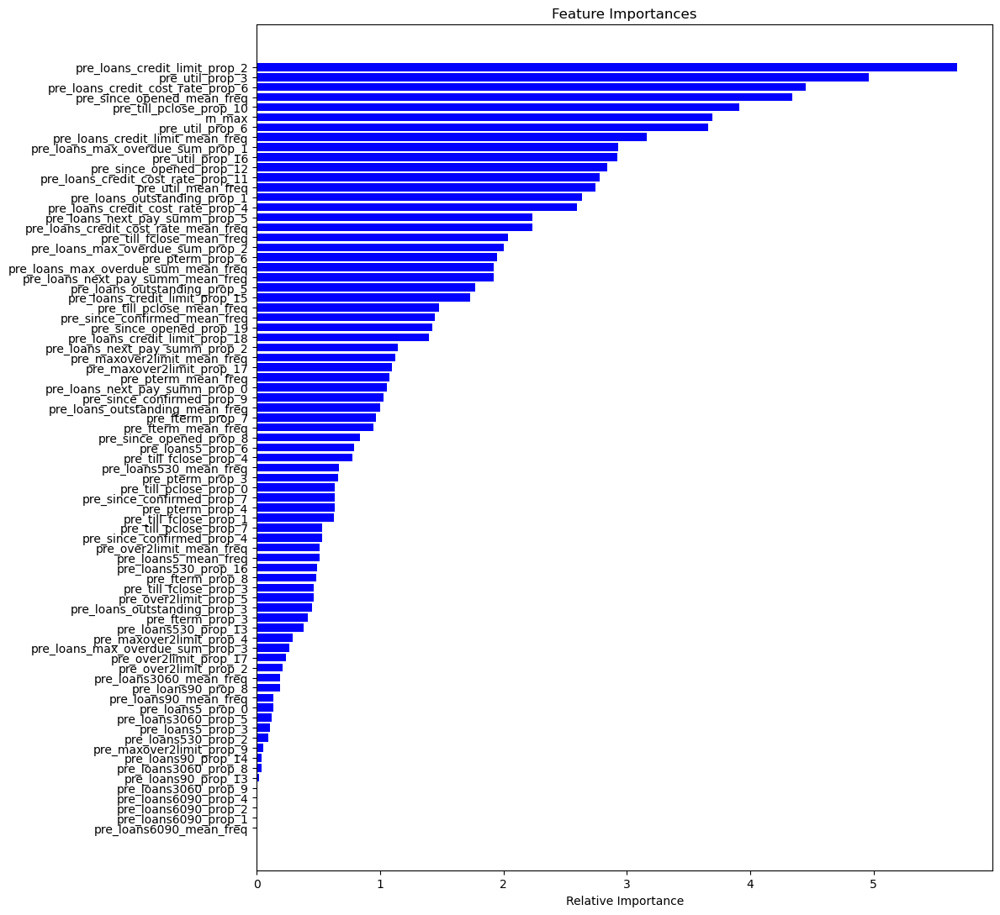

In [88]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

## Enc_features

### Research enc_features

In [89]:
source_df_train = pd.read_csv("../data/processed/source_data_train.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [90]:
# Посмотрим на количество уникальных значений признаков в train и test
for col in enc_features:
    print(
        f"{col} train: {source_df_train[col].nunique()}"
        f"  test: {source_df_test[col].nunique()}"
    )

enc_loans_account_holder_type train: 7  test: 7
enc_loans_credit_status train: 7  test: 7
enc_loans_credit_type train: 8  test: 8
enc_loans_account_cur train: 4  test: 4


In [91]:
"""
Посмотрим есть ли различия в уникальных значениях между трен и тест выборками,
выведем только признаки с различиями
"""
found_difference = False
for col in enc_features:
    if sorted(source_df_train[col].unique()) != sorted(source_df_test[col].unique()):
        print(col, sorted(source_df_train[col].unique()))
        print(col, sorted(source_df_test[col].unique()))
        found_difference = True
if not found_difference:
    print("All values are matched")

All values are matched


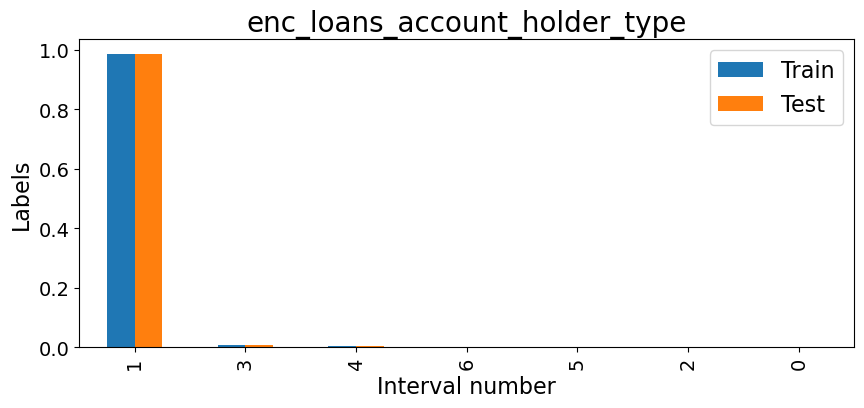

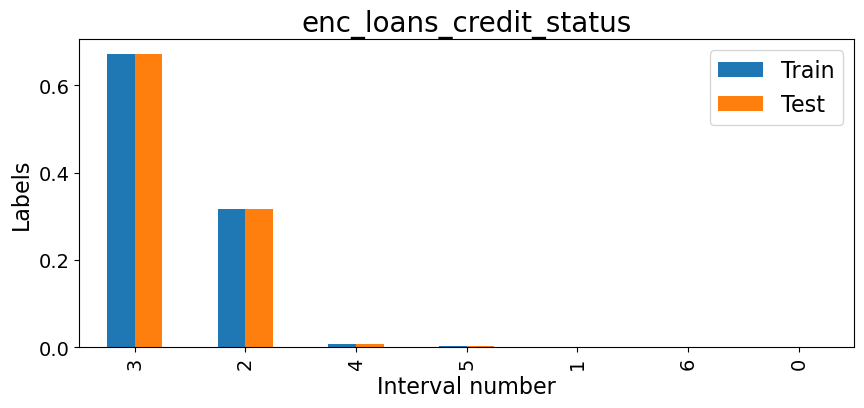

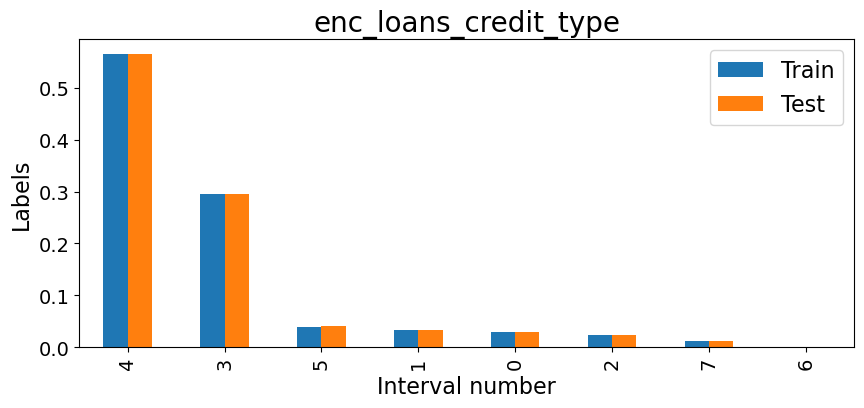

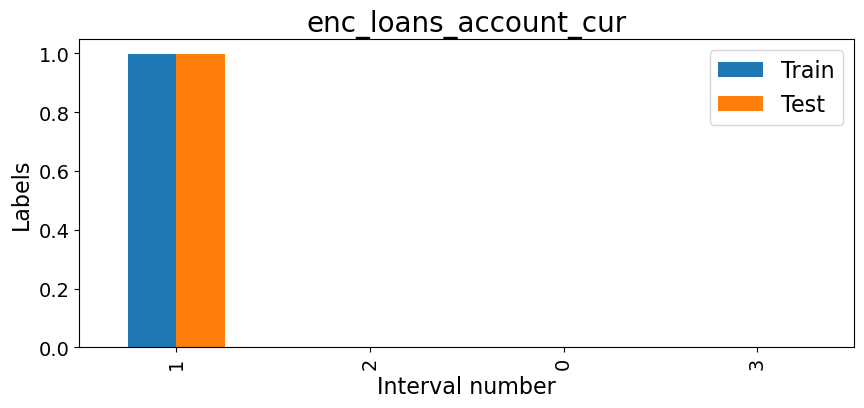

In [92]:
"""
Посмотрим на формы распределений признаков группы и сравним 
их схожесть между тренировочный и тестовым набором.
"""
for col in enc_features:
    # Считаем пропорцию каждого уникального значения признака в train и test
    train_counts = source_df_train[col].value_counts(normalize=True)
    test_counts = source_df_test[col].value_counts(normalize=True)

    """
    Объединяем результаты в DataFrame с двумя столбцами: Train и Test.
    Если какая-то категория встречается только в одной из выборок,
    то для другой ставится NaN, который после объединения заменяется  на 0.
    """
    df_plot = pd.DataFrame({"Train": train_counts, "Test": test_counts}).fillna(0)

    """
    Для сортировки категорий по убыванию доли, создадим столбец суммы частот 
    категорий в train и test.
    """
    df_plot["sum"] = df_plot["Train"] + df_plot["Test"]

    # Сортируем датафрейм и удаляем колонку sum
    df_plot_sorted = df_plot.sort_values(by="sum", ascending=False).drop(columns="sum")

    # Строим bar plot
    ax = df_plot_sorted.plot(kind="bar", figsize=(10, 4))

    # Создаём подписи
    ax.set_title(col, fontsize=20)
    ax.set_xlabel("Interval number", fontsize=16)
    ax.set_ylabel("Labels", fontsize=16)

    # Задаём размер чисел на графике
    ax.tick_params(axis="x", labelsize=14)
    ax.tick_params(axis="y", labelsize=14)

    ax.legend(fontsize=16)
    plt.show()

Можно сделать выводы схожие с выводами из Research pre_features.
Распределения признаков сильно смещены: для многих из них наблюдается выраженное преобладание одного или нескольких значений, тогда как остальные встречаются значительно реже. Это говорит о наличии дисбаланса и специфических частотных свойств в данных, что, вероятно, соответствует дисбалансу таргета.

Кодирование меньше искажает информацию о реальных значениях признаков чем бинаризация, но после неё также нельзя утверждать, что большее значение закодированного признака соответствует большему количеству исходного или наоборот. 

Поиск выбросов здесь тоже не имеет смысла 
и для построения признаков тренировочного датасета также следует опираться на частотные свойства значений признаков.

### Create proportion value enc_features

In [93]:
df_train = pd.read_csv("../data/processed/pre_f_p_rn_train.csv")
df_test = pd.read_csv("../data/processed/pre_f_p_rn_test.csv")
df_train.shape, df_test.shape

((2400000, 79), (600000, 79))

In [94]:
""" 
Создадим словарь, где ключами будут имена исходных признаков из Enc_features,
а значениями — три уникальных значения признака, на основе которых
были созданы новые частотные признаки с наибольшим вкладом в качество модели.
"""
enc_prop_features_dictionary = {}

for col in enc_features:
    print("-" * 50)
    print("Исходный признак:", col)

    # Создаём новые частотные признаки для каждого уникального значения признака col
    df_train, new_features_list = create_all_value_proportion_features(
        source_df_train, df_train, col
    )
    print("Новые признаки тренировочного датасета:\n" + "\n".join(new_features_list))

    # Определяем 3 наиболее важных значения признака с помощью CatBoost
    values = choose_n_most_imp_features(df_train, new_features_list, 3)
    print("Наиболее важные категории признака:", values)

    # Сохраняем их в словарь
    enc_prop_features_dictionary[col] = values

    # Удаляем все новые признаки из тренировочного датафрейма
    df_train = df_train.drop(new_features_list, axis=1)

--------------------------------------------------
Исходный признак: enc_loans_account_holder_type
Новые признаки тренировочного датасета:
enc_loans_account_holder_type_prop_0
enc_loans_account_holder_type_prop_1
enc_loans_account_holder_type_prop_2
enc_loans_account_holder_type_prop_3
enc_loans_account_holder_type_prop_4
enc_loans_account_holder_type_prop_5
enc_loans_account_holder_type_prop_6
Среднее ROC AUC на трейне: 0.5185 ± 0.0005
Среднее ROC AUC на валидации: 0.5180 ± 0.0009
Наиболее важные категории признака: [1, 3, 4]
--------------------------------------------------
Исходный признак: enc_loans_credit_status
Новые признаки тренировочного датасета:
enc_loans_credit_status_prop_0
enc_loans_credit_status_prop_1
enc_loans_credit_status_prop_2
enc_loans_credit_status_prop_3
enc_loans_credit_status_prop_4
enc_loans_credit_status_prop_5
enc_loans_credit_status_prop_6
Среднее ROC AUC на трейне: 0.5904 ± 0.0018
Среднее ROC AUC на валидации: 0.5845 ± 0.0026
Наиболее важные категории пр

In [95]:
enc_prop_features_dictionary

{'enc_loans_account_holder_type': [1, 3, 4],
 'enc_loans_credit_status': [5, 3, 2],
 'enc_loans_credit_type': [0, 5, 2],
 'enc_loans_account_cur': [1, 2, 0]}

In [96]:
# Создадим признаки из выбранных значений в тренировочном датасете
df_train = create_definite_value_proportion_features(
    source_df_train, df_train, enc_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: enc_loans_account_holder_type
Новые фичи:
enc_loans_account_holder_type_prop_1
enc_loans_account_holder_type_prop_3
enc_loans_account_holder_type_prop_4
--------------------------------------------------
Исходный признак: enc_loans_credit_status
Новые фичи:
enc_loans_credit_status_prop_5
enc_loans_credit_status_prop_3
enc_loans_credit_status_prop_2
--------------------------------------------------
Исходный признак: enc_loans_credit_type
Новые фичи:
enc_loans_credit_type_prop_0
enc_loans_credit_type_prop_5
enc_loans_credit_type_prop_2
--------------------------------------------------
Исходный признак: enc_loans_account_cur
Новые фичи:
enc_loans_account_cur_prop_1
enc_loans_account_cur_prop_2
enc_loans_account_cur_prop_0


In [97]:
# Создадим признаки из выбранных значений в тестовом датасете
df_test = create_definite_value_proportion_features(
    source_df_test, df_test, enc_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: enc_loans_account_holder_type
Новые фичи:
enc_loans_account_holder_type_prop_1
enc_loans_account_holder_type_prop_3
enc_loans_account_holder_type_prop_4
--------------------------------------------------
Исходный признак: enc_loans_credit_status
Новые фичи:
enc_loans_credit_status_prop_5
enc_loans_credit_status_prop_3
enc_loans_credit_status_prop_2
--------------------------------------------------
Исходный признак: enc_loans_credit_type
Новые фичи:
enc_loans_credit_type_prop_0
enc_loans_credit_type_prop_5
enc_loans_credit_type_prop_2
--------------------------------------------------
Исходный признак: enc_loans_account_cur
Новые фичи:
enc_loans_account_cur_prop_1
enc_loans_account_cur_prop_2
enc_loans_account_cur_prop_0


In [98]:
# Запишем промежуточные результаты в файлы
df_train.to_csv("../data/processed/enc_p_pre_f_p_rn_train.csv", index=False)
df_test.to_csv("../data/processed/enc_p_pre_f_p_rn_test.csv", index=False)
df_train.shape, df_test.shape

((2400000, 91), (600000, 91))

In [99]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-12:]

for col in columns:
    print(df_train[col].nunique(), col)

269 enc_loans_account_holder_type_prop_1
108 enc_loans_account_holder_type_prop_3
254 enc_loans_account_holder_type_prop_4
178 enc_loans_credit_status_prop_5
429 enc_loans_credit_status_prop_3
421 enc_loans_credit_status_prop_2
226 enc_loans_credit_type_prop_0
494 enc_loans_credit_type_prop_5
195 enc_loans_credit_type_prop_2
129 enc_loans_account_cur_prop_1
115 enc_loans_account_cur_prop_2
75 enc_loans_account_cur_prop_0


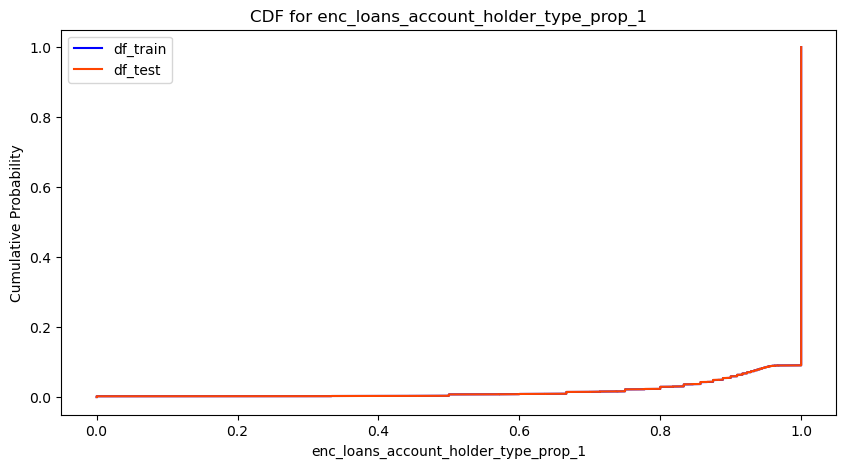

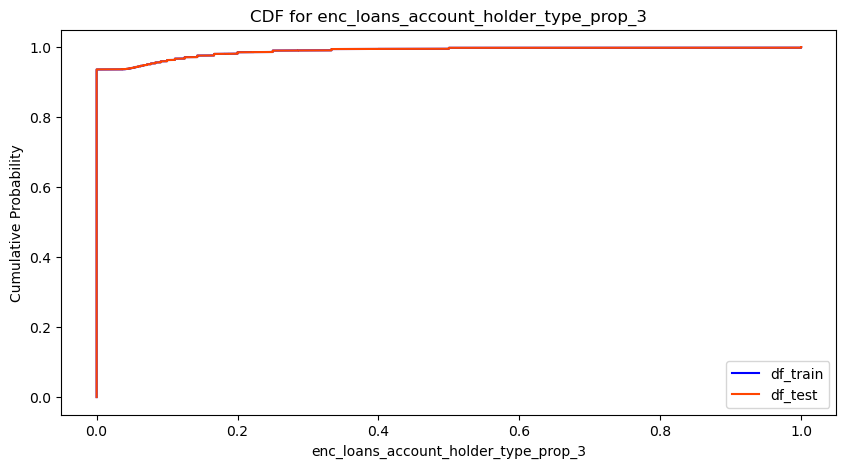

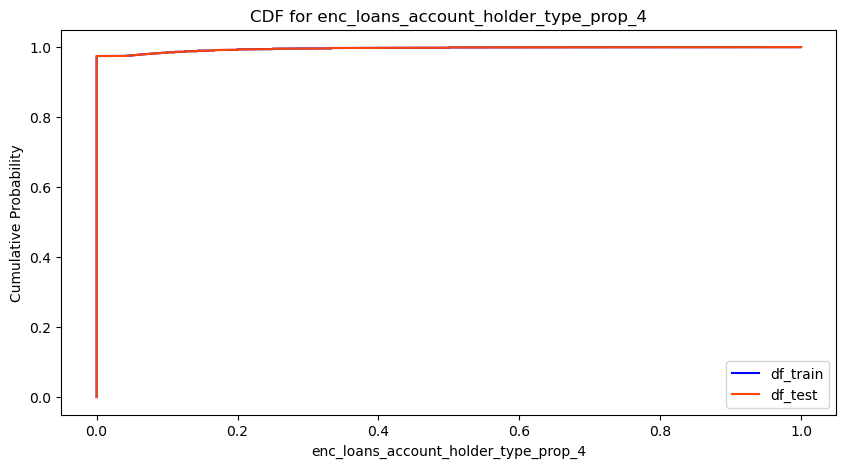

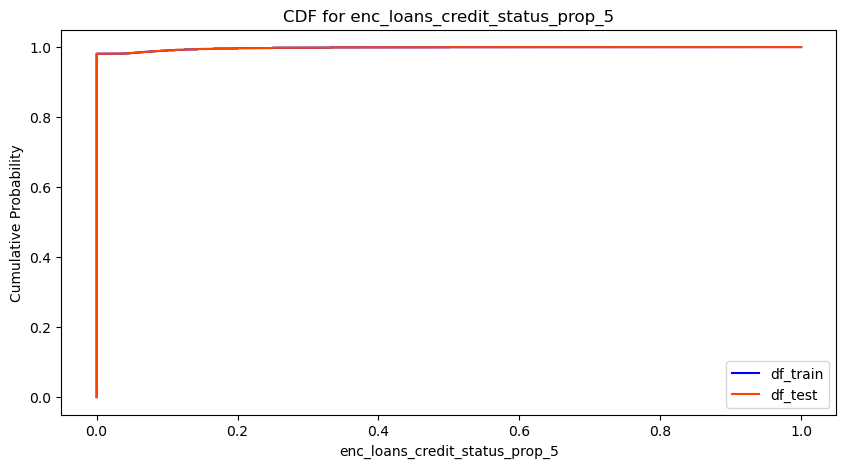

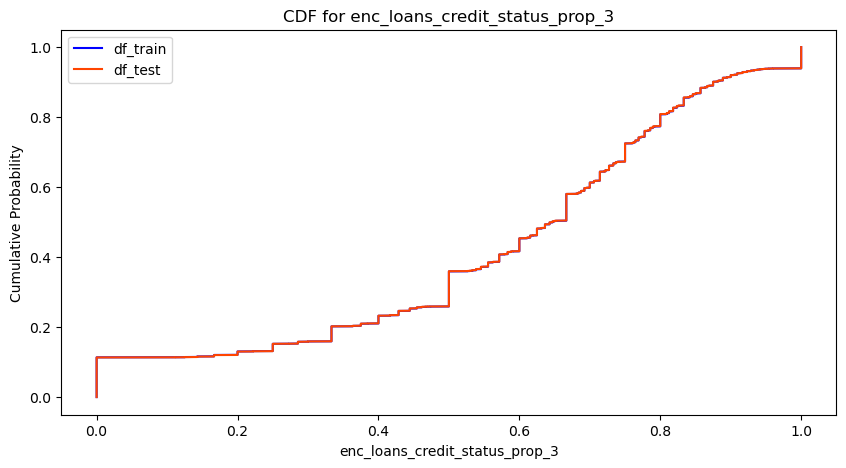

...

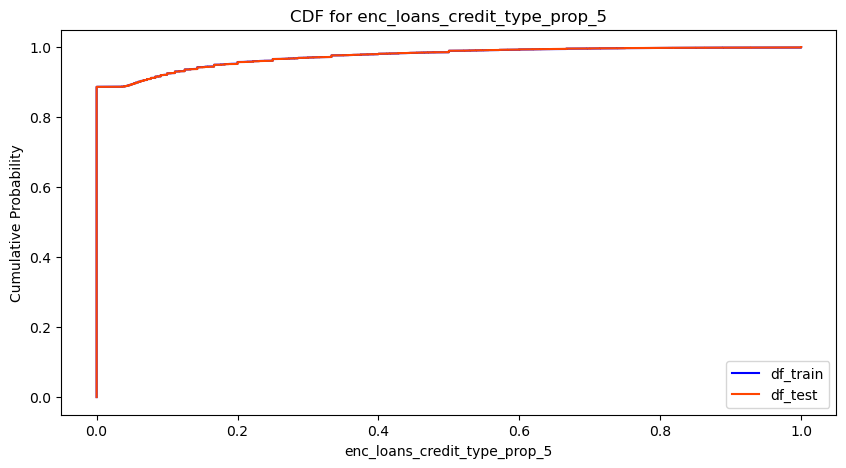

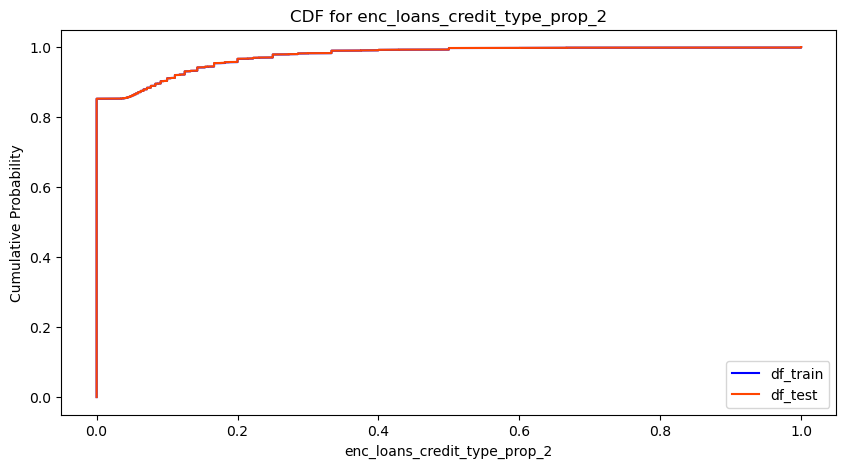

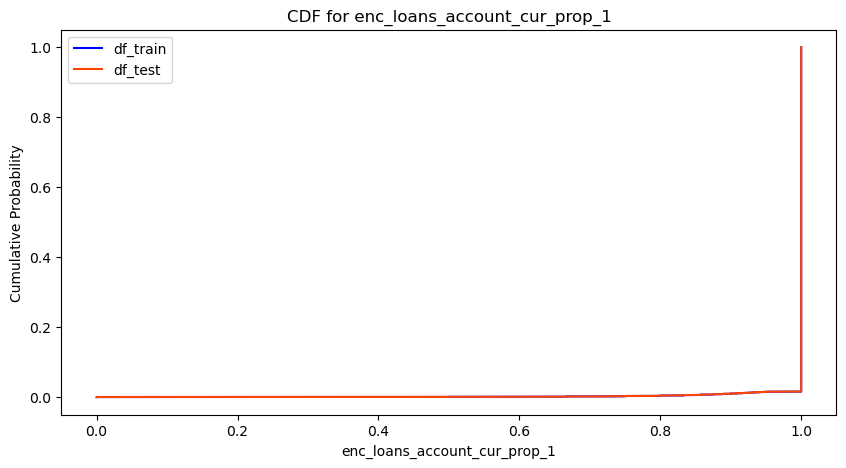

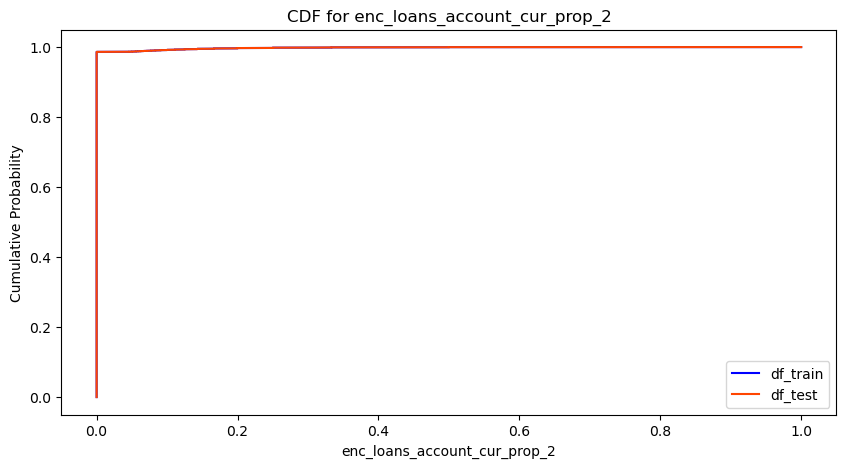

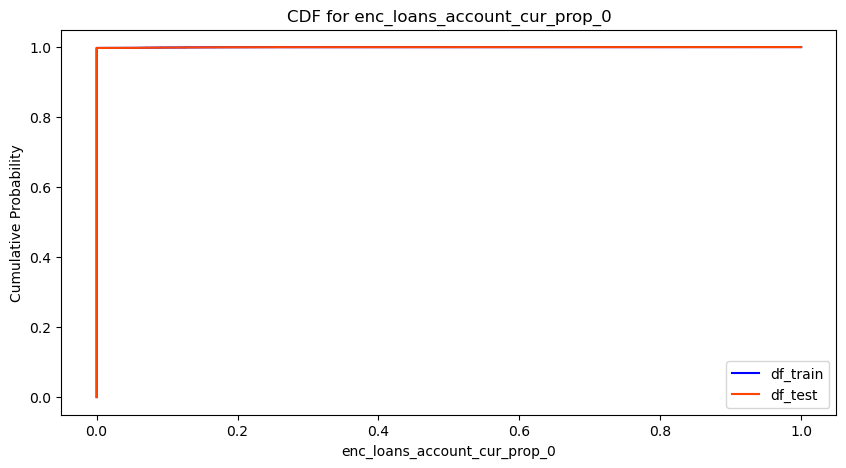

In [100]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-12:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

Формы распределения практически совпадают.   
В новых фичах уникальных значений больше чем в оригиналах, распределения некоторых сильно перекошено.

In [101]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(
    df_train, df_test, "enc_p_pre_f_p_rn"
)

Фолд 0
ROC AUC на трейне: 0.7569
ROC AUC на валидации: 0.7363
ROC AUC на тесте: 0.7343
Фолд 1
ROC AUC на трейне: 0.7572
ROC AUC на валидации: 0.7321
ROC AUC на тесте: 0.7352
Фолд 2
ROC AUC на трейне: 0.7609
ROC AUC на валидации: 0.7316
ROC AUC на тесте: 0.7349
Фолд 3
ROC AUC на трейне: 0.7561
ROC AUC на валидации: 0.7318
ROC AUC на тесте: 0.7340
Фолд 4
ROC AUC на трейне: 0.7566
ROC AUC на валидации: 0.7318
ROC AUC на тесте: 0.7342
Среднее ROC AUC на трейне: 0.7575 ± 0.0017
Среднее ROC AUC на валидации: 0.7327 ± 0.0018
Среднее ROC AUC на тесте: 0.7345 ± 0.0005


In [102]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453


In [103]:
# Посмотрим на важности признаков
importances_dict

{'pre_util_prop_3': 5.18187465935095,
 'enc_loans_credit_type_prop_0': 4.260951891518959,
 'rn_max': 3.992998596266886,
 'pre_since_opened_mean_freq': 3.690026130321452,
 'pre_loans_credit_cost_rate_prop_6': 3.6370177339089196,
 'pre_till_pclose_prop_10': 3.6244367701776152,
 'pre_util_prop_6': 3.5065539532337606,
 'pre_util_mean_freq': 3.393256892340979,
 'pre_loans_credit_limit_prop_2': 3.095627152724634,
 'pre_loans_credit_limit_mean_freq': 2.842288247497547,
 'pre_since_opened_prop_12': 2.8024991340298624,
 'pre_loans_outstanding_prop_1': 2.7676759924719803,
 'pre_loans_credit_cost_rate_prop_11': 2.420814301453086,
 'pre_loans_max_overdue_sum_prop_1': 2.4205546242278175,
 'pre_loans_max_overdue_sum_mean_freq': 2.366984848690886,
 'pre_loans_credit_cost_rate_prop_4': 2.1576015150894112,
 'pre_loans_next_pay_summ_prop_5': 1.9492804497760716,
 'enc_loans_credit_status_prop_2': 1.8885673811937855,
 'pre_maxover2limit_mean_freq': 1.8143176304197643,
 'pre_loans_outstanding_prop_5': 1.78

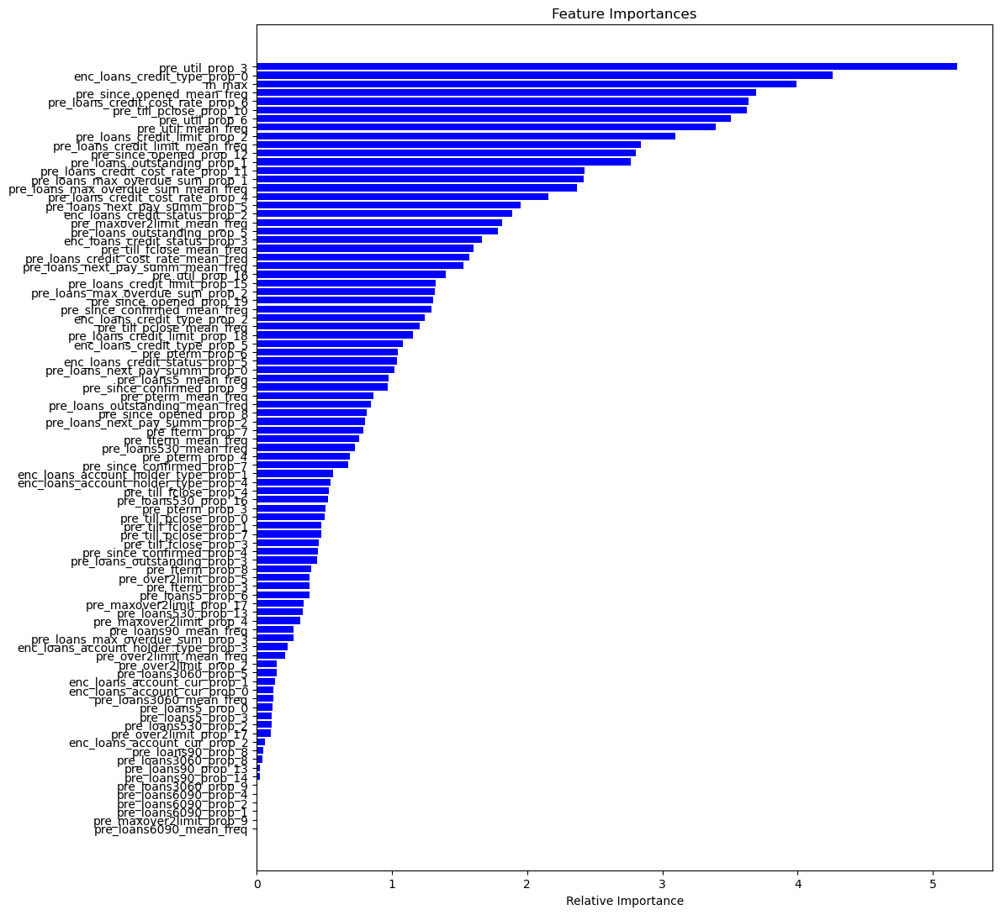

In [104]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

### Create mean value frequency enc_features

In [105]:
df_train = pd.read_csv("../data/processed/enc_p_pre_f_p_rn_train.csv")
df_test = pd.read_csv("../data/processed/enc_p_pre_f_p_rn_test.csv")
df_train.shape, df_test.shape

((2400000, 91), (600000, 91))

Циклом пройдём по списку enc_features и для каждого исходного признака    
создадим агрегированный признак отражающий суммированную относительную встречаемость    
значений исходного признака по каждому id, нормированную на количество записей у id.

In [107]:
print("New  df_train columns")
for col in enc_features:
    df_train = create_mean_values_frequency_feature(source_df_train, df_train, col)

df_train.shape

New  df_train columns
enc_loans_account_holder_type_mean_freq
enc_loans_credit_status_mean_freq
enc_loans_credit_type_mean_freq
enc_loans_account_cur_mean_freq


(2400000, 95)

In [108]:
print("New df_test columns")
for col in enc_features:
    df_test = create_mean_values_frequency_feature(source_df_test, df_test, col)

df_test.shape

New df_test columns
enc_loans_account_holder_type_mean_freq
enc_loans_credit_status_mean_freq
enc_loans_credit_type_mean_freq
enc_loans_account_cur_mean_freq


(600000, 95)

In [109]:
# Запишем промежуточные результаты в файлы
df_train.to_csv("../data/processed/enc_f_p_pre_f_p_rn_train.csv", index=False)
df_test.to_csv("../data/processed/enc_f_p_pre_f_p_rn_test.csv", index=False)
df_train.shape, df_test.shape

((2400000, 95), (600000, 95))

In [110]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-4:]

for col in columns:
    print(df_train[col].nunique(), col)

2001 enc_loans_account_holder_type_mean_freq
7229 enc_loans_credit_status_mean_freq
77204 enc_loans_credit_type_mean_freq
424 enc_loans_account_cur_mean_freq


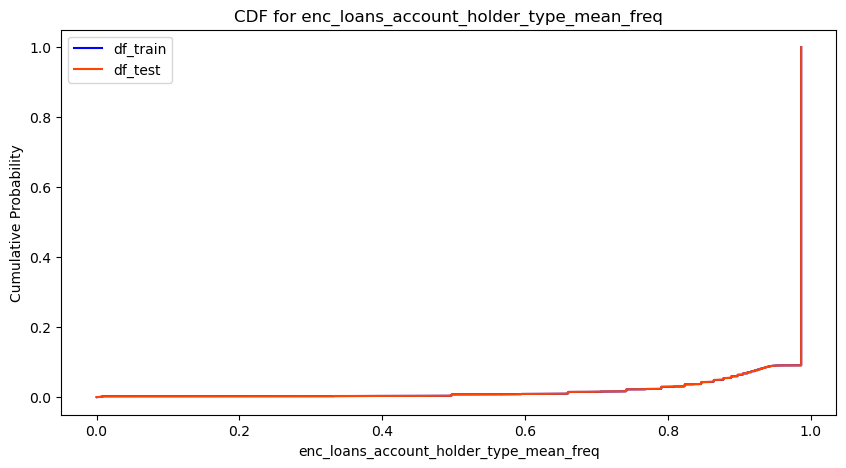

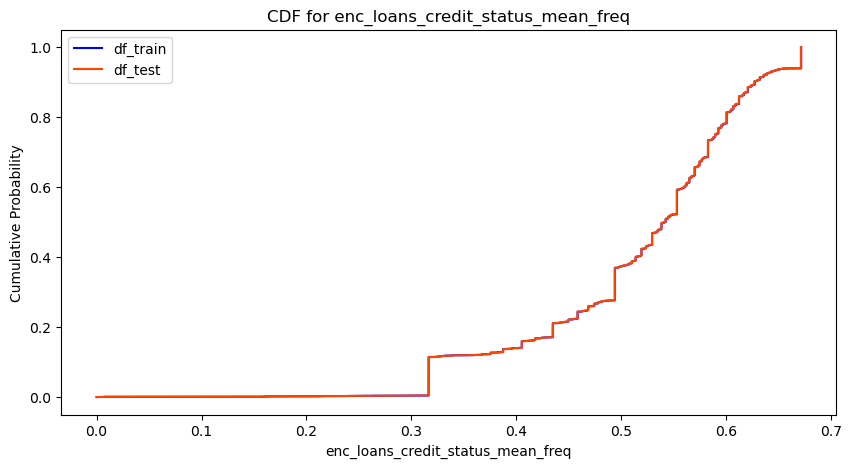

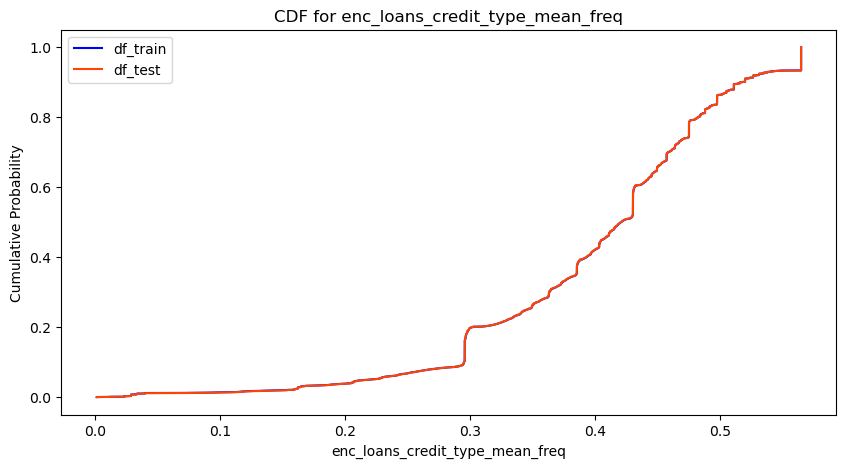

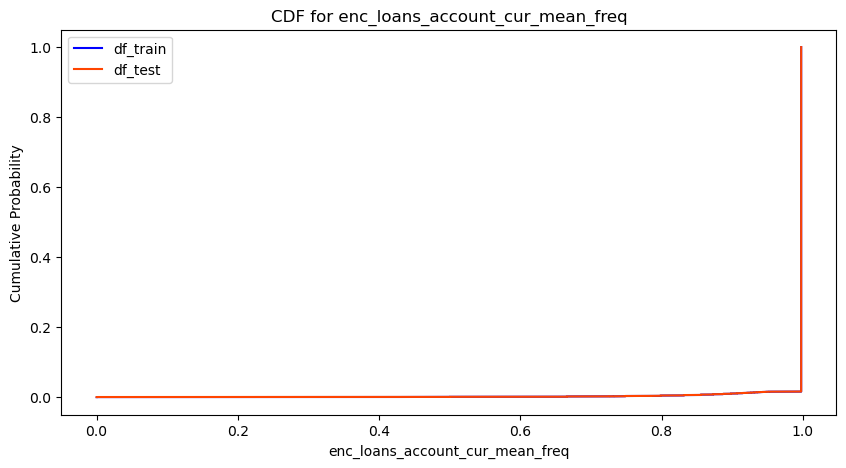

In [111]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-4:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

Распределения новых признаков в тренировочном и тестовом датасетах практически идентичны.  
Распределения некоторых признаки имеют сильный перекос. 

In [113]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(
    df_train, df_test, "enc_f_p_pre_f_p_rn"
)

Фолд 0
ROC AUC на трейне: 0.7543
ROC AUC на валидации: 0.7374
ROC AUC на тесте: 0.7353
Фолд 1
ROC AUC на трейне: 0.7591
ROC AUC на валидации: 0.7319
ROC AUC на тесте: 0.7347
Фолд 2
ROC AUC на трейне: 0.7594
ROC AUC на валидации: 0.7315
ROC AUC на тесте: 0.7348
Фолд 3
ROC AUC на трейне: 0.7595
ROC AUC на валидации: 0.7329
ROC AUC на тесте: 0.7346
Фолд 4
ROC AUC на трейне: 0.7547
ROC AUC на валидации: 0.7320
ROC AUC на тесте: 0.7352
Среднее ROC AUC на трейне: 0.7574 ± 0.0024
Среднее ROC AUC на валидации: 0.7331 ± 0.0022
Среднее ROC AUC на тесте: 0.7349 ± 0.0003


In [114]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271


In [115]:
# Посмотрим на важности признаков
importances_dict

{'enc_loans_credit_type_prop_0': 4.681758886723577,
 'pre_util_prop_3': 4.594589579479239,
 'pre_since_opened_mean_freq': 3.51482147143848,
 'pre_till_pclose_prop_10': 3.3969529974266983,
 'rn_max': 3.3868179537754446,
 'pre_util_prop_6': 3.3393950147076934,
 'pre_loans_credit_cost_rate_prop_6': 3.2565987944632124,
 'pre_util_mean_freq': 3.0952580552412585,
 'pre_loans_credit_limit_mean_freq': 2.911706066334013,
 'pre_loans_outstanding_prop_1': 2.8450556328928864,
 'pre_since_opened_prop_12': 2.832823289907808,
 'pre_loans_credit_limit_prop_2': 2.7262019140140237,
 'pre_loans_credit_cost_rate_prop_11': 2.401030035857797,
 'pre_loans_credit_cost_rate_prop_4': 2.3237351128794166,
 'pre_loans_max_overdue_sum_prop_1': 2.252839672511576,
 'pre_loans_max_overdue_sum_mean_freq': 2.0924974203770934,
 'pre_loans_next_pay_summ_prop_5': 2.04317245906391,
 'enc_loans_credit_status_mean_freq': 1.9963170835309585,
 'pre_loans_outstanding_prop_5': 1.747081373926111,
 'pre_loans_max_overdue_sum_prop_2

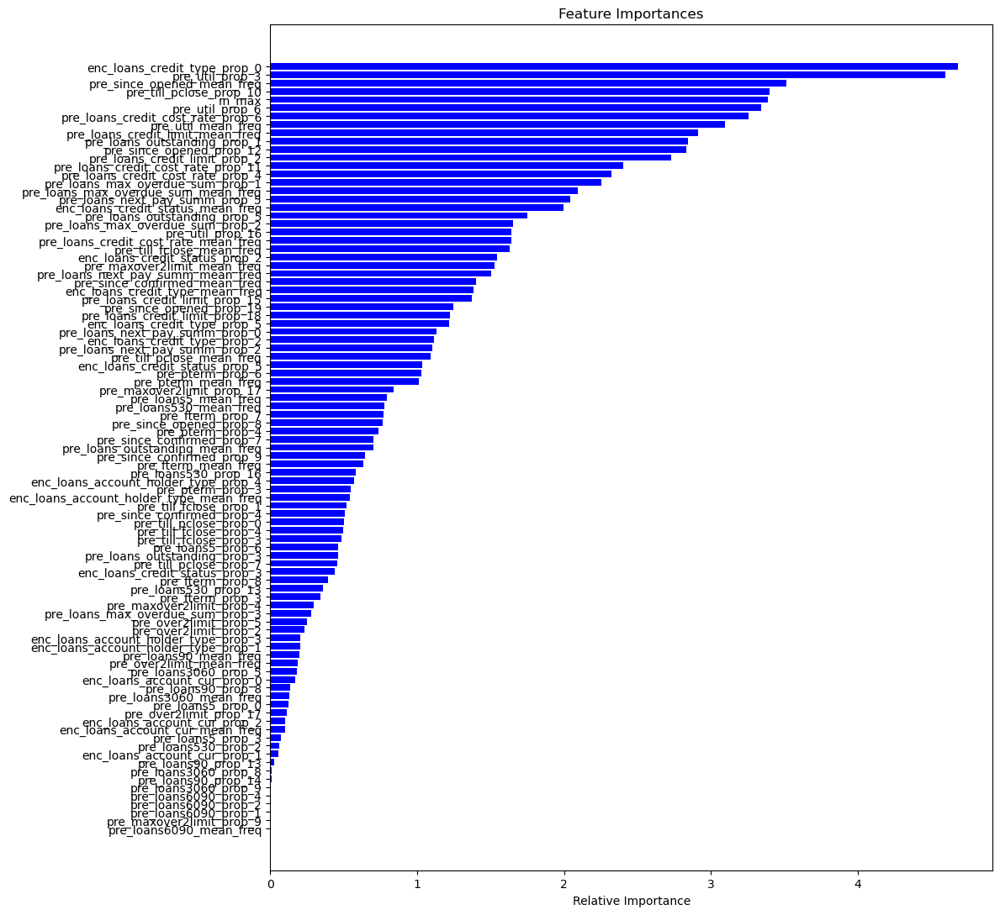

In [116]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

## Enc_paym_features

### Research enc_paym_features

In [117]:
source_df_train = pd.read_csv("../data/processed/source_data_train.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [118]:
# Списки уникальных значений признаков enc_paym_{0-24} в source_df_train
for col in enc_paym_features:
    print(sorted(source_df_train[col].unique()))

[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]


In [119]:
# Списки уникальных значений признаков enc_paym_{0-24} в source_df_test
for col in enc_paym_features:
    print(sorted(source_df_test[col].unique()))

[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[1, 2, 3, 4]


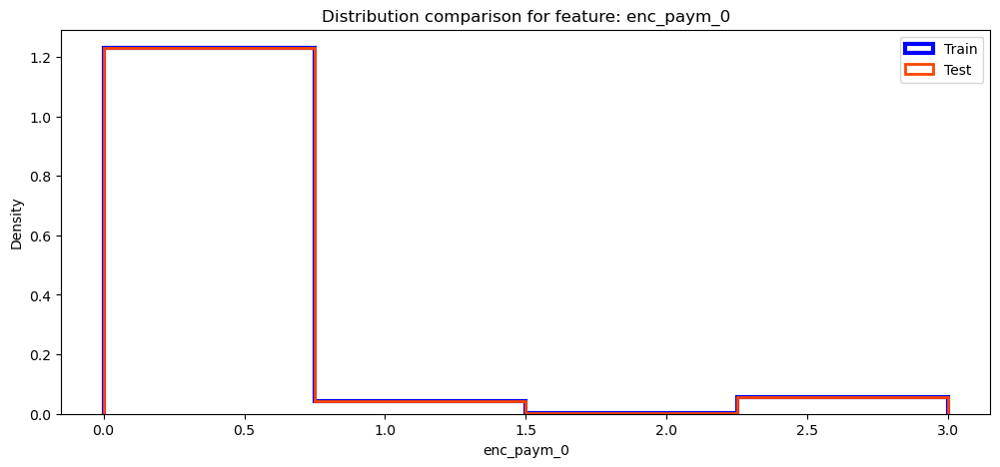

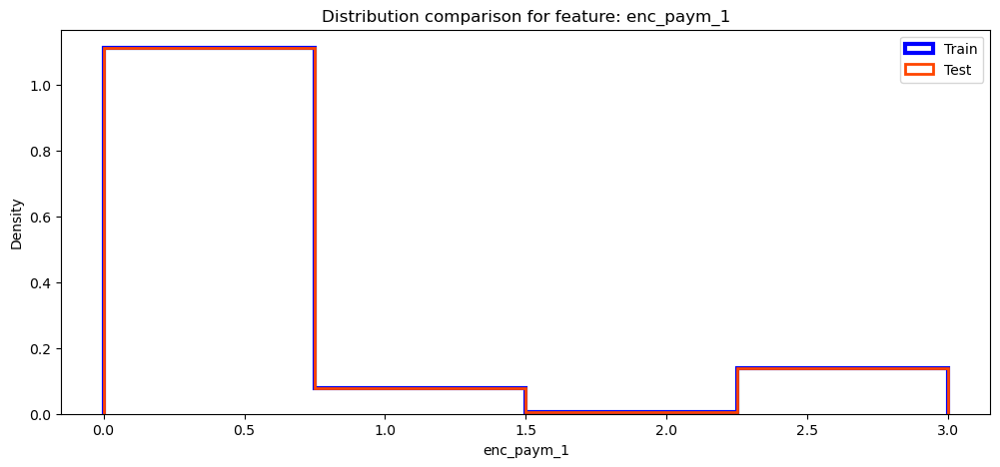

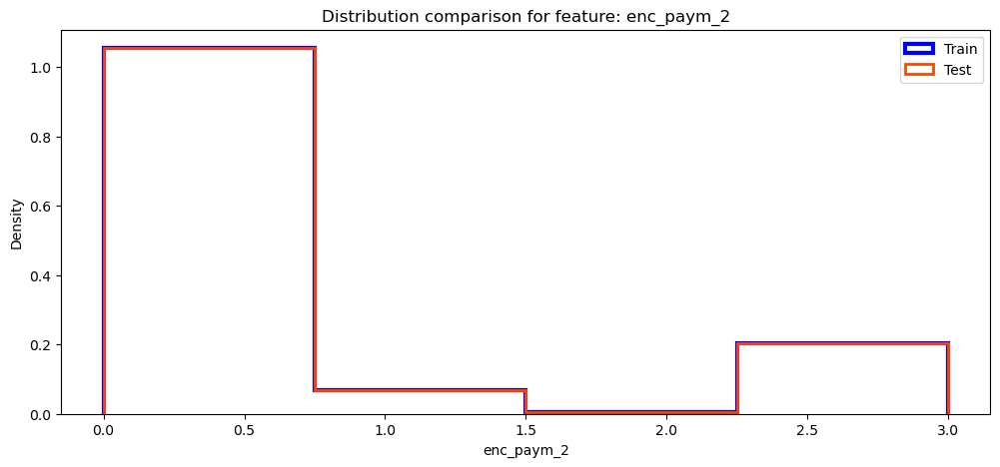

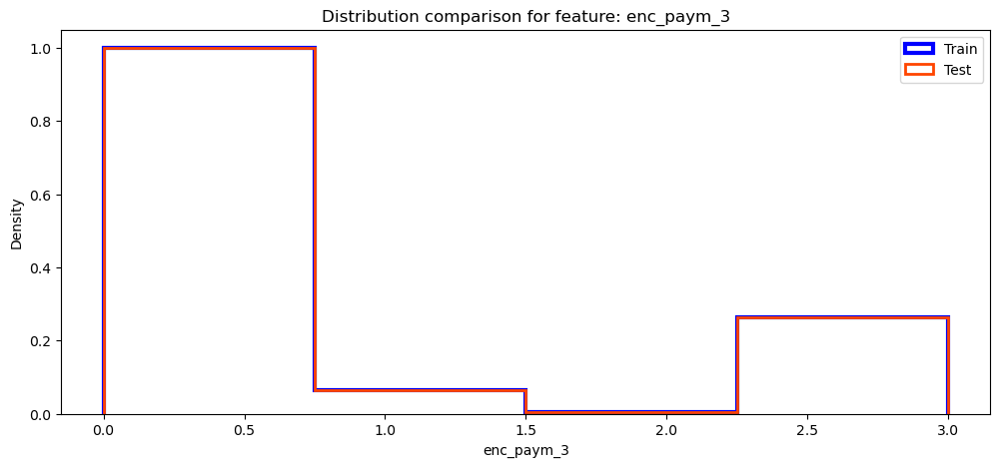

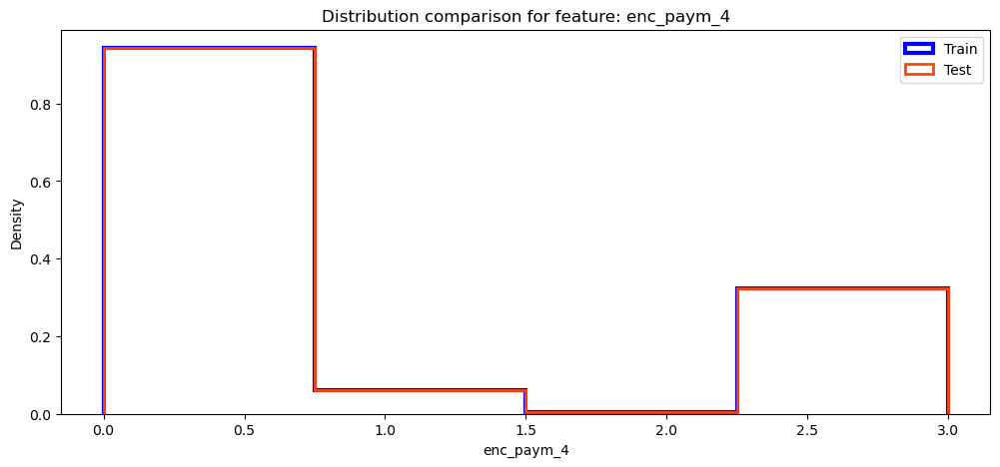

...

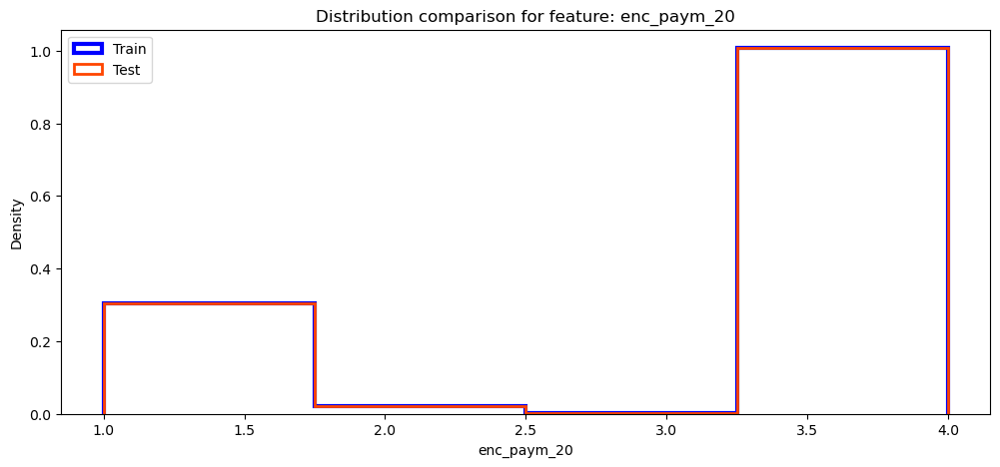

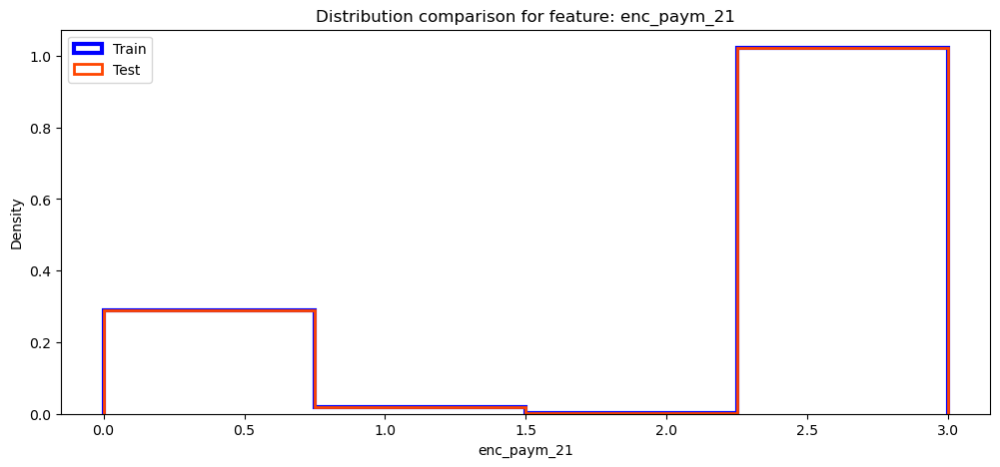

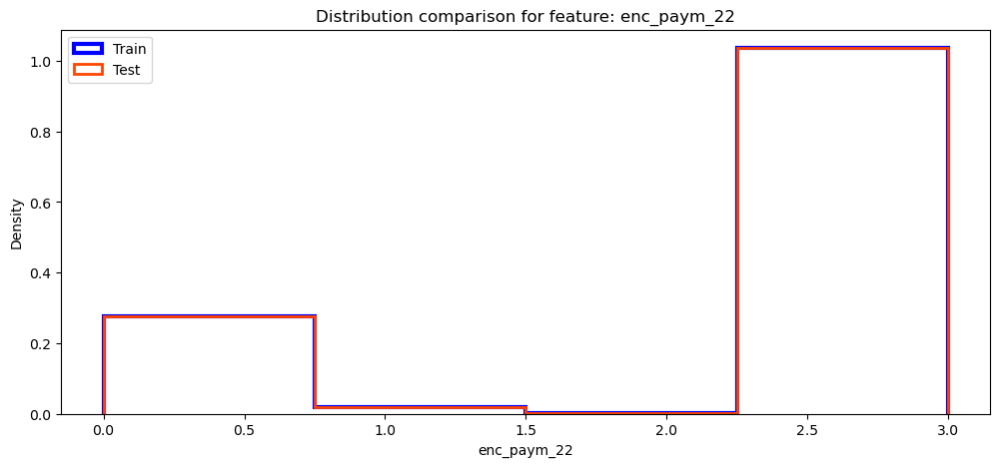

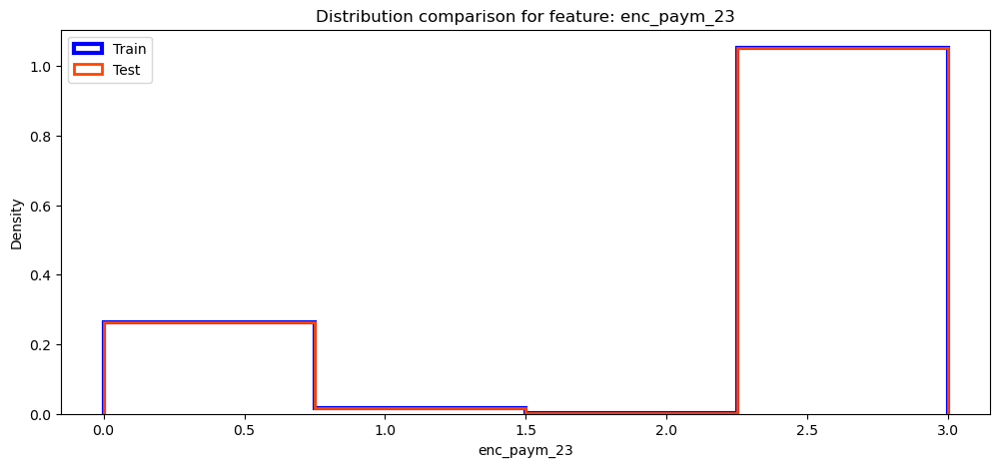

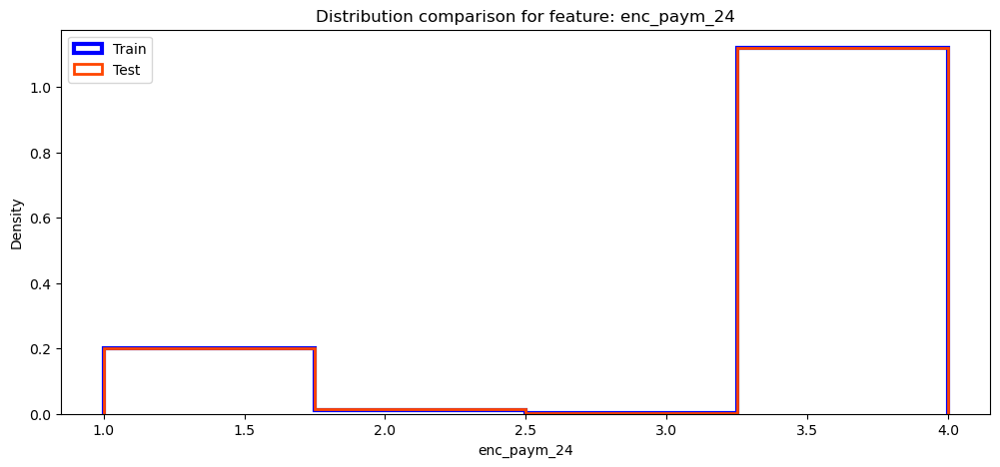

In [120]:
"""
Визуально сравним распределения признаков для исходников 
тренировочного и тестового датасетов
"""
for col in enc_paym_features:
    plt.figure(figsize=(12, 5))

    # Выбираем количество бинов как минимальное число уникальных значений в train и test
    bins = min(source_df_train[col].nunique(), source_df_test[col].nunique())

    # Строим нормализованные гистограммы для тренировочного и тестового наборов
    plt.hist(
        source_df_train[col],
        bins=bins,
        density=True,
        label="Train",
        color="blue",
        histtype="step",
        linewidth=3,
    )
    plt.hist(
        source_df_test[col],
        bins=bins,
        density=True,
        label="Test",
        color="orangered",
        histtype="step",
        linewidth=2,
    )

    plt.title(f"Distribution comparison for feature: {col}")
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.legend()
    plt.show()

Есть три признака где кодировка отличается, вместо 0-3 там 1-4.    
Форма распределений между train/test совпадает.    
Видна денамика изменения частотности значений по месяцам, сначала чаще встречаются 0 (1), позже 3 (4) и эти изменения происходят плавно. Поётому предположим что все категории закодированны одинаково, и поменяем кодировку 1-4 на 0-3 для совместной обработки.

In [121]:
# Перекодировка признаков в source_df_train
for col in enc_paym_features:
    if 4 in source_df_train[col].unique():
        source_df_train.loc[:, col] = source_df_train[col].map({1: 0, 2: 1, 3: 2, 4: 3})

for col in enc_paym_features:
    print(sorted(source_df_train[col].unique()))

[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]


In [122]:
# Перекодировка признаков в source_df_test
for col in enc_paym_features:
    if 4 in source_df_test[col].unique():
        source_df_test.loc[:, col] = source_df_test[col].map({1: 0, 2: 1, 3: 2, 4: 3})

for col in enc_paym_features:
    print(sorted(source_df_test[col].unique()))

[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]
[0, 1, 2, 3]


In [123]:
# Перезапишем исходные датасеты
source_df_train.to_csv("../data/processed/source_data_train_1.csv", index=False)
source_df_test.to_csv("../data/processed/source_data_test_1.csv", index=False)
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

### Create proportion value enc_paym_features

In [124]:
source_df_train = pd.read_csv("../data/processed/source_data_train_1.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test_1.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [125]:
df_train = pd.read_csv("../data/processed/enc_f_p_pre_f_p_rn_train.csv")
df_test = pd.read_csv("../data/processed/enc_f_p_pre_f_p_rn_test.csv")
df_train.shape, df_test.shape

((2400000, 95), (600000, 95))

In [126]:
""" 
Создадим словарь, где ключами будут имена исходных признаков из enc_paym_features,
а значениями — два уникальных значения признака, на основе которых
были созданы новые частотные признаки с наибольшим вкладом в качество модели.
"""
enc_paym_prop_features_dictionary = {}

for col in enc_paym_features:
    print("-" * 50)
    print("Исходный признак:", col)

    # Создаём новые частотные признаки для каждого уникального значения признака col
    df_train, new_features_list = create_all_value_proportion_features(
        source_df_train, df_train, col
    )
    print("Новые признаки тренировочного датасета:\n" + "\n".join(new_features_list))

    # Определяем 2 наиболее важных значения признака с помощью CatBoost
    values = choose_n_most_imp_features(df_train, new_features_list, 2)
    print("Наиболее важные категории признака:", values)

    # Сохраняем их в словарь
    enc_paym_prop_features_dictionary[col] = values

    # Удаляем все новые признаки из тренировочного датафрейма
    df_train = df_train.drop(new_features_list, axis=1)

--------------------------------------------------
Исходный признак: enc_paym_0
Новые признаки тренировочного датасета:
enc_paym_0_prop_0
enc_paym_0_prop_1
enc_paym_0_prop_2
enc_paym_0_prop_3
Среднее ROC AUC на трейне: 0.5865 ± 0.0006
Среднее ROC AUC на валидации: 0.5862 ± 0.0026
Наиболее важные категории признака: [0, 1]
--------------------------------------------------
Исходный признак: enc_paym_1
Новые признаки тренировочного датасета:
enc_paym_1_prop_0
enc_paym_1_prop_1
enc_paym_1_prop_2
enc_paym_1_prop_3
Среднее ROC AUC на трейне: 0.6188 ± 0.0011
Среднее ROC AUC на валидации: 0.6186 ± 0.0019
Наиболее важные категории признака: [0, 3]
--------------------------------------------------
Исходный признак: enc_paym_2
Новые признаки тренировочного датасета:
enc_paym_2_prop_0
enc_paym_2_prop_1
enc_paym_2_prop_2
enc_paym_2_prop_3
Среднее ROC AUC на трейне: 0.6262 ± 0.0010
Среднее ROC AUC на валидации: 0.6256 ± 0.0028
Наиболее важные категории признака: [0, 3]
----------------------------

In [127]:
enc_paym_prop_features_dictionary

{'enc_paym_0': [0, 1],
 'enc_paym_1': [0, 3],
 'enc_paym_2': [0, 3],
 'enc_paym_3': [0, 1],
 'enc_paym_4': [0, 1],
 'enc_paym_5': [0, 1],
 'enc_paym_6': [0, 1],
 'enc_paym_7': [0, 1],
 'enc_paym_8': [0, 1],
 'enc_paym_9': [0, 1],
 'enc_paym_10': [0, 1],
 'enc_paym_11': [0, 1],
 'enc_paym_12': [0, 1],
 'enc_paym_13': [0, 1],
 'enc_paym_14': [0, 1],
 'enc_paym_15': [0, 1],
 'enc_paym_16': [0, 1],
 'enc_paym_17': [0, 1],
 'enc_paym_18': [0, 1],
 'enc_paym_19': [0, 1],
 'enc_paym_20': [0, 1],
 'enc_paym_21': [0, 1],
 'enc_paym_22': [0, 1],
 'enc_paym_23': [0, 1],
 'enc_paym_24': [0, 1]}

In [128]:
# Создадим признаки из выбранных значений в тренировочном датасете
df_train = create_definite_value_proportion_features(
    source_df_train, df_train, enc_paym_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: enc_paym_0
Новые фичи:
enc_paym_0_prop_0
enc_paym_0_prop_1
--------------------------------------------------
Исходный признак: enc_paym_1
Новые фичи:
enc_paym_1_prop_0
enc_paym_1_prop_3
--------------------------------------------------
Исходный признак: enc_paym_2
Новые фичи:
enc_paym_2_prop_0
enc_paym_2_prop_3
--------------------------------------------------
Исходный признак: enc_paym_3
Новые фичи:
enc_paym_3_prop_0
enc_paym_3_prop_1
--------------------------------------------------
Исходный признак: enc_paym_4
Новые фичи:
enc_paym_4_prop_0
enc_paym_4_prop_1
--------------------------------------------------
Исходный признак: enc_paym_5
Новые фичи:
enc_paym_5_prop_0
enc_paym_5_prop_1
--------------------------------------------------
Исходный признак: enc_paym_6
Новые фичи:
enc_paym_6_prop_0
enc_paym_6_prop_1
--------------------------------------------------
Исходный признак: enc_paym_7
Новые фичи:
enc_paym_7_p

In [129]:
# Создадим признаки из выбранных значений в тестовом датасете
df_test = create_definite_value_proportion_features(
    source_df_test, df_test, enc_paym_prop_features_dictionary
)

--------------------------------------------------
Исходный признак: enc_paym_0
Новые фичи:
enc_paym_0_prop_0
enc_paym_0_prop_1
--------------------------------------------------
Исходный признак: enc_paym_1
Новые фичи:
enc_paym_1_prop_0
enc_paym_1_prop_3
--------------------------------------------------
Исходный признак: enc_paym_2
Новые фичи:
enc_paym_2_prop_0
enc_paym_2_prop_3
--------------------------------------------------
Исходный признак: enc_paym_3
Новые фичи:
enc_paym_3_prop_0
enc_paym_3_prop_1
--------------------------------------------------
Исходный признак: enc_paym_4
Новые фичи:
enc_paym_4_prop_0
enc_paym_4_prop_1
--------------------------------------------------
Исходный признак: enc_paym_5
Новые фичи:
enc_paym_5_prop_0
enc_paym_5_prop_1
--------------------------------------------------
Исходный признак: enc_paym_6
Новые фичи:
enc_paym_6_prop_0
enc_paym_6_prop_1
--------------------------------------------------
Исходный признак: enc_paym_7
Новые фичи:
enc_paym_7_p

In [130]:
# Запишем промежуточные результаты в файлы
df_train.to_csv("../data/processed/encpaym_p_enc_f_p_pre_f_p_rn_train.csv", index=False)
df_test.to_csv("../data/processed/encpaym_p_enc_f_p_pre_f_p_rn_test.csv", index=False)
df_train.shape, df_test.shape

((2400000, 145), (600000, 145))

In [131]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-50:]

for col in columns:
    print(df_train[col].nunique(), col)

427 enc_paym_0_prop_0
271 enc_paym_0_prop_1
530 enc_paym_1_prop_0
528 enc_paym_1_prop_3
542 enc_paym_2_prop_0
546 enc_paym_2_prop_3
525 enc_paym_3_prop_0
261 enc_paym_3_prop_1
527 enc_paym_4_prop_0
257 enc_paym_4_prop_1
507 enc_paym_5_prop_0
244 enc_paym_5_prop_1
498 enc_paym_6_prop_0
229 enc_paym_6_prop_1
487 enc_paym_7_prop_0
228 enc_paym_7_prop_1
471 enc_paym_8_prop_0
217 enc_paym_8_prop_1
458 enc_paym_9_prop_0
210 enc_paym_9_prop_1
445 enc_paym_10_prop_0
201 enc_paym_10_prop_1
431 enc_paym_11_prop_0
194 enc_paym_11_prop_1
413 enc_paym_12_prop_0
182 enc_paym_12_prop_1
398 enc_paym_13_prop_0
180 enc_paym_13_prop_1
390 enc_paym_14_prop_0
177 enc_paym_14_prop_1
387 enc_paym_15_prop_0
169 enc_paym_15_prop_1
378 enc_paym_16_prop_0
178 enc_paym_16_prop_1
376 enc_paym_17_prop_0
171 enc_paym_17_prop_1
364 enc_paym_18_prop_0
163 enc_paym_18_prop_1
356 enc_paym_19_prop_0
167 enc_paym_19_prop_1
345 enc_paym_20_prop_0
157 enc_paym_20_prop_1
345 enc_paym_21_prop_0
157 enc_paym_21_prop_1
342 enc_

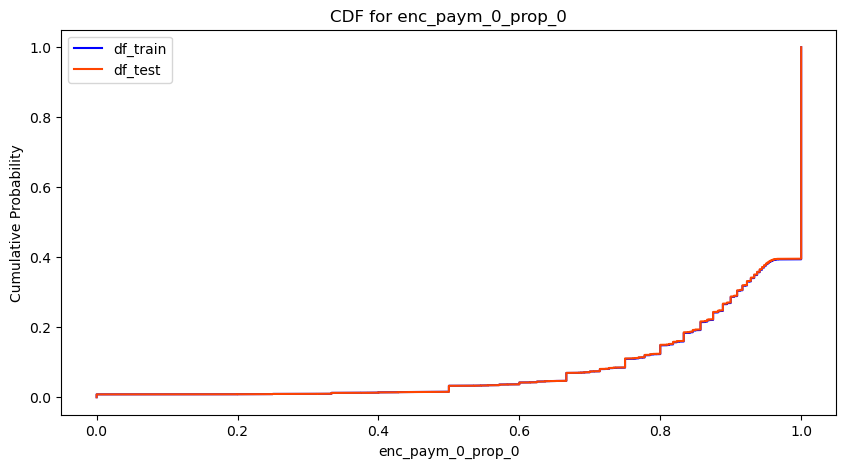

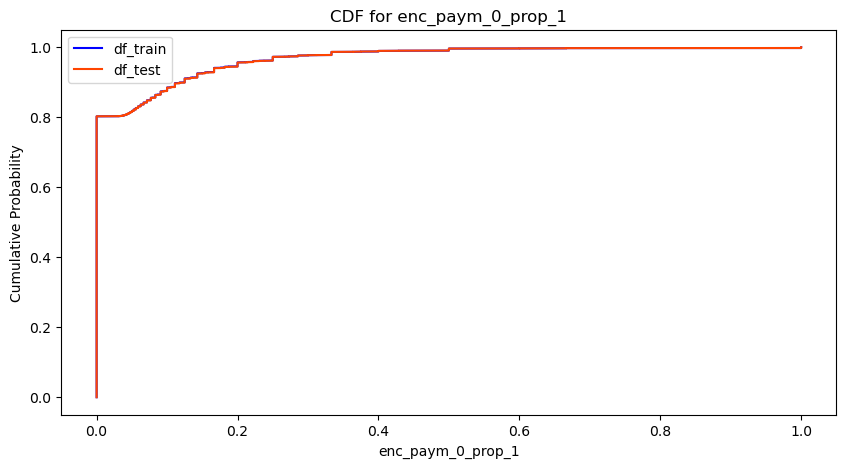

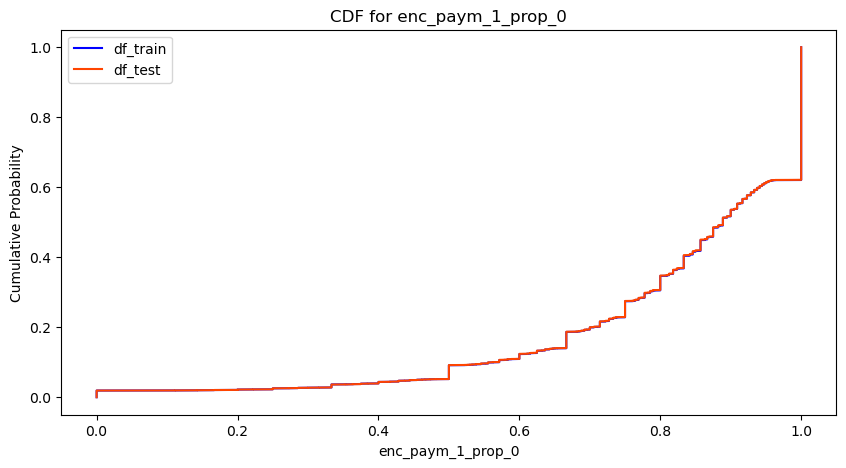

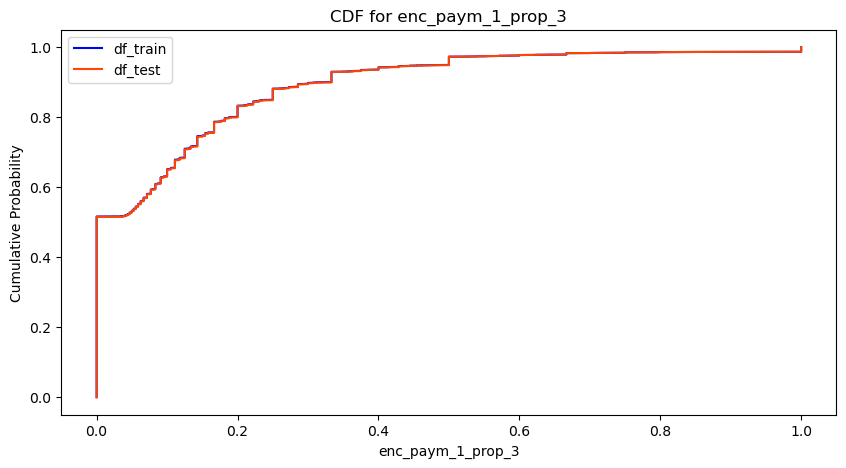

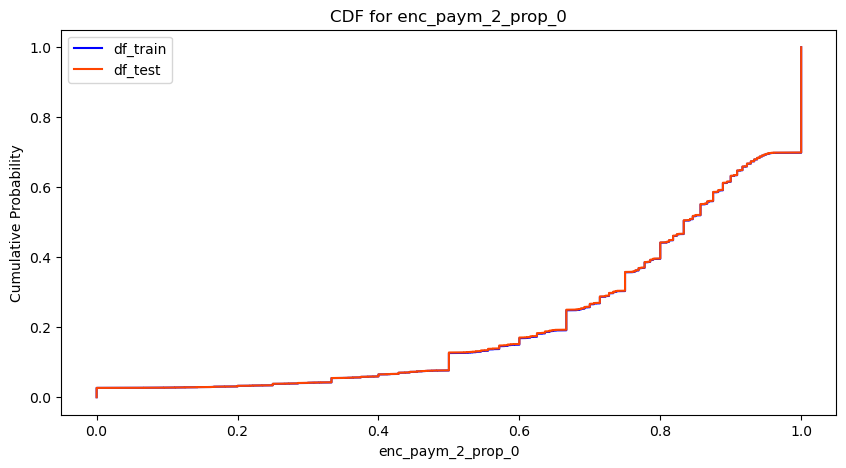

...

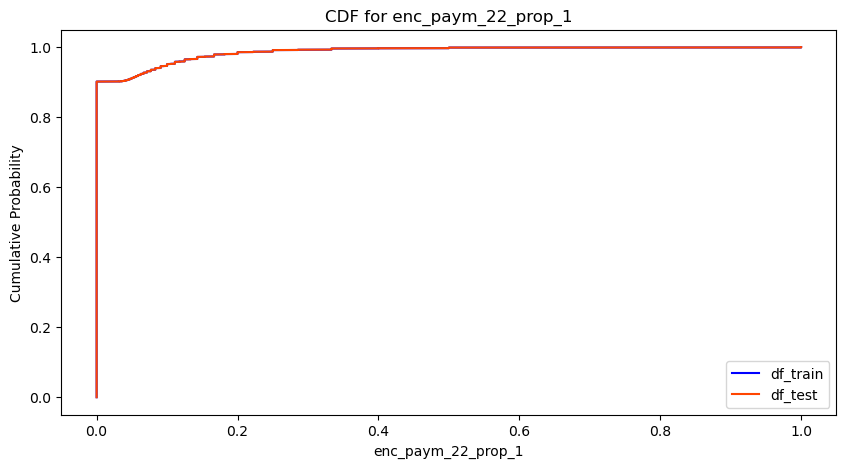

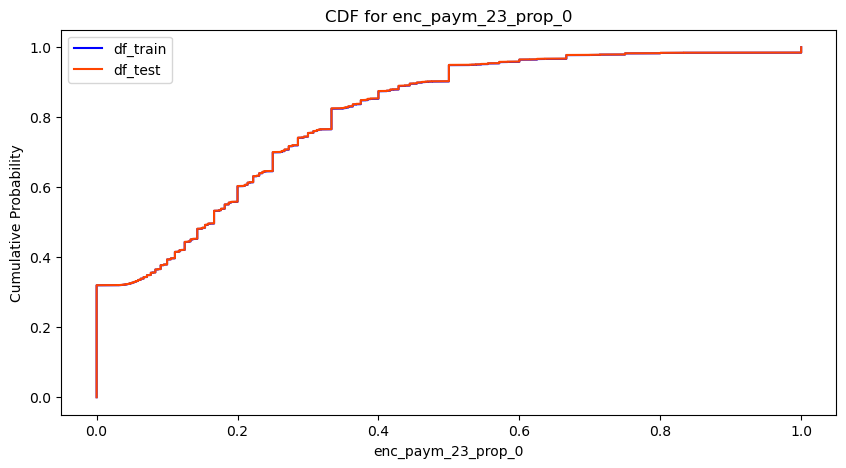

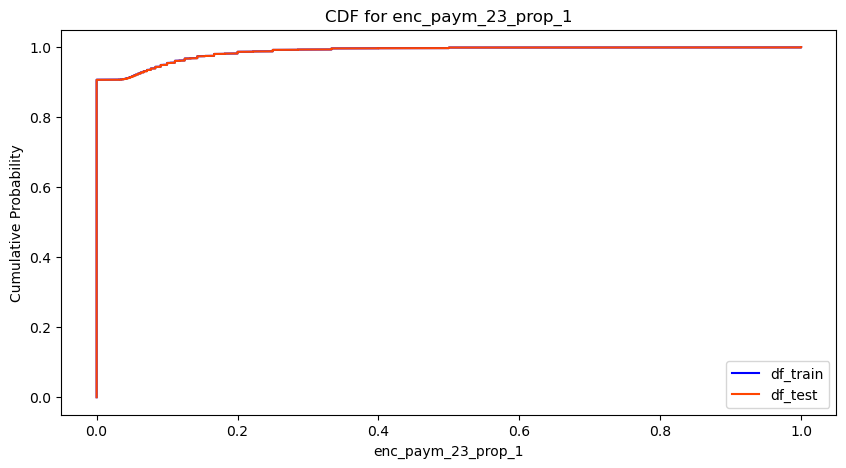

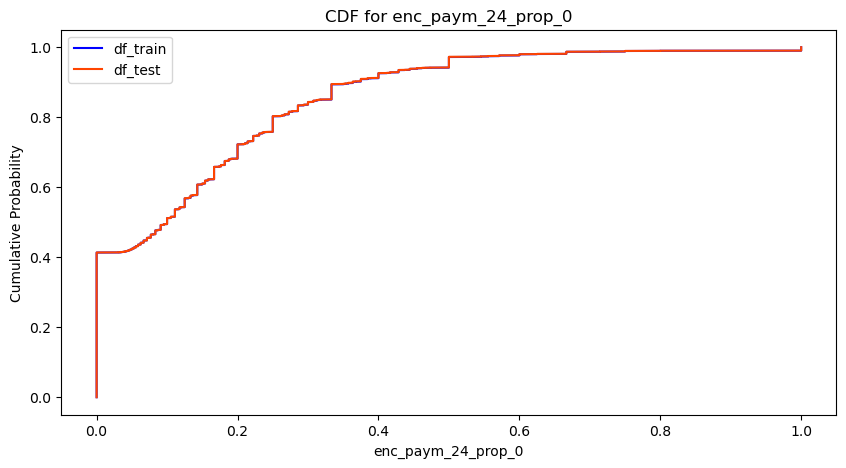

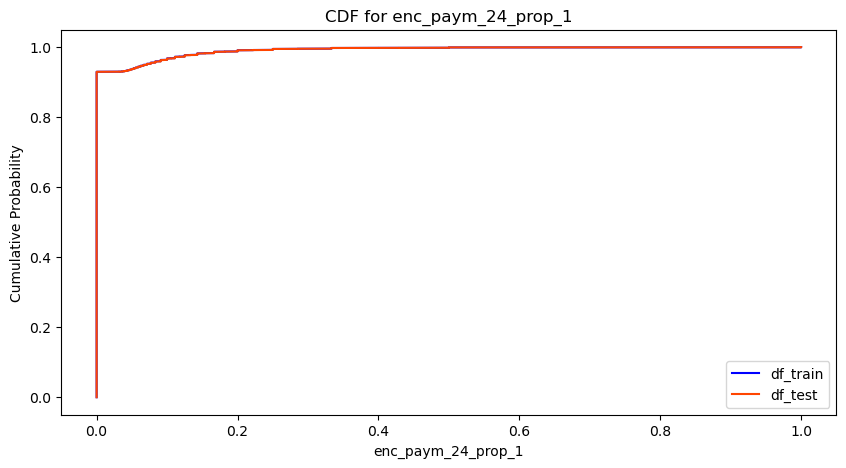

In [132]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-50:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

In [133]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(
    df_train, df_test, "encpaym_p_enc_f_p_pre_f_p_rn"
)

Фолд 0
ROC AUC на трейне: 0.7717
ROC AUC на валидации: 0.7505
ROC AUC на тесте: 0.7486
Фолд 1
ROC AUC на трейне: 0.7681
ROC AUC на валидации: 0.7475
ROC AUC на тесте: 0.7496
Фолд 2
ROC AUC на трейне: 0.7754
ROC AUC на валидации: 0.7456
ROC AUC на тесте: 0.7492
Фолд 3
ROC AUC на трейне: 0.7736
ROC AUC на валидации: 0.7483
ROC AUC на тесте: 0.7488
Фолд 4
ROC AUC на трейне: 0.7705
ROC AUC на валидации: 0.7467
ROC AUC на тесте: 0.7496
Среднее ROC AUC на трейне: 0.7719 ± 0.0025
Среднее ROC AUC на валидации: 0.7477 ± 0.0016
Среднее ROC AUC на тесте: 0.7491 ± 0.0004


In [134]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388


In [135]:
# Посмотрим на важности признаков
importances_dict

{'pre_util_prop_3': 5.055818171054414,
 'enc_loans_credit_type_prop_0': 4.062070522517625,
 'enc_paym_2_prop_0': 3.731546535238098,
 'enc_paym_1_prop_0': 3.728790841868997,
 'pre_till_pclose_prop_10': 3.3316071852249203,
 'pre_util_prop_6': 3.2146183870222877,
 'pre_util_mean_freq': 3.044750179826177,
 'pre_loans_outstanding_prop_1': 2.669844147311514,
 'pre_loans_credit_limit_prop_2': 2.3185456116805034,
 'rn_max': 2.239612665154927,
 'enc_paym_0_prop_1': 1.9164595482937847,
 'pre_loans_credit_cost_rate_prop_11': 1.9161632742875265,
 'pre_loans_credit_limit_mean_freq': 1.8354380026646404,
 'enc_paym_16_prop_0': 1.8066661491994536,
 'pre_loans_credit_cost_rate_prop_4': 1.791836236554236,
 'pre_loans_outstanding_prop_5': 1.7063571254985999,
 'pre_loans_credit_cost_rate_prop_6': 1.5589927064790188,
 'pre_loans_max_overdue_sum_mean_freq': 1.4957928552113404,
 'pre_util_prop_16': 1.35443808413495,
 'pre_loans_next_pay_summ_prop_5': 1.3058088793087395,
 'enc_paym_3_prop_0': 1.25437364367652

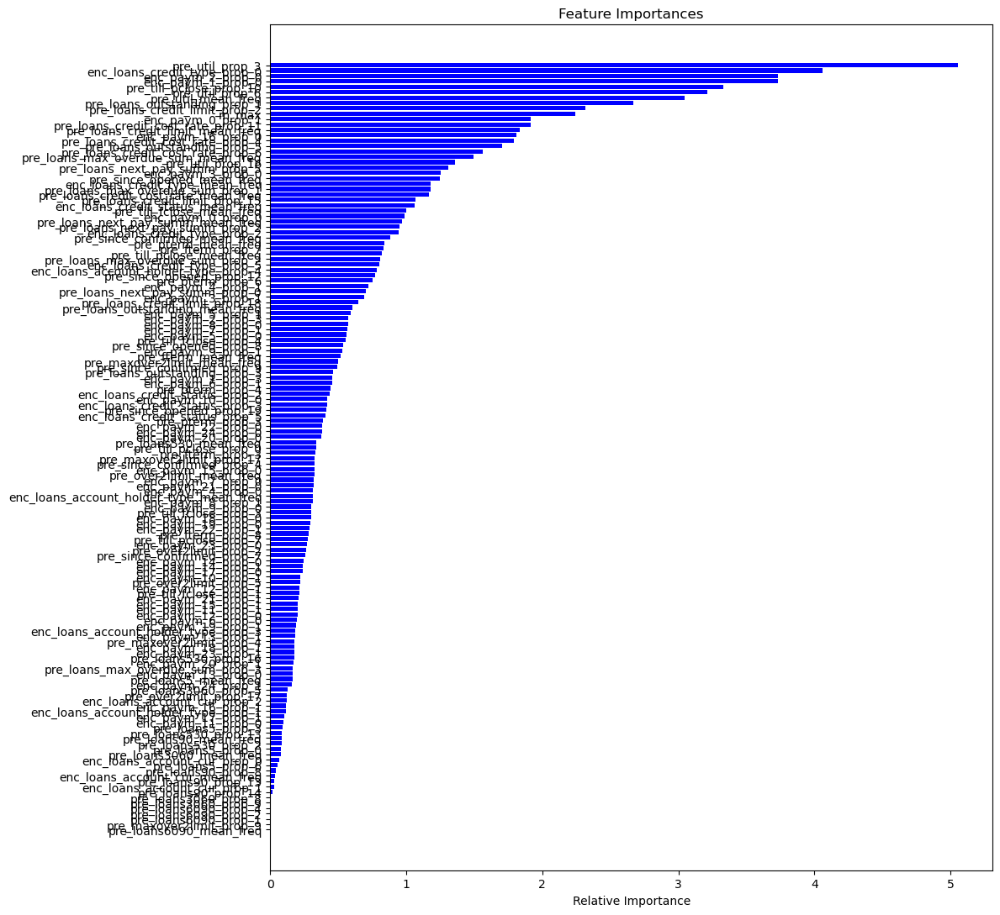

In [136]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

### Enc_paym_features mean value frequency individual months

In [137]:
source_df_train = pd.read_csv("../data/processed/source_data_train_1.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test_1.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [138]:
df_train = pd.read_csv("../data/processed/encpaym_p_enc_f_p_pre_f_p_rn_train.csv")
df_test = pd.read_csv("../data/processed/encpaym_p_enc_f_p_pre_f_p_rn_test.csv")
df_train.shape, df_test.shape

((2400000, 145), (600000, 145))

Циклом пройдём по списку Enc_paym_features и для каждого исходного признака    
создадим агрегированный признак отражающий суммированную относительную встречаемость    
значений исходного признака по каждому id, нормированную на количество записей у id.

In [139]:
print("New  df_train columns")
for col in enc_paym_features:
    df_train = create_mean_values_frequency_feature(source_df_train, df_train, col)

df_train.shape

New  df_train columns
enc_paym_0_mean_freq
enc_paym_1_mean_freq
enc_paym_2_mean_freq
enc_paym_3_mean_freq
enc_paym_4_mean_freq
enc_paym_5_mean_freq
enc_paym_6_mean_freq
enc_paym_7_mean_freq
enc_paym_8_mean_freq
enc_paym_9_mean_freq
enc_paym_10_mean_freq
enc_paym_11_mean_freq
enc_paym_12_mean_freq
enc_paym_13_mean_freq
enc_paym_14_mean_freq
enc_paym_15_mean_freq
enc_paym_16_mean_freq
enc_paym_17_mean_freq
enc_paym_18_mean_freq
enc_paym_19_mean_freq
enc_paym_20_mean_freq
enc_paym_21_mean_freq
enc_paym_22_mean_freq
enc_paym_23_mean_freq
enc_paym_24_mean_freq


(2400000, 170)

In [140]:
print("New df_test columns")
for col in enc_paym_features:
    df_test = create_mean_values_frequency_feature(source_df_test, df_test, col)

df_test.shape

New df_test columns
enc_paym_0_mean_freq
enc_paym_1_mean_freq
enc_paym_2_mean_freq
enc_paym_3_mean_freq
enc_paym_4_mean_freq
enc_paym_5_mean_freq
enc_paym_6_mean_freq
enc_paym_7_mean_freq
enc_paym_8_mean_freq
enc_paym_9_mean_freq
enc_paym_10_mean_freq
enc_paym_11_mean_freq
enc_paym_12_mean_freq
enc_paym_13_mean_freq
enc_paym_14_mean_freq
enc_paym_15_mean_freq
enc_paym_16_mean_freq
enc_paym_17_mean_freq
enc_paym_18_mean_freq
enc_paym_19_mean_freq
enc_paym_20_mean_freq
enc_paym_21_mean_freq
enc_paym_22_mean_freq
enc_paym_23_mean_freq
enc_paym_24_mean_freq


(600000, 170)

In [141]:
# Запишем промежуточные результаты в файлы
df_train.to_csv(
    "../data/processed/encpaym_f_p_enc_f_p_pre_f_p_rn_train.csv", index=False
)
df_test.to_csv("../data/processed/encpaym_f_p_enc_f_p_pre_f_p_rn_test.csv", index=False)
df_train.shape, df_test.shape

((2400000, 170), (600000, 170))

In [142]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-25:]

for col in columns:
    print(df_train[col].nunique(), col)

4860 enc_paym_0_mean_freq
8218 enc_paym_1_mean_freq
8066 enc_paym_2_mean_freq
8039 enc_paym_3_mean_freq
7727 enc_paym_4_mean_freq
7435 enc_paym_5_mean_freq
7442 enc_paym_6_mean_freq
6615 enc_paym_7_mean_freq
6815 enc_paym_8_mean_freq
5977 enc_paym_9_mean_freq
6055 enc_paym_10_mean_freq
5595 enc_paym_11_mean_freq
4989 enc_paym_12_mean_freq
4649 enc_paym_13_mean_freq
4346 enc_paym_14_mean_freq
4366 enc_paym_15_mean_freq
4105 enc_paym_16_mean_freq
3873 enc_paym_17_mean_freq
3881 enc_paym_18_mean_freq
3737 enc_paym_19_mean_freq
3670 enc_paym_20_mean_freq
3645 enc_paym_21_mean_freq
3455 enc_paym_22_mean_freq
3143 enc_paym_23_mean_freq
2812 enc_paym_24_mean_freq


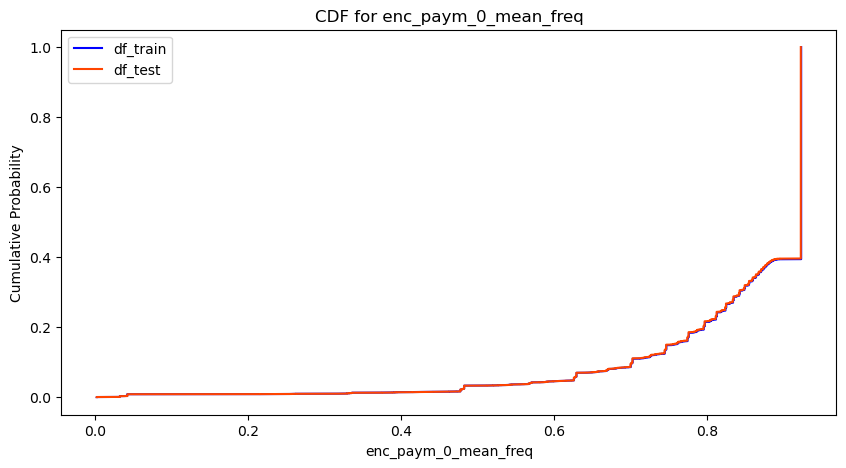

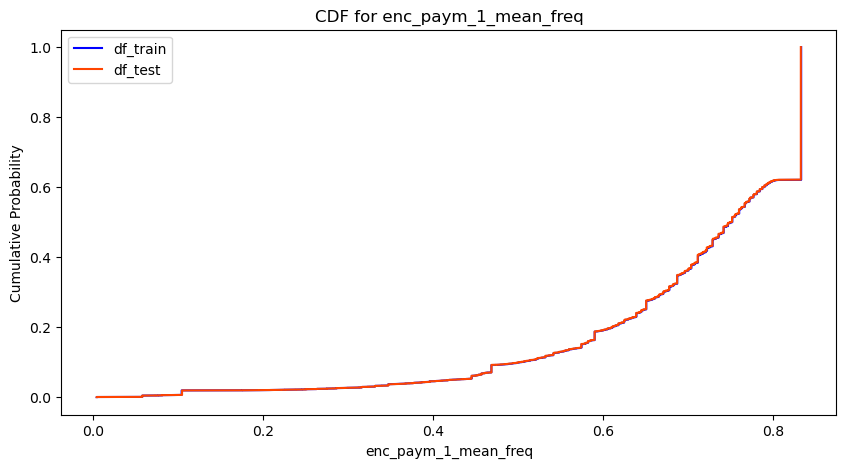

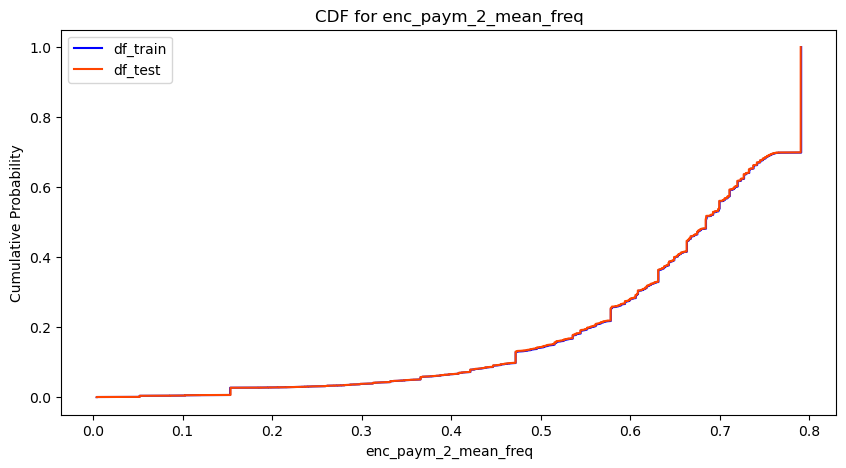

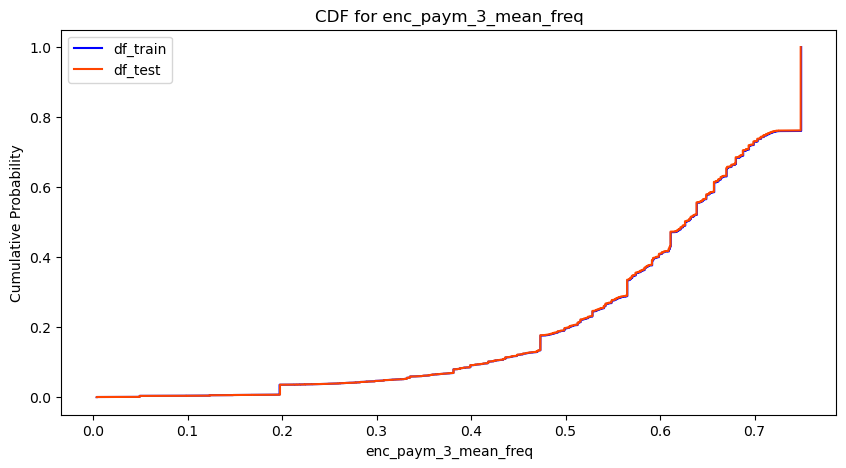

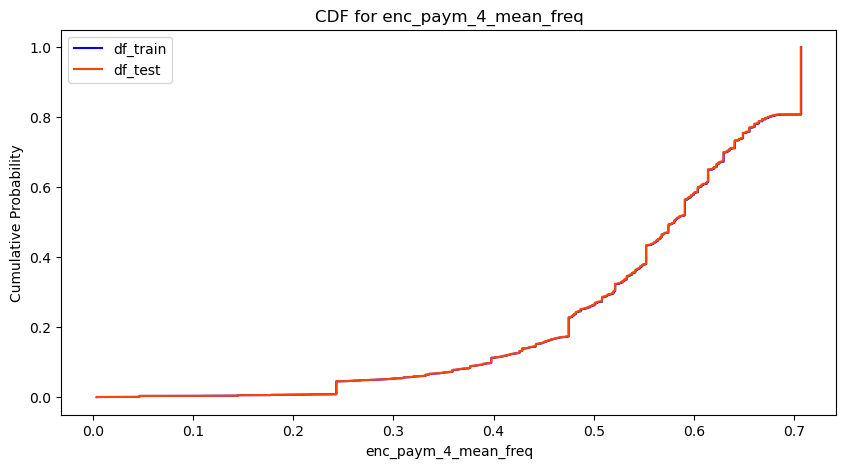

...

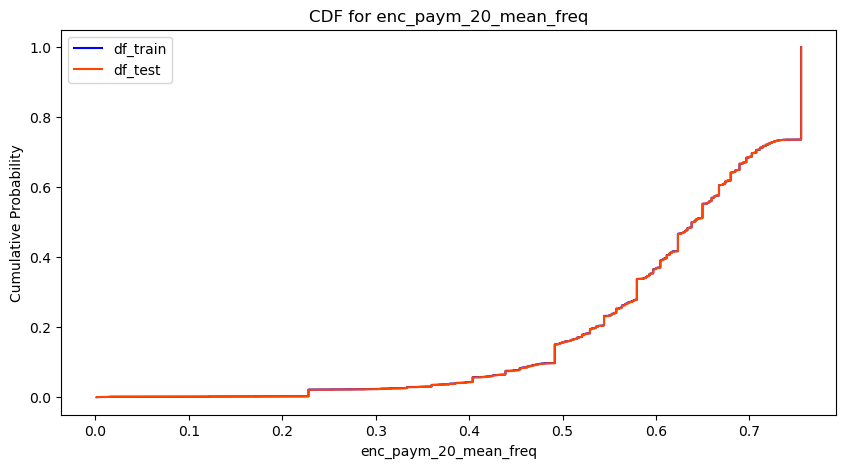

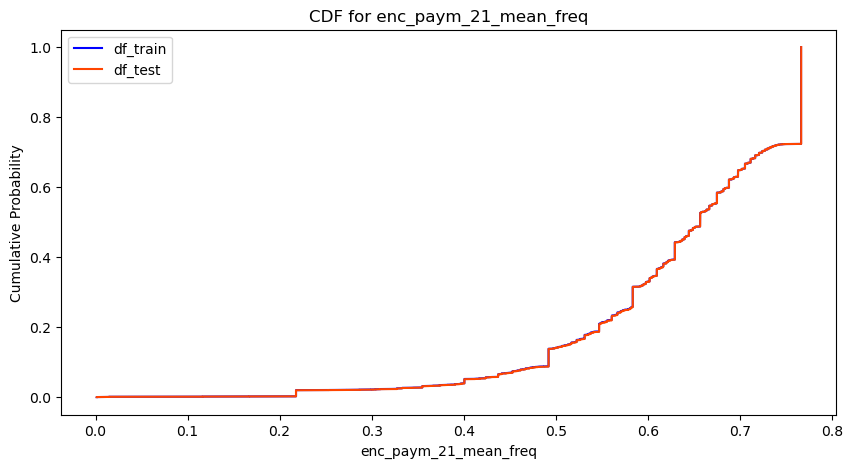

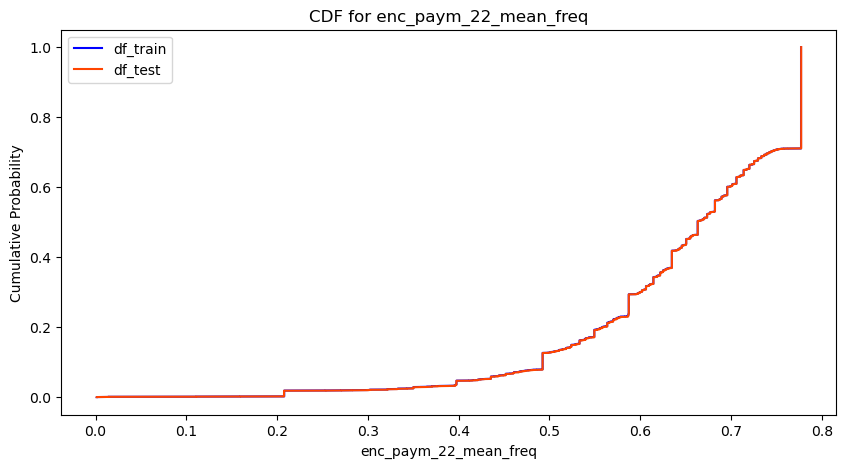

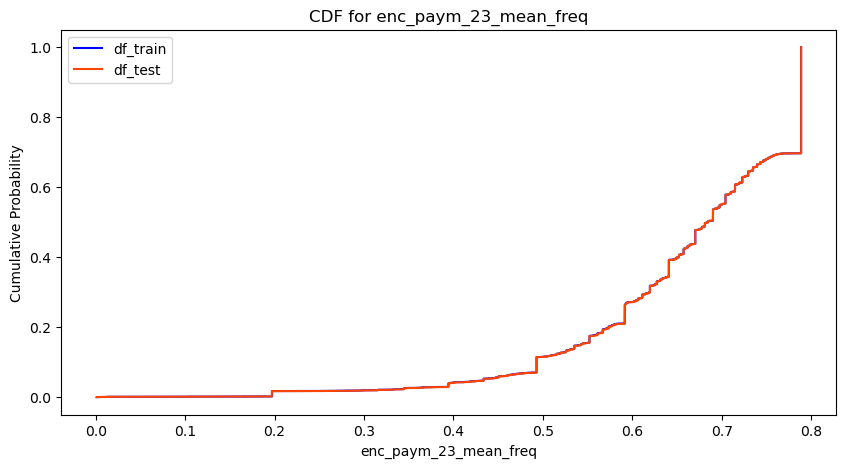

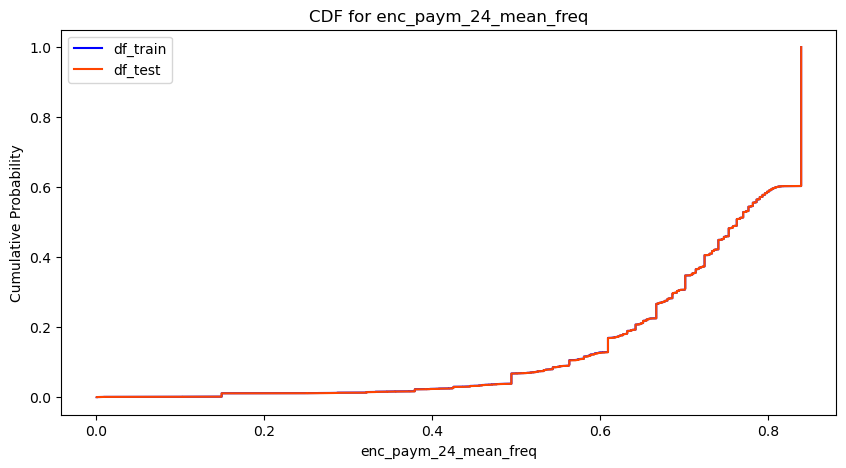

In [143]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-25:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

Распределения новых признаков в тренировочном и тестовом датасетах практически идентичны. 

In [144]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(
    df_train, df_test, "encpaym_f_p_enc_f_p_pre_f_p_rn"
)

Фолд 0
ROC AUC на трейне: 0.7723
ROC AUC на валидации: 0.7507
ROC AUC на тесте: 0.7498
Фолд 1
ROC AUC на трейне: 0.7690
ROC AUC на валидации: 0.7475
ROC AUC на тесте: 0.7491
Фолд 2
ROC AUC на трейне: 0.7734
ROC AUC на валидации: 0.7465
ROC AUC на тесте: 0.7493
Фолд 3
ROC AUC на трейне: 0.7670
ROC AUC на валидации: 0.7469
ROC AUC на тесте: 0.7496
Фолд 4
ROC AUC на трейне: 0.7666
ROC AUC на валидации: 0.7475
ROC AUC на тесте: 0.7485
Среднее ROC AUC на трейне: 0.7697 ± 0.0028
Среднее ROC AUC на валидации: 0.7478 ± 0.0015
Среднее ROC AUC на тесте: 0.7493 ± 0.0005


In [145]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456


In [146]:
# Посмотрим на важности признаков
importances_dict

{'pre_util_prop_3': 4.962151692236566,
 'enc_loans_credit_type_prop_0': 4.244601086702979,
 'pre_till_pclose_prop_10': 3.631202739064108,
 'pre_util_prop_6': 3.212562910074732,
 'pre_util_mean_freq': 3.0087179987284496,
 'pre_loans_outstanding_prop_1': 2.815193173230612,
 'enc_paym_1_mean_freq': 2.5188102821321974,
 'pre_loans_credit_limit_prop_2': 2.439066205458635,
 'rn_max': 2.3170829584831187,
 'enc_paym_2_mean_freq': 2.21248173219687,
 'pre_loans_credit_cost_rate_prop_11': 2.039790740234769,
 'pre_loans_outstanding_prop_5': 1.8539856160085537,
 'pre_loans_credit_cost_rate_prop_4': 1.8029172976039327,
 'pre_loans_credit_limit_mean_freq': 1.6744111664110655,
 'pre_loans_credit_cost_rate_prop_6': 1.6259930702702008,
 'enc_paym_0_prop_1': 1.588239370837217,
 'enc_paym_3_mean_freq': 1.5553618022503162,
 'enc_paym_7_mean_freq': 1.341978791297344,
 'pre_loans_next_pay_summ_prop_5': 1.2755232827509788,
 'pre_since_opened_mean_freq': 1.177678647662878,
 'enc_loans_credit_status_mean_freq':

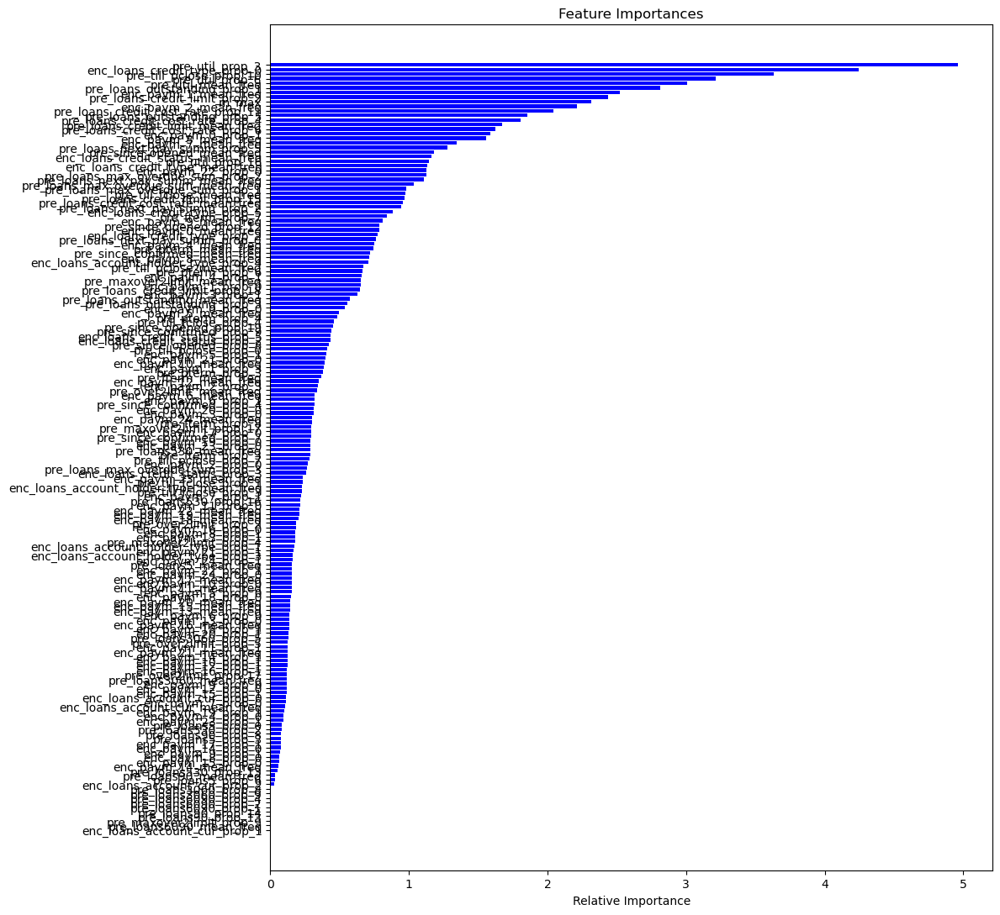

In [147]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

### Enc_paym_features sum mean value frequency periods

In [148]:
source_df_train = pd.read_csv("../data/processed/source_data_train_1.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test_1.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [149]:
df_train = pd.read_csv("../data/processed/encpaym_f_p_enc_f_p_pre_f_p_rn_train.csv")
df_test = pd.read_csv("../data/processed/encpaym_f_p_enc_f_p_pre_f_p_rn_test.csv")
df_train.shape, df_test.shape

((2400000, 170), (600000, 170))

#### All years

In [150]:
# Выведу признаки среднего количества статусов 0-3 на один кредит за все два года в df_train
print("New df_train columns")
df_train = from_enc_paym_create_normalized_group_sum_features(
    source_df_train, df_train, enc_paym_features, "all"
)

print("df_train.shape", df_train.shape)

New df_train columns
enc_paym_avg_0_all
enc_paym_avg_1_all
enc_paym_avg_2_all
enc_paym_avg_3_all
df_train.shape (2400000, 174)


In [151]:
# Выведем признаки среднего количества статусов 0-3 на один кредит за все два года в df_test
print("New df_test columns")
df_test = from_enc_paym_create_normalized_group_sum_features(
    source_df_test, df_test, enc_paym_features, "all"
)

print("df_test.shape", df_test.shape)

New df_test columns
enc_paym_avg_0_all
enc_paym_avg_1_all
enc_paym_avg_2_all
enc_paym_avg_3_all
df_test.shape (600000, 174)


In [152]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-4:]

for col in columns:
    print(df_train[col].nunique(), col)

7098 enc_paym_avg_0_all
2503 enc_paym_avg_1_all
656 enc_paym_avg_2_all
7389 enc_paym_avg_3_all


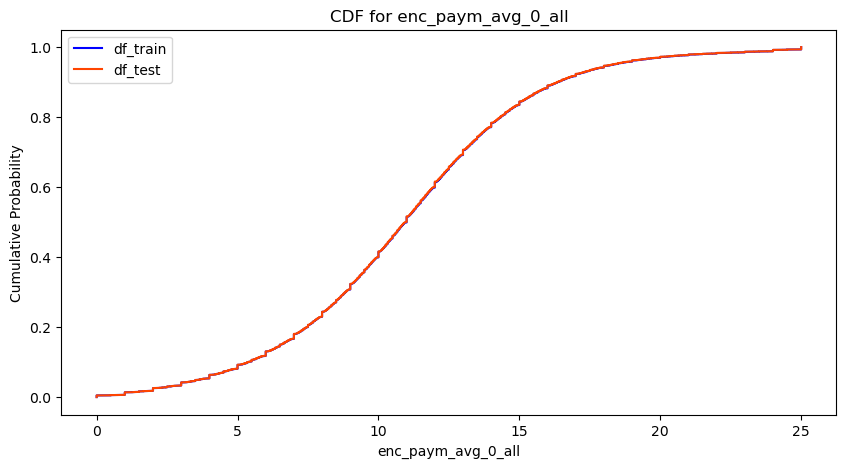

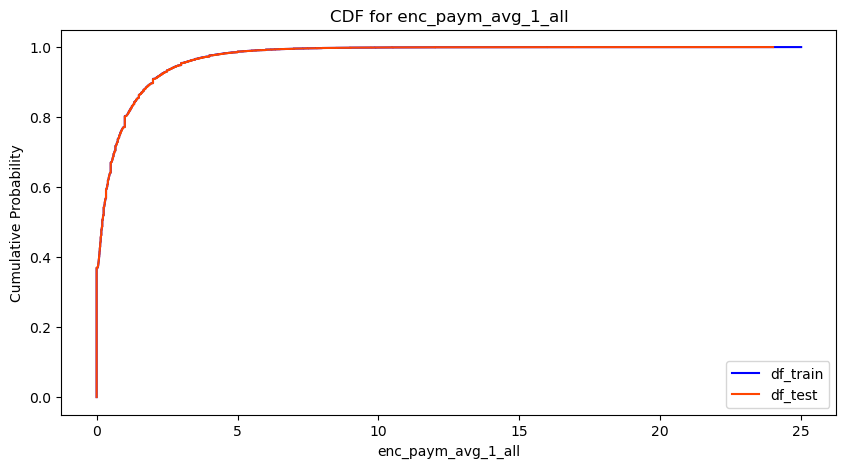

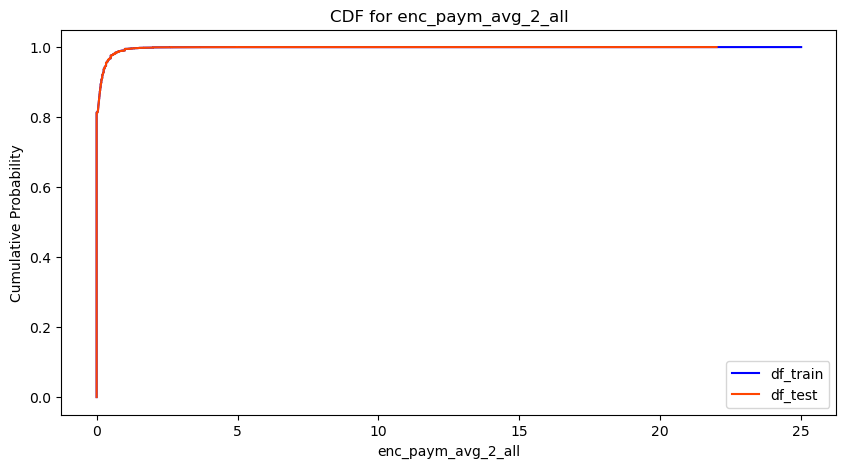

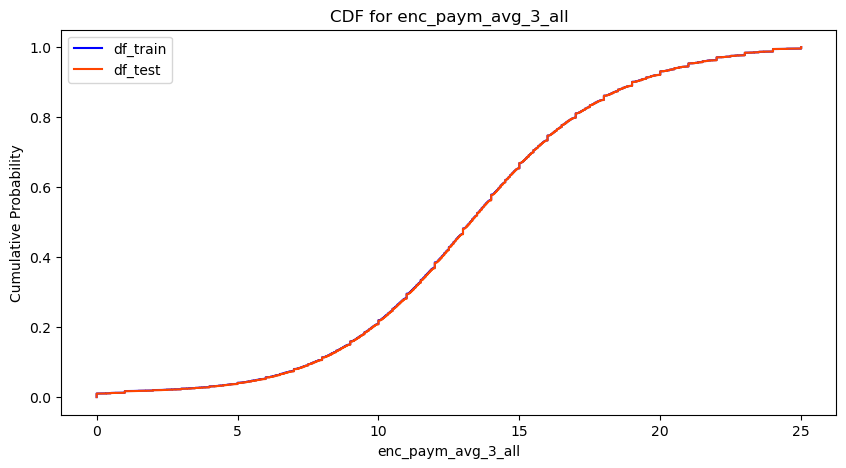

In [153]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-4:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

Распределения совпадают. Пара из них выглядит как нормальное распределление.

#### This year

In [154]:
# Выведем признаки среднего количества статусов 0-3 на один кредит за ЭТОТ год в df_train
df_train = from_enc_paym_create_normalized_group_sum_features(
    source_df_train, df_train, enc_paym_features[:12], "this_year"
)

print("df_train.shape", df_train.shape)

enc_paym_avg_0_this_year
enc_paym_avg_1_this_year
enc_paym_avg_2_this_year
enc_paym_avg_3_this_year
df_train.shape (2400000, 178)


In [155]:
# Выведу признаки среднего количества статусов 0-3 на один кредит за ЭТОТ год в df_test
df_test = from_enc_paym_create_normalized_group_sum_features(
    source_df_test, df_test, enc_paym_features[:12], "this_year"
)

print("df_test.shape", df_test.shape)

enc_paym_avg_0_this_year
enc_paym_avg_1_this_year
enc_paym_avg_2_this_year
enc_paym_avg_3_this_year
df_test.shape (600000, 178)


In [156]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-4:]

for col in columns:
    print(df_train[col].nunique(), col)

4335 enc_paym_avg_0_this_year
1685 enc_paym_avg_1_this_year
446 enc_paym_avg_2_this_year
4417 enc_paym_avg_3_this_year


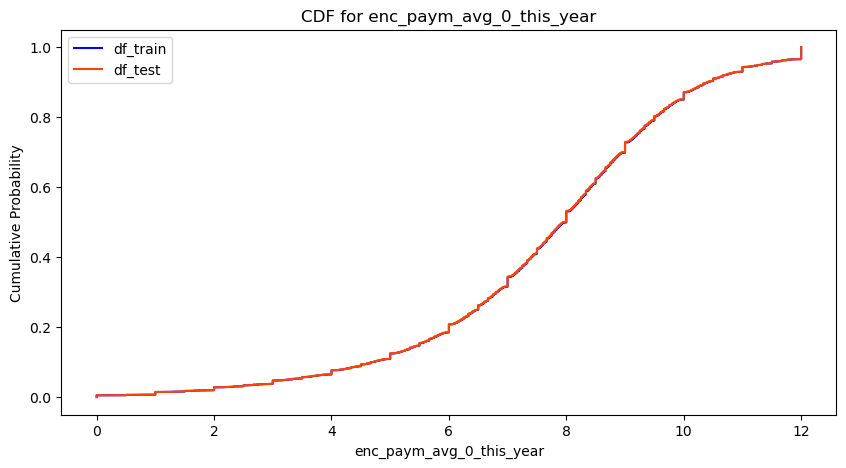

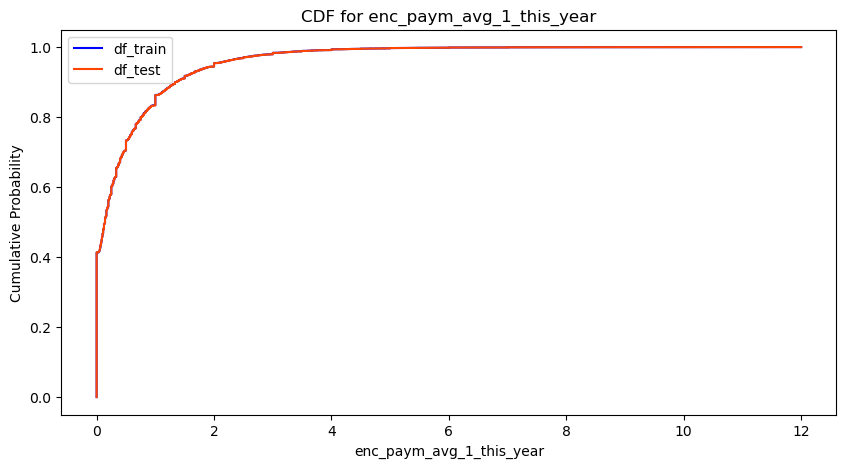

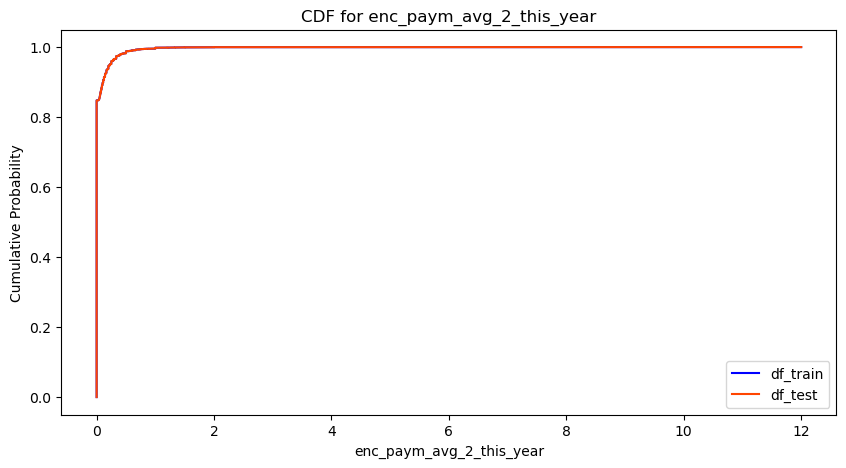

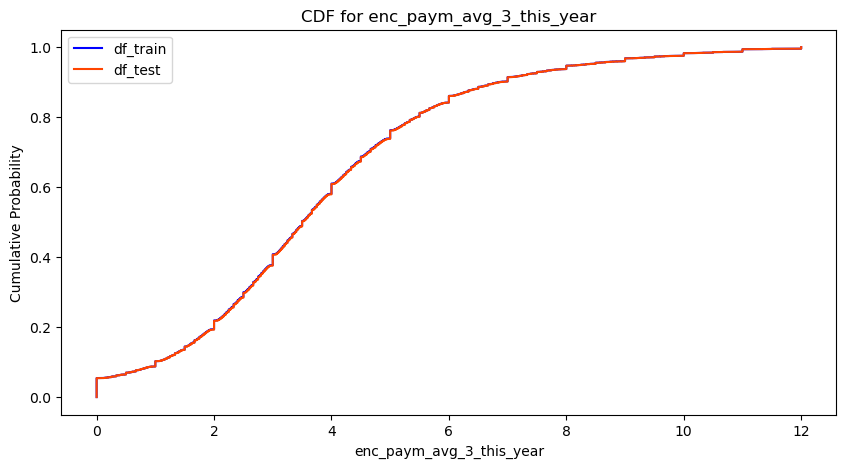

In [157]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-4:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

Распределения совпадают. Пара из них выглядит как нормальное распределление.

#### Last year

In [158]:
# Выведу признаки среднего количества статусов 0-3 на один кредит за ПРОШЛЫЙ год в df_train
df_train = from_enc_paym_create_normalized_group_sum_features(
    source_df_train, df_train, enc_paym_features[12:], "last_year"
)

print("df_train.shape", df_train.shape)

enc_paym_avg_0_last_year
enc_paym_avg_1_last_year
enc_paym_avg_2_last_year
enc_paym_avg_3_last_year
df_train.shape (2400000, 182)


In [159]:
# Выведу признаки среднего количества статусов 0-3 на один кредит за ПРОШЛЫЙ год в df_test
df_test = from_enc_paym_create_normalized_group_sum_features(
    source_df_test, df_test, enc_paym_features[12:], "last_year"
)

print("df_test.shape", df_test.shape)

enc_paym_avg_0_last_year
enc_paym_avg_1_last_year
enc_paym_avg_2_last_year
enc_paym_avg_3_last_year
df_test.shape (600000, 182)


In [160]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-4:]

for col in columns:
    print(df_train[col].nunique(), col)

3500 enc_paym_avg_0_last_year
1251 enc_paym_avg_1_last_year
361 enc_paym_avg_2_last_year
3665 enc_paym_avg_3_last_year


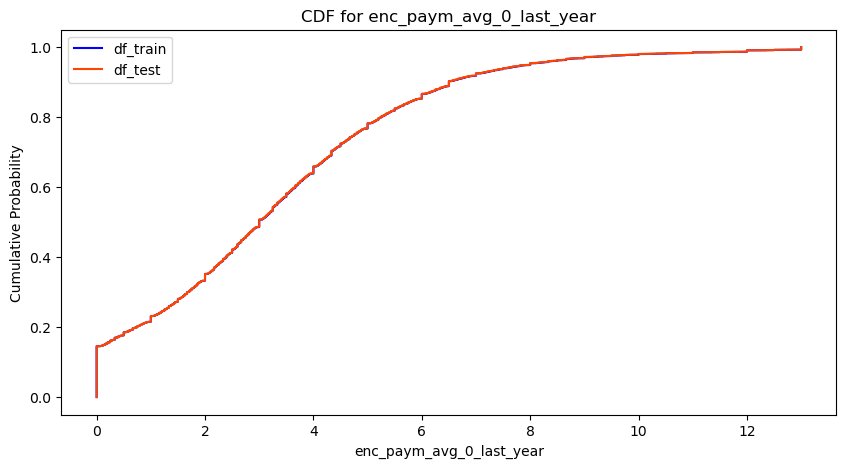

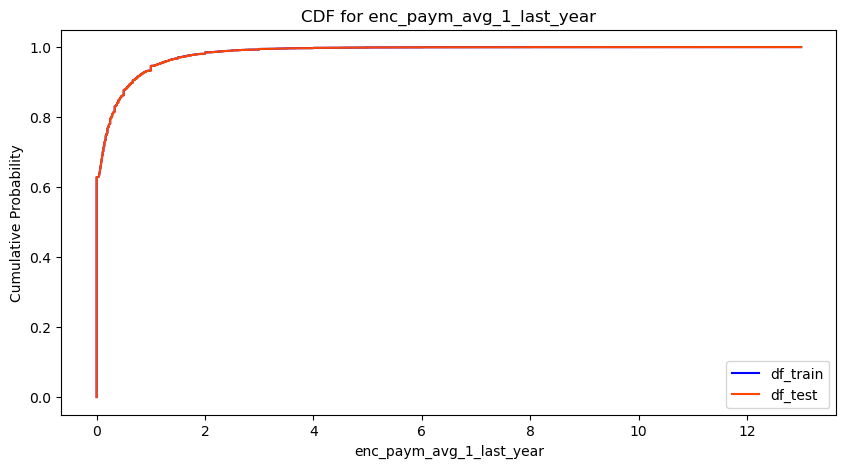

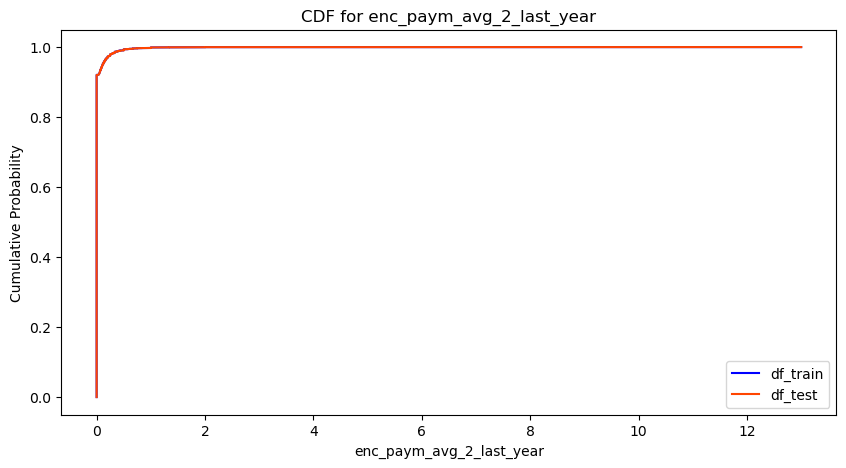

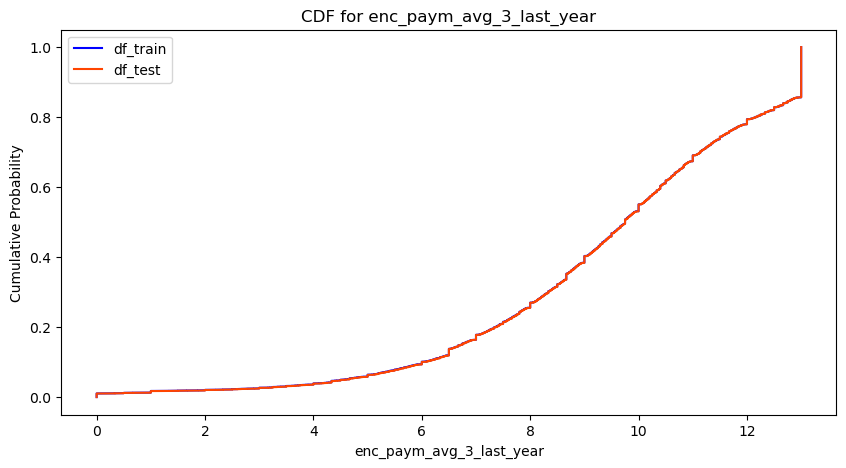

In [161]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-4:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

Распределения совпадают. Пара из них выглядит как нормальное распределление.

#### Save result and evaluation

In [162]:
# Запишем промежуточные результаты в файлы
df_train.to_csv(
    "../data/processed/encpaym_y_f_p_enc_f_p_pre_f_p_rn_train.csv", index=False
)
df_test.to_csv(
    "../data/processed/encpaym_y_f_p_enc_f_p_pre_f_p_rn_test.csv", index=False
)
df_train.shape, df_test.shape

((2400000, 182), (600000, 182))

In [163]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(
    df_train, df_test, "encpaym_y_f_p_enc_f_p_pre_f_p_rn"
)

Фолд 0
ROC AUC на трейне: 0.7736
ROC AUC на валидации: 0.7538
ROC AUC на тесте: 0.7520
Фолд 1
ROC AUC на трейне: 0.7716
ROC AUC на валидации: 0.7511
ROC AUC на тесте: 0.7522
Фолд 2
ROC AUC на трейне: 0.7759
ROC AUC на валидации: 0.7487
ROC AUC на тесте: 0.7517
Фолд 3
ROC AUC на трейне: 0.7717
ROC AUC на валидации: 0.7506
ROC AUC на тесте: 0.7518
Фолд 4
ROC AUC на трейне: 0.7738
ROC AUC на валидации: 0.7493
ROC AUC на тесте: 0.7530
Среднее ROC AUC на трейне: 0.7733 ± 0.0016
Среднее ROC AUC на валидации: 0.7507 ± 0.0018
Среднее ROC AUC на тесте: 0.7521 ± 0.0005


In [164]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455


In [165]:
# Посмотрим на важности признаков
importances_dict

{'enc_paym_avg_1_all': 5.577243892386354,
 'pre_util_prop_3': 5.036901626487007,
 'enc_loans_credit_type_prop_0': 4.235584956457109,
 'pre_till_pclose_prop_10': 3.348797780338512,
 'pre_util_prop_6': 3.220447804394776,
 'pre_loans_outstanding_prop_1': 2.62270169191221,
 'enc_paym_avg_0_this_year': 2.479454906432735,
 'rn_max': 2.441342197763625,
 'pre_util_mean_freq': 2.2910035782250087,
 'pre_loans_credit_limit_prop_2': 2.257281455382506,
 'enc_paym_avg_2_all': 2.066030222629662,
 'enc_paym_avg_1_this_year': 2.0117868973145985,
 'pre_loans_credit_cost_rate_prop_11': 1.881702184203098,
 'pre_loans_credit_cost_rate_prop_4': 1.855938712516683,
 'pre_loans_outstanding_prop_5': 1.8250314000591896,
 'pre_loans_credit_cost_rate_prop_6': 1.6198988433939407,
 'pre_loans_credit_limit_mean_freq': 1.522754086611756,
 'enc_paym_avg_0_all': 1.508328070329519,
 'enc_loans_credit_status_mean_freq': 1.4529131163909415,
 'pre_util_prop_16': 1.4087904250076588,
 'enc_paym_1_prop_0': 1.2683063122030755,


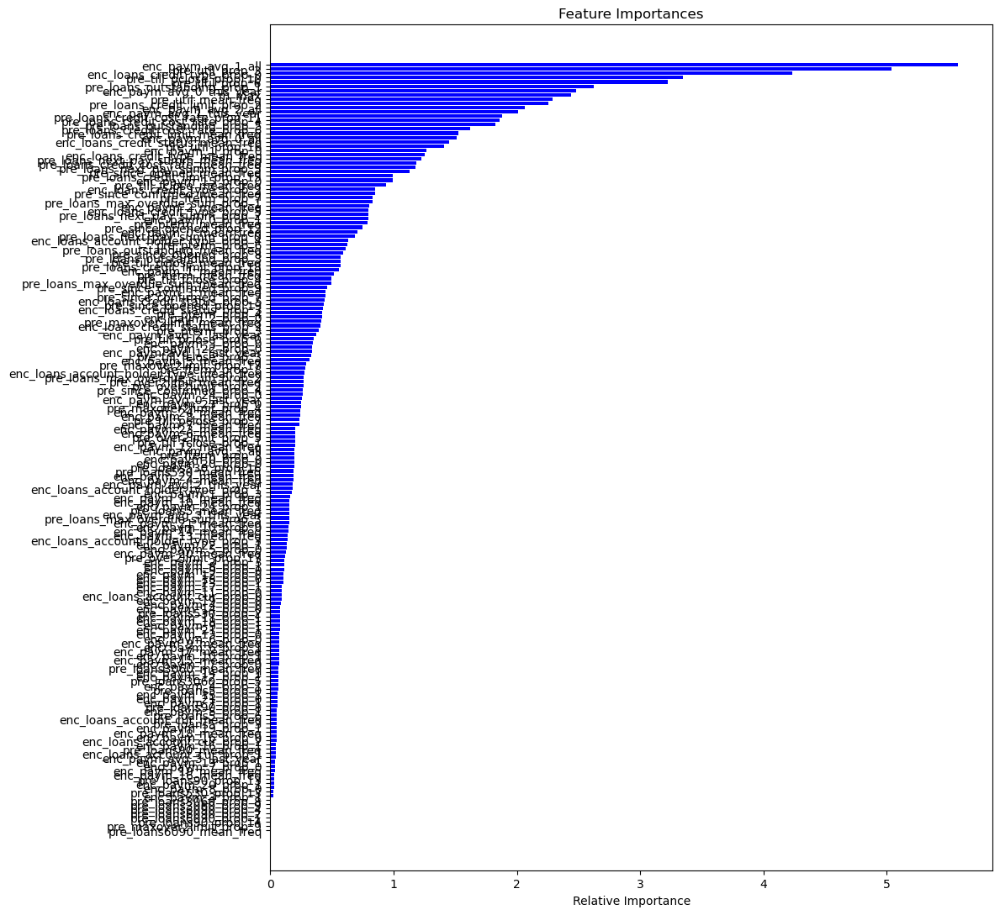

In [166]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

### Enc_paym_features sum mean value frequency difference,  periods difference

Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за все меcяца.   
Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за этот год.    
Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за прошлый год.   
Создадим признаки разницы значений между всеми enc_paym_avg_{0 - 3} за этот и прошлый год.    

In [167]:
source_df_train = pd.read_csv("../data/processed/source_data_train_1.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test_1.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [168]:
df_train = pd.read_csv("../data/processed/encpaym_y_f_p_enc_f_p_pre_f_p_rn_train.csv")
df_test = pd.read_csv("../data/processed/encpaym_y_f_p_enc_f_p_pre_f_p_rn_test.csv")
df_train.shape, df_test.shape

((2400000, 182), (600000, 182))

In [169]:
# Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за все меcяца.
df_train = create_enc_paym_avg_pair_diff_one_period(df_train, "all")
df_test = create_enc_paym_avg_pair_diff_one_period(df_test, "all")
df_train.shape, df_test.shape

((2400000, 188), (600000, 188))

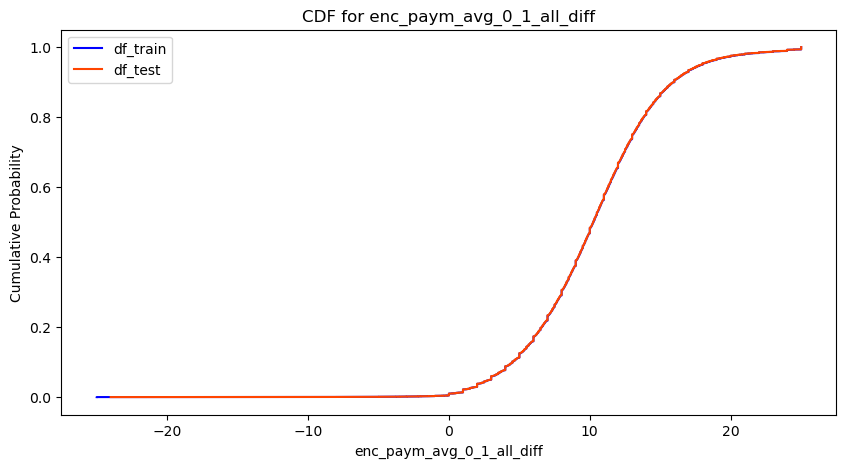

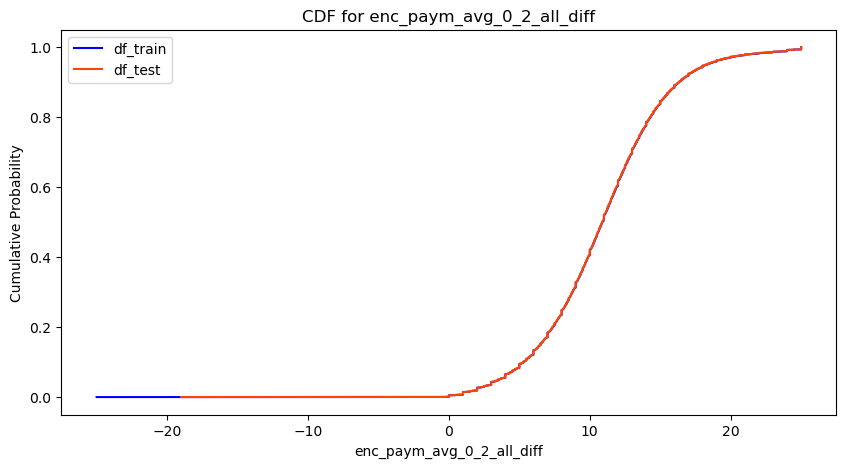

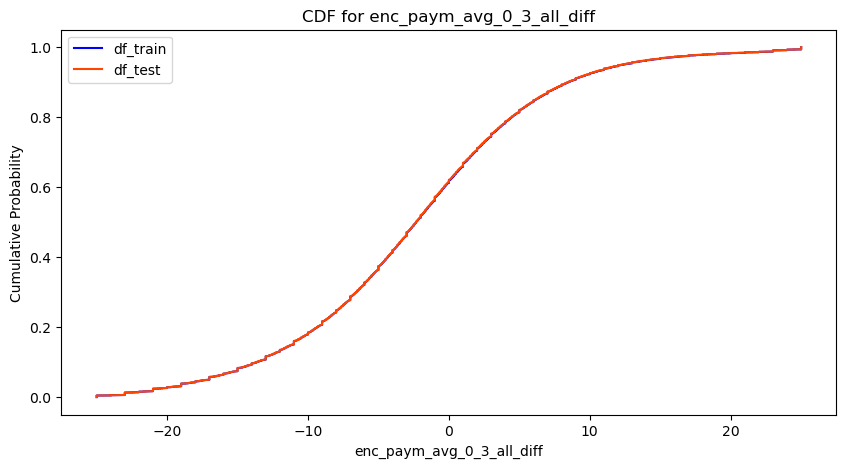

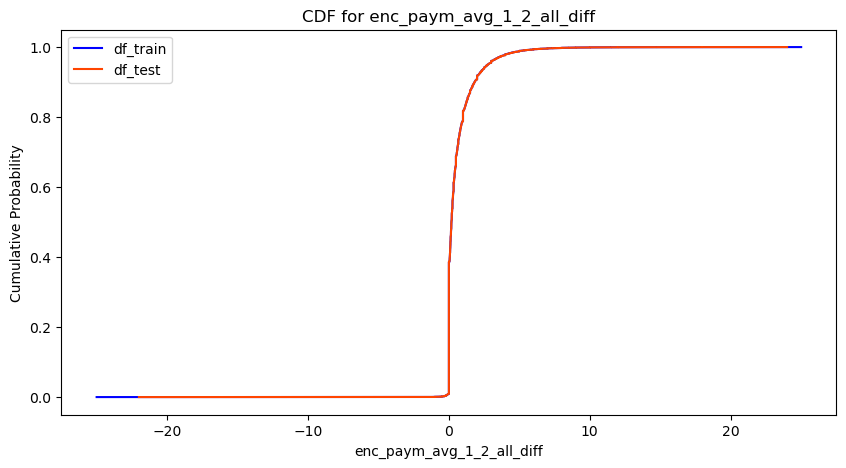

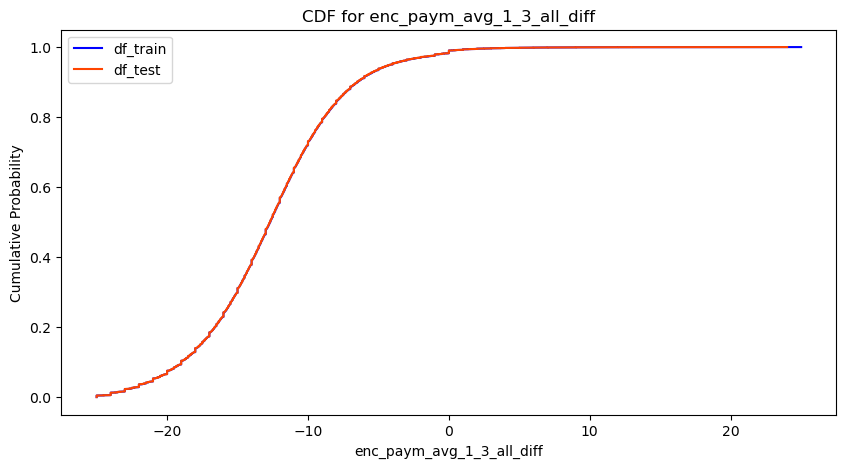

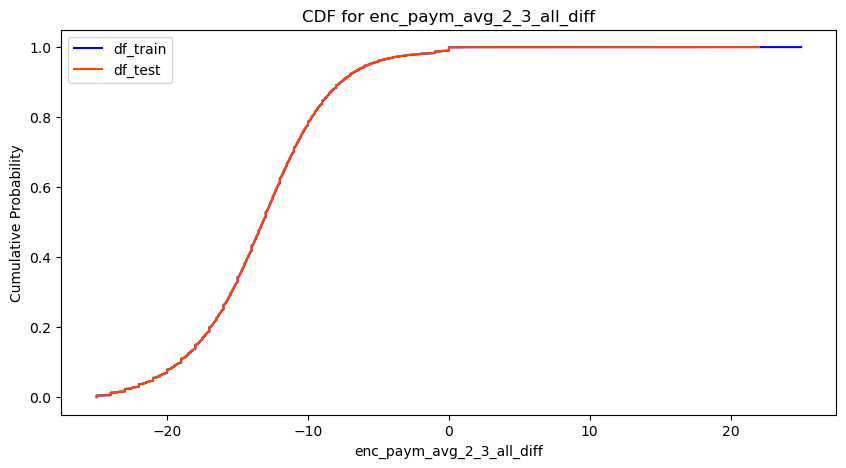

In [170]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-6:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

In [171]:
# Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за этот год.
df_train = create_enc_paym_avg_pair_diff_one_period(df_train, "this_year")
df_test = create_enc_paym_avg_pair_diff_one_period(df_test, "this_year")
df_train.shape, df_test.shape

((2400000, 194), (600000, 194))

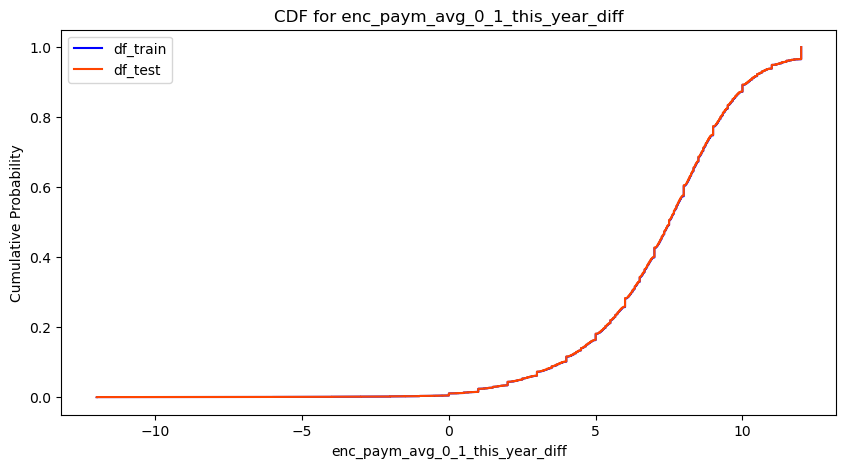

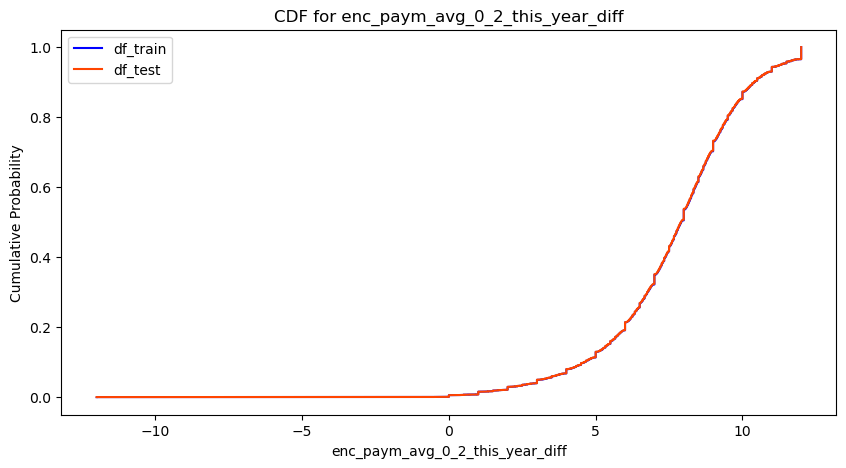

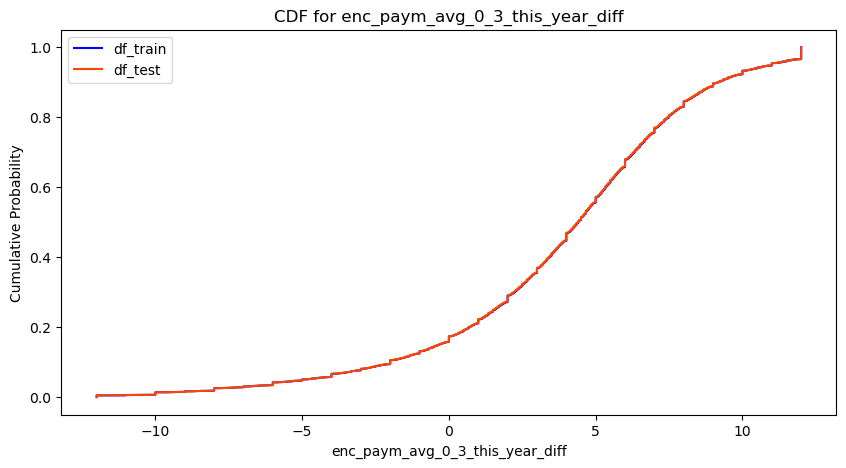

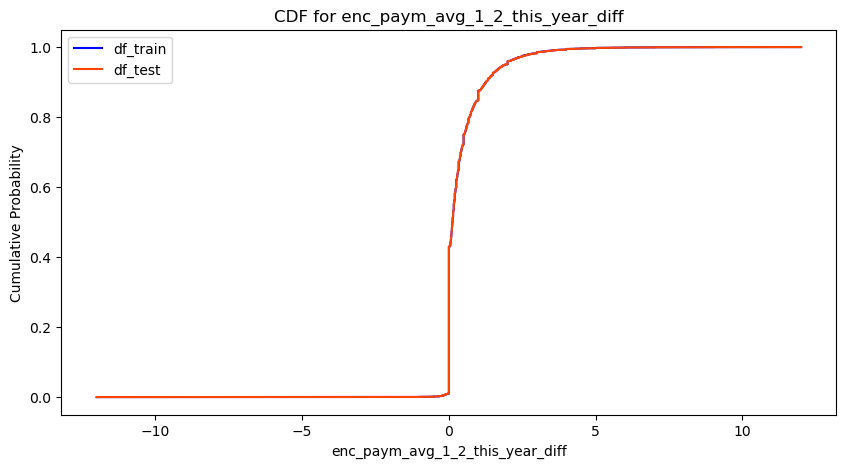

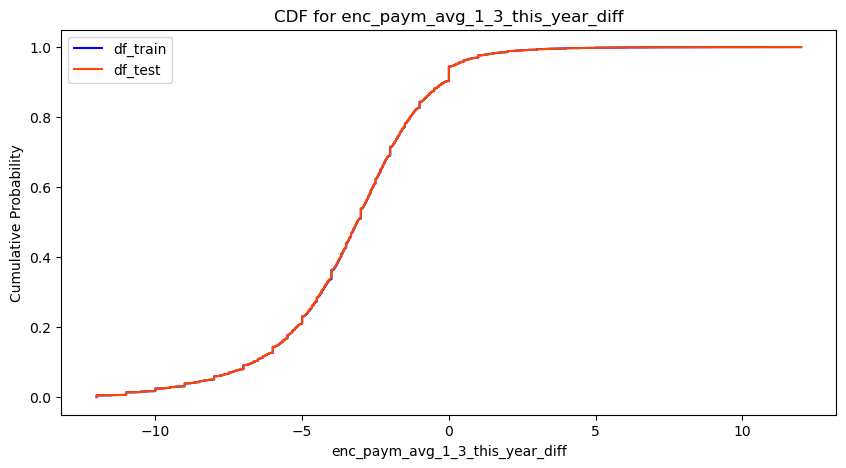

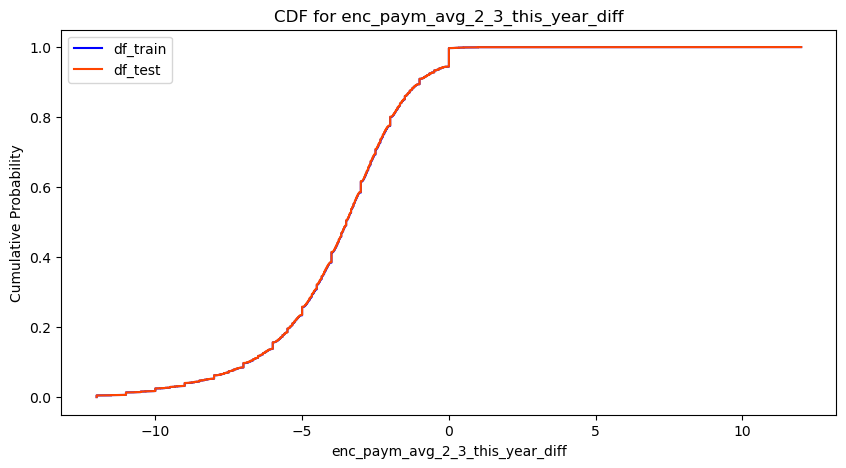

In [172]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-6:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

In [173]:
#  Создадим признаки разницы значений между всеми парами enc_paym_avg_{0 - 3} за прошлый год.
df_train = create_enc_paym_avg_pair_diff_one_period(df_train, "last_year")
df_test = create_enc_paym_avg_pair_diff_one_period(df_test, "last_year")
df_train.shape, df_test.shape

((2400000, 200), (600000, 200))

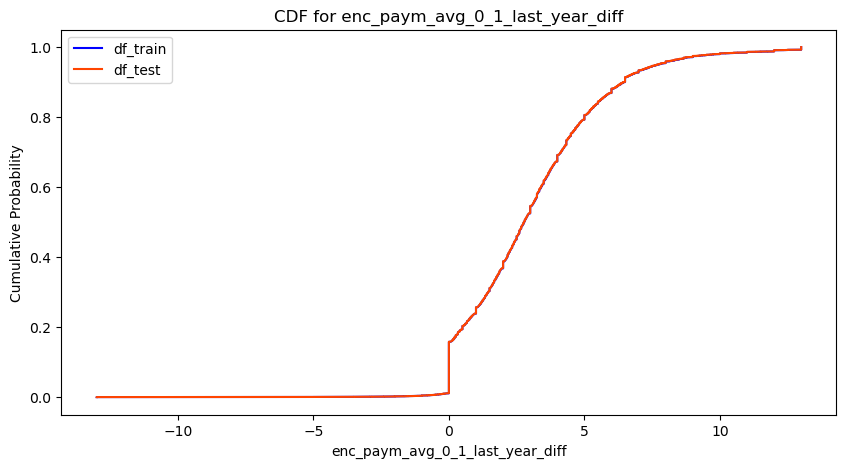

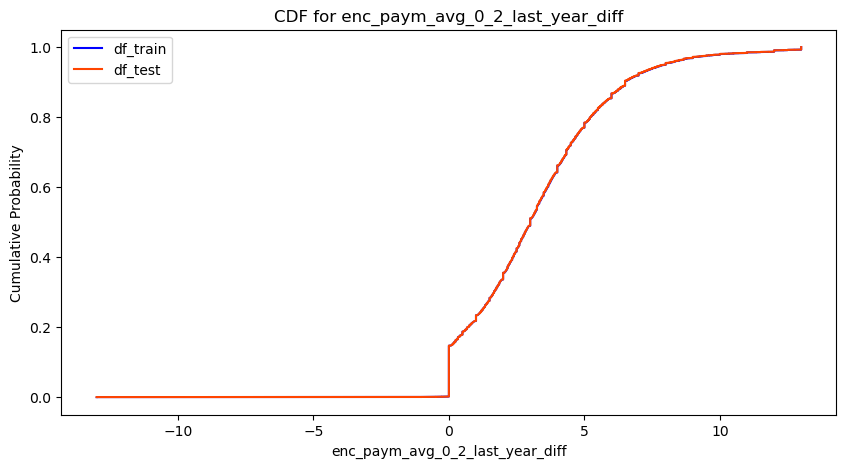

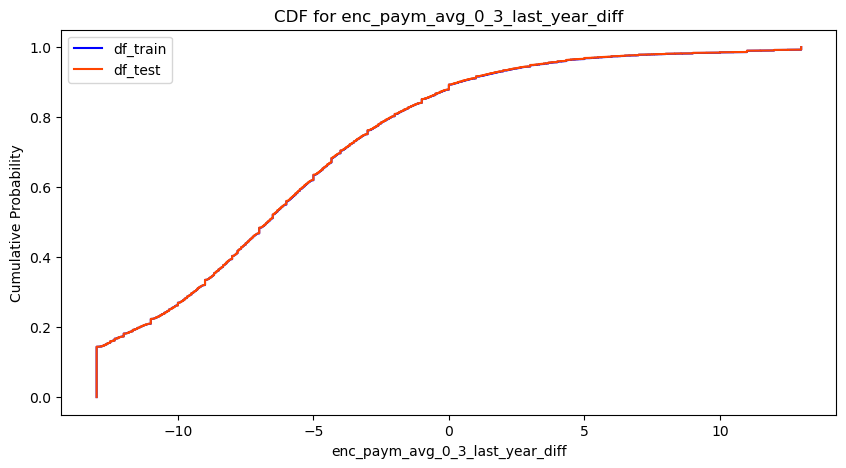

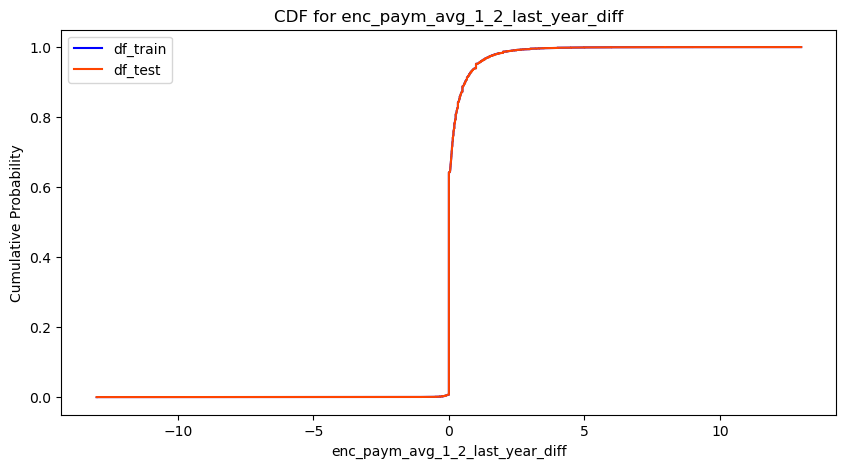

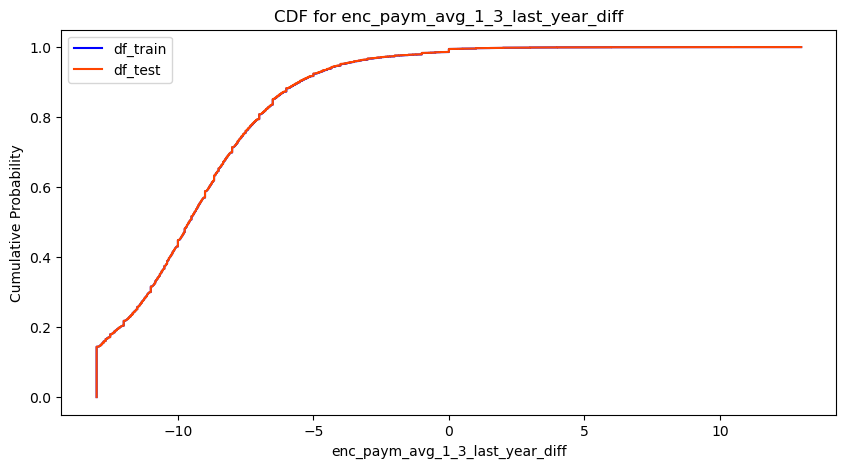

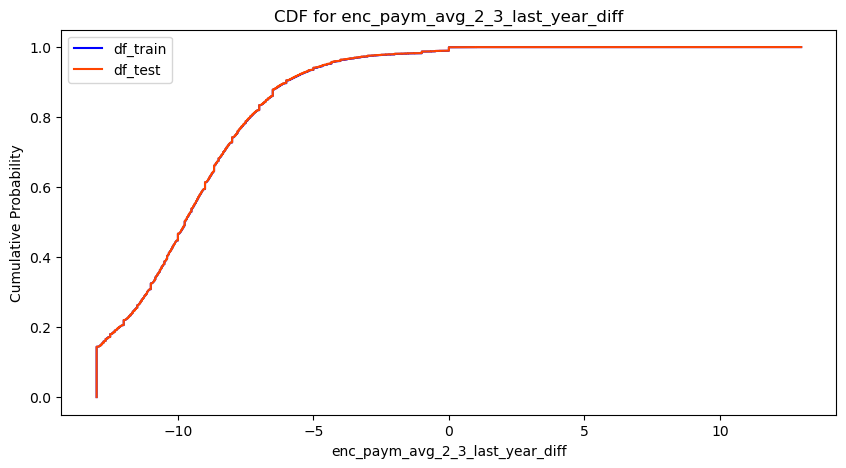

In [174]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-6:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

In [175]:
# Создадим признаки разницы значений между всеми enc_paym_avg_{0 - 3} за этот и прошлый год.
df_train = create_enc_paym_avg_pair_diff_years(df_train)
df_test = create_enc_paym_avg_pair_diff_years(df_test)
df_train.shape, df_test.shape

((2400000, 204), (600000, 204))

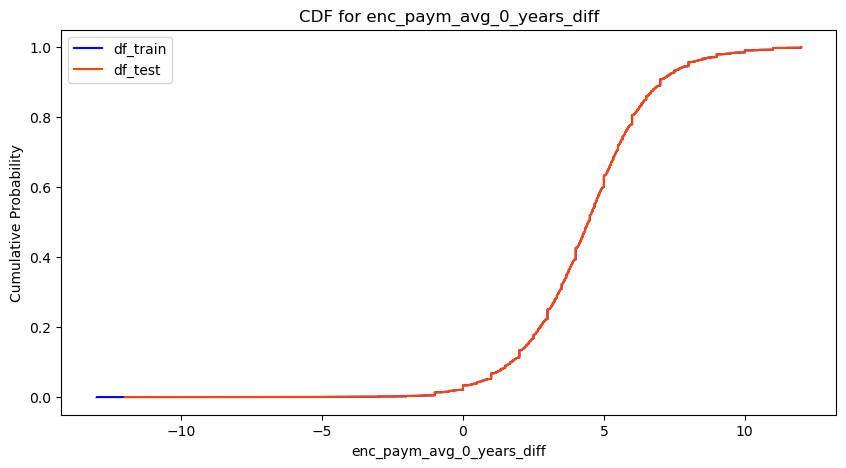

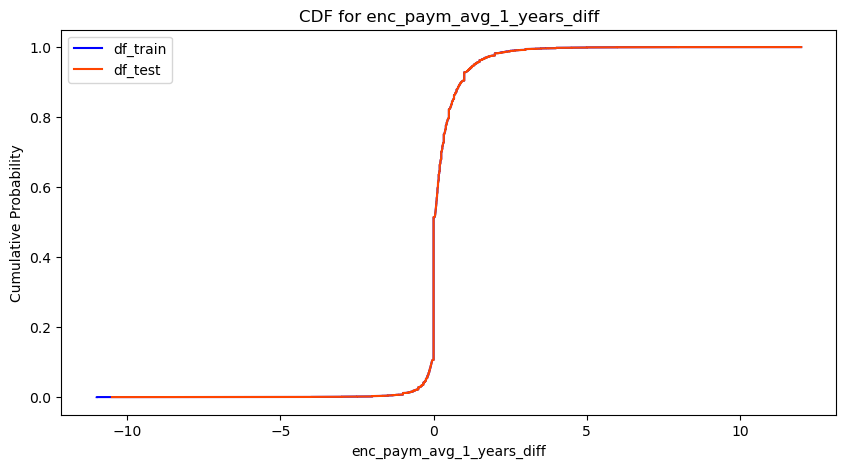

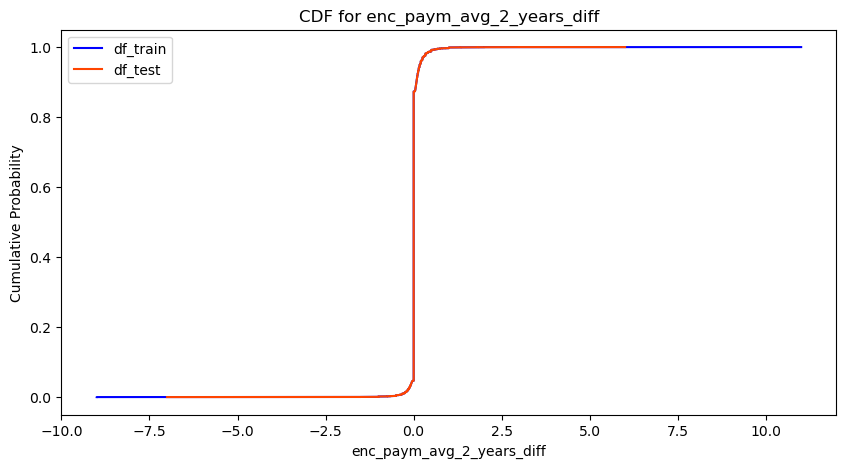

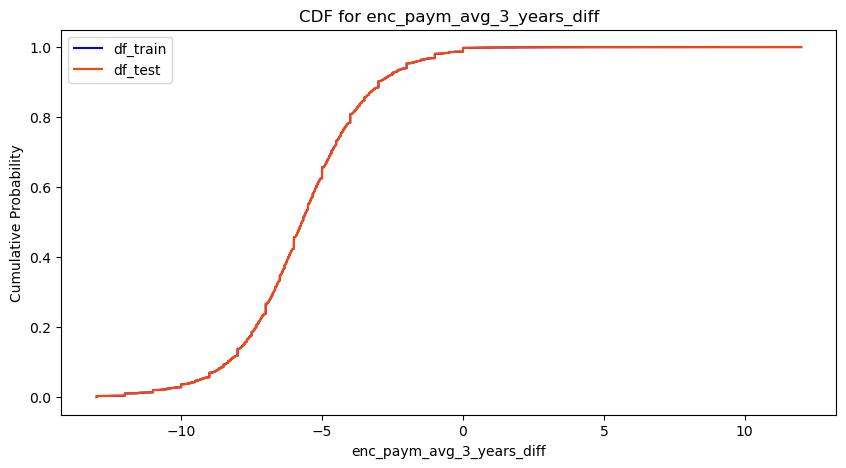

In [176]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-4:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

In [177]:
# Запишем промежуточные результаты в файлы
df_train.to_csv(
    "../data/processed/encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv", index=False
)
df_test.to_csv(
    "../data/processed/encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv", index=False
)
df_train.shape, df_test.shape

((2400000, 204), (600000, 204))

In [178]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(
    df_train, df_test, "encpaym_d_y_f_p_enc_f_p_pre_f_p_rn"
)

Фолд 0
ROC AUC на трейне: 0.7761
ROC AUC на валидации: 0.7546
ROC AUC на тесте: 0.7525
Фолд 1
ROC AUC на трейне: 0.7705
ROC AUC на валидации: 0.7515
ROC AUC на тесте: 0.7522
Фолд 2
ROC AUC на трейне: 0.7688
ROC AUC на валидации: 0.7495
ROC AUC на тесте: 0.7518
Фолд 3
ROC AUC на трейне: 0.7711
ROC AUC на валидации: 0.7507
ROC AUC на тесте: 0.7520
Фолд 4
ROC AUC на трейне: 0.7695
ROC AUC на валидации: 0.7494
ROC AUC на тесте: 0.7521
Среднее ROC AUC на трейне: 0.7712 ± 0.0026
Среднее ROC AUC на валидации: 0.7511 ± 0.0019
Среднее ROC AUC на тесте: 0.7521 ± 0.0002


In [179]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455
7,encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.771210,0.002581,0.751143,0.001899,0.752105,0.000246


In [180]:
# Посмотрим на важности признаков
importances_dict

{'enc_paym_avg_0_1_this_year_diff': 5.772471552675427,
 'pre_util_prop_3': 5.21008925271068,
 'enc_loans_credit_type_prop_0': 4.1304790186683995,
 'pre_till_pclose_prop_10': 3.7647782137750325,
 'pre_util_prop_6': 3.308654579849606,
 'enc_paym_avg_1_all': 2.863776227286237,
 'pre_util_mean_freq': 2.740131090264479,
 'pre_loans_outstanding_prop_1': 2.6888072808799404,
 'rn_max': 2.4985341125464107,
 'pre_loans_credit_limit_prop_2': 2.33529979185989,
 'enc_paym_avg_2_all': 2.217996665047513,
 'pre_loans_credit_cost_rate_prop_11': 1.9710184332135707,
 'pre_loans_credit_cost_rate_prop_4': 1.7962882477134183,
 'pre_loans_outstanding_prop_5': 1.7911271991662734,
 'pre_loans_credit_cost_rate_prop_6': 1.7354261757947205,
 'enc_paym_avg_0_1_all_diff': 1.6871523578179026,
 'pre_loans_credit_limit_mean_freq': 1.667916944347257,
 'enc_paym_avg_1_2_this_year_diff': 1.5164187189453289,
 'enc_loans_credit_status_mean_freq': 1.3199866214239826,
 'pre_loans_credit_cost_rate_mean_freq': 1.28903255434414

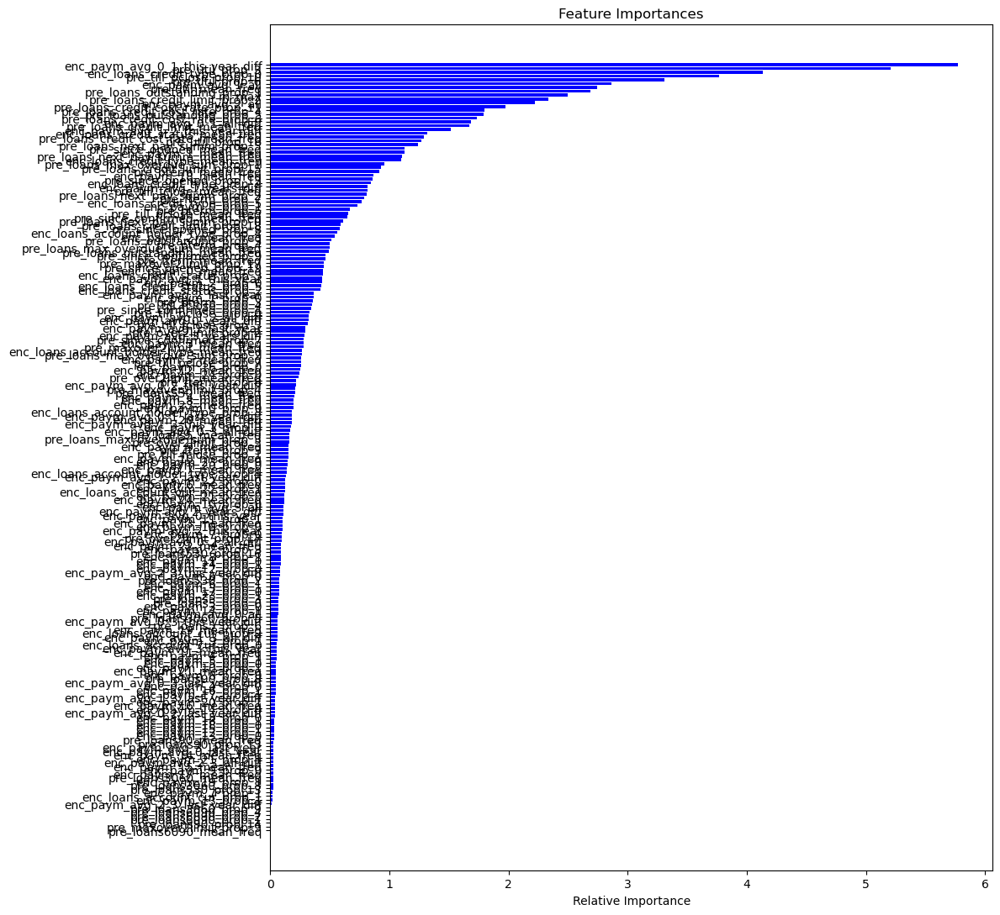

In [181]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

## Flag_features

### Research flag_features

In [182]:
source_df_train = pd.read_csv("../data/processed/source_data_train_1.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test_1.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [183]:
# Проверим признаки группы на бинарность
flag = all(df[col].nunique() == 2 for col in flag_features)
print(
    "Все признаки группы бинарные" if flag else "Есть признаки, не являющиеся бинарными"
)

Все признаки группы бинарные


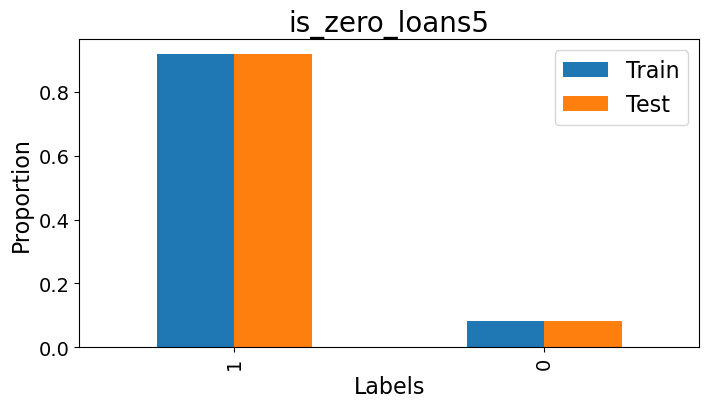

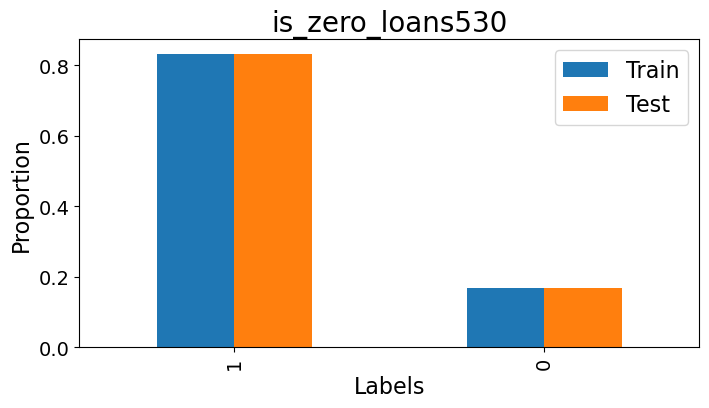

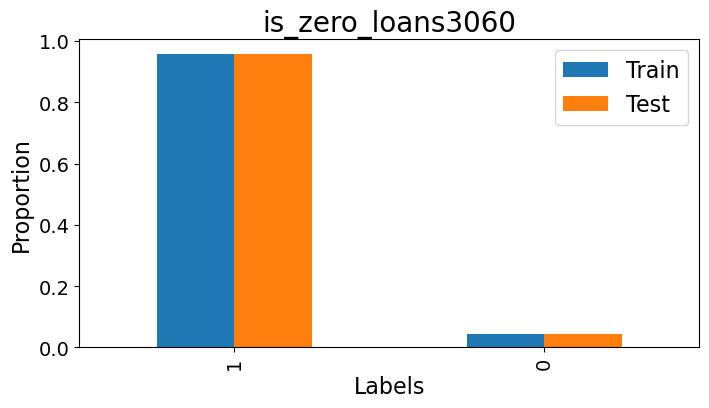

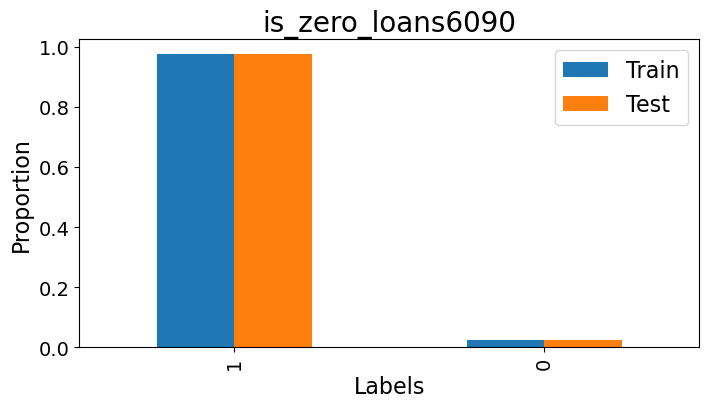

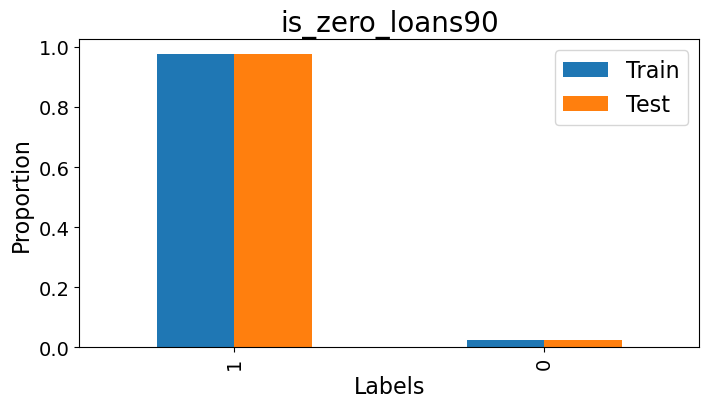

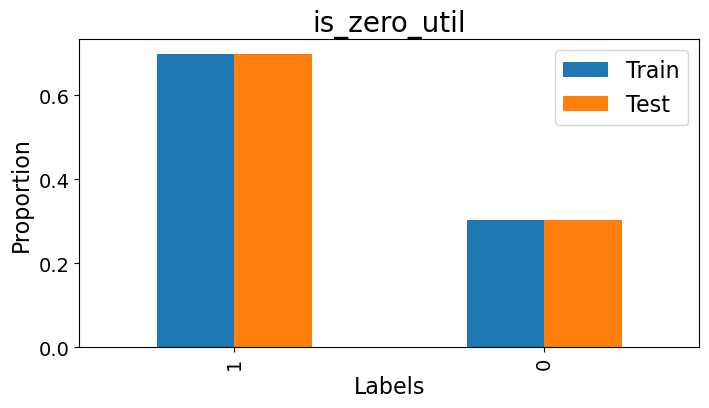

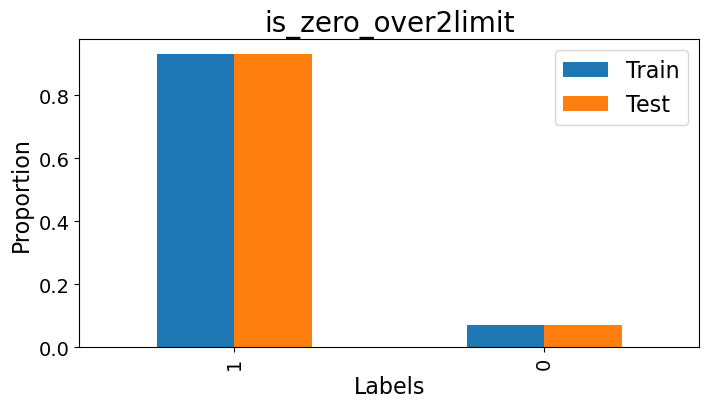

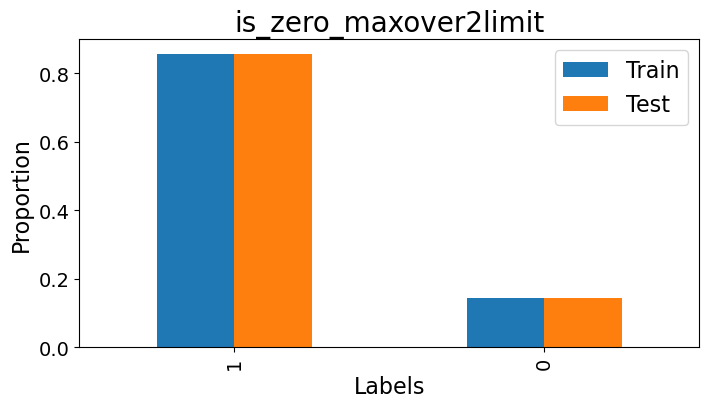

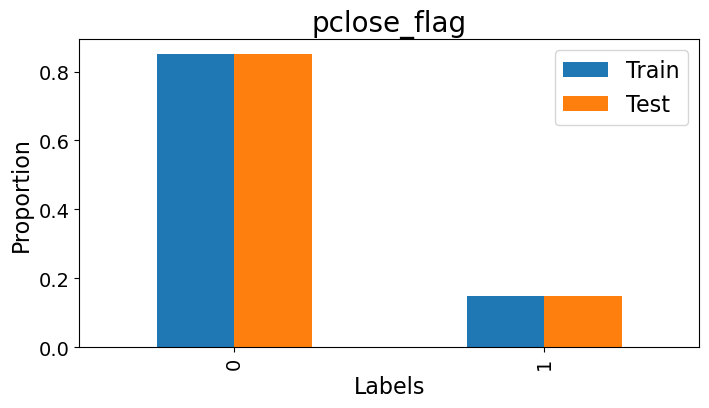

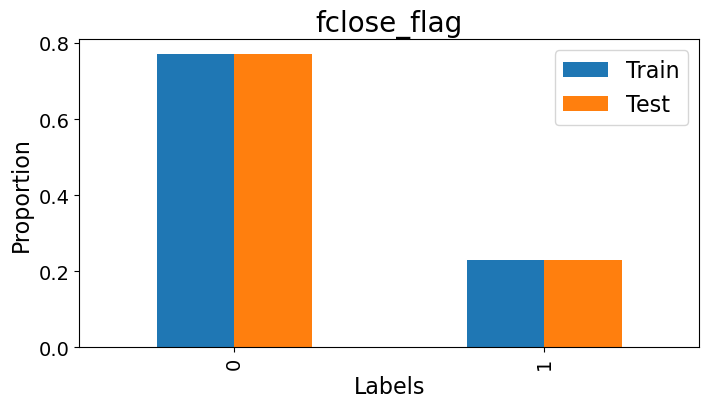

In [184]:
"""
Посмотрим на формы распределений признаков группы и сравним 
их схожесть между тренировочный и тестовым набором
"""
for col in flag_features:
    # Считаем пропорцию каждого уникального значения признака в train и test
    train_counts = source_df_train[col].value_counts(normalize=True)
    test_counts = source_df_test[col].value_counts(normalize=True)

    """
    Объединяем результаты в DataFrame с двумя столбцами: Train и Test.
    Если какая-то категория встречается только в одной из выборок,
    то для другой ставится NaN, который после объединения заменяется  на 0.
    """
    df_plot = pd.DataFrame({"Train": train_counts, "Test": test_counts}).fillna(0)

    """
    Для сортировки категорий по убыванию доли, создадим столбец суммы частот 
    категорий в train и test.
    """
    df_plot["sum"] = df_plot["Train"] + df_plot["Test"]

    # Сортируем датафрейм и удаляем колонку sum
    df_plot_sorted = df_plot.sort_values(by="sum", ascending=False).drop(columns="sum")

    # Строим bar plot
    ax = df_plot_sorted.plot(kind="bar", figsize=(8, 4))

    # Создаём подписи
    ax.set_title(col, fontsize=20)
    ax.set_xlabel("Labels", fontsize=16)
    ax.set_ylabel("Proportion", fontsize=16)

    # Задаём размер чисел на графике
    ax.tick_params(axis="x", labelsize=14)
    ax.tick_params(axis="y", labelsize=14)

    ax.legend(fontsize=16)
    plt.show()

Визуально распределения признаков практически совпадают, что свидетельствует о корректном разбиении данных и отсутствии явного сдвига между выборками.      
Распределения по большинству признаков сильно смещены: для многих из них наблюдается выраженное преобладание значения 1 - отсутствие просрочки, что нормально для большинства клиентов.

### Create proportion value 1 flag_features

In [185]:
source_df_train = pd.read_csv("../data/processed/source_data_train_1.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test_1.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [186]:
df_train = pd.read_csv("../data/processed/encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv")
df_test = pd.read_csv("../data/processed/encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv")
df_train.shape, df_test.shape

((2400000, 204), (600000, 204))

In [187]:
flag_features_dict = {key: [1] for key in flag_features}
flag_features_dict

{'is_zero_loans5': [1],
 'is_zero_loans530': [1],
 'is_zero_loans3060': [1],
 'is_zero_loans6090': [1],
 'is_zero_loans90': [1],
 'is_zero_util': [1],
 'is_zero_over2limit': [1],
 'is_zero_maxover2limit': [1],
 'pclose_flag': [1],
 'fclose_flag': [1]}

In [188]:
# Создадим признаки пропорций значения 1 в тренировочном датасете
df_train = create_definite_value_proportion_features(
    source_df_train, df_train, flag_features_dict
)
df_train.shape

--------------------------------------------------
Исходный признак: is_zero_loans5
Новые фичи:
is_zero_loans5_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans530
Новые фичи:
is_zero_loans530_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans3060
Новые фичи:
is_zero_loans3060_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans6090
Новые фичи:
is_zero_loans6090_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans90
Новые фичи:
is_zero_loans90_prop_1
--------------------------------------------------
Исходный признак: is_zero_util
Новые фичи:
is_zero_util_prop_1
--------------------------------------------------
Исходный признак: is_zero_over2limit
Новые фичи:
is_zero_over2limit_prop_1
--------------------------------------------------
Исходный признак: is_zero_maxover2limit
Новые фичи:
is_zero_maxover2limit_prop_1
--------------------

(2400000, 214)

In [189]:
# Создадим признаки пропорций значения 1 в тестовом датасете
df_test = create_definite_value_proportion_features(
    source_df_test, df_test, flag_features_dict
)
df_test.shape

--------------------------------------------------
Исходный признак: is_zero_loans5
Новые фичи:
is_zero_loans5_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans530
Новые фичи:
is_zero_loans530_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans3060
Новые фичи:
is_zero_loans3060_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans6090
Новые фичи:
is_zero_loans6090_prop_1
--------------------------------------------------
Исходный признак: is_zero_loans90
Новые фичи:
is_zero_loans90_prop_1
--------------------------------------------------
Исходный признак: is_zero_util
Новые фичи:
is_zero_util_prop_1
--------------------------------------------------
Исходный признак: is_zero_over2limit
Новые фичи:
is_zero_over2limit_prop_1
--------------------------------------------------
Исходный признак: is_zero_maxover2limit
Новые фичи:
is_zero_maxover2limit_prop_1
--------------------

(600000, 214)

In [190]:
# Создадим признаки средних значений группы по строкам.
df_train = from_is_zero_prop_1_create_sum_prop_1_feature(df_train)
df_test = from_is_zero_prop_1_create_sum_prop_1_feature(df_test)
df_train.shape, df_test.shape

((2400000, 215), (600000, 215))

In [191]:
# Запишем промежуточные результаты в файлы
df_train.to_csv(
    "../data/processed/flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv", index=False
)
df_test.to_csv(
    "../data/processed/flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv", index=False
)
df_train.shape, df_test.shape

((2400000, 215), (600000, 215))

In [192]:
# Посмотрим на количество уникальных значений в новых фичах
columns = df_train.columns[-11:]

for col in columns:
    print(df_train[col].nunique(), col)

304 is_zero_loans5_prop_1
374 is_zero_loans530_prop_1
283 is_zero_loans3060_prop_1
250 is_zero_loans6090_prop_1
300 is_zero_loans90_prop_1
411 is_zero_util_prop_1
295 is_zero_over2limit_prop_1
367 is_zero_maxover2limit_prop_1
346 pclose_flag_prop_1
415 fclose_flag_prop_1
1740 is_zero_sum_prop_1


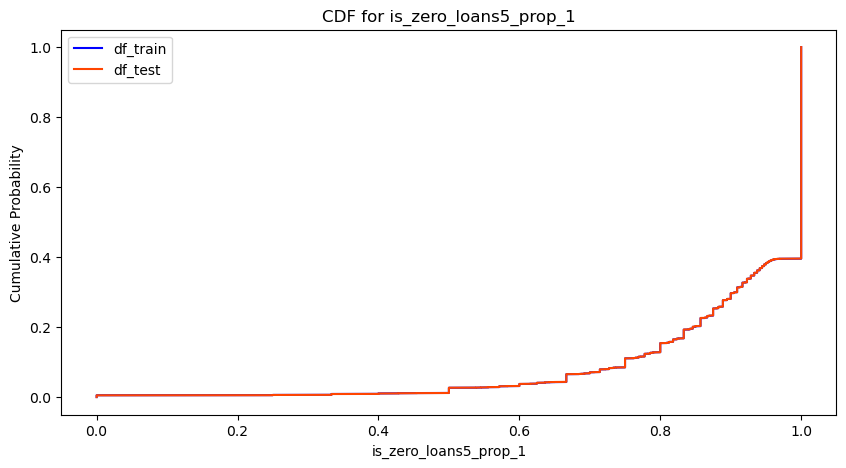

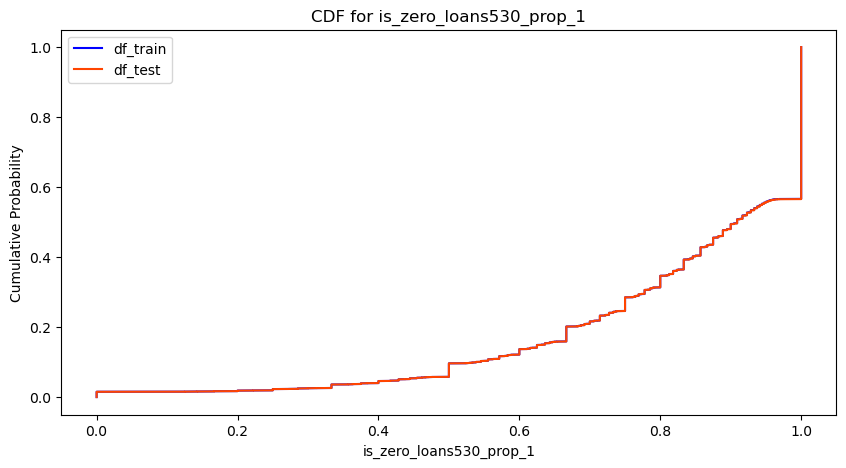

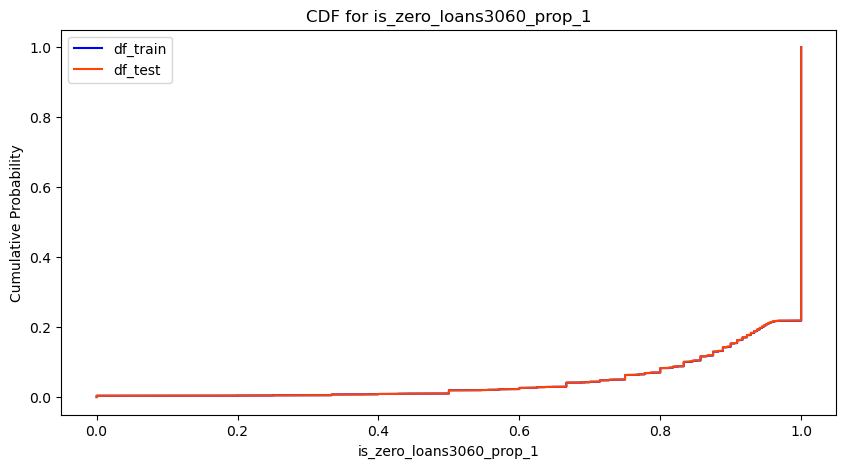

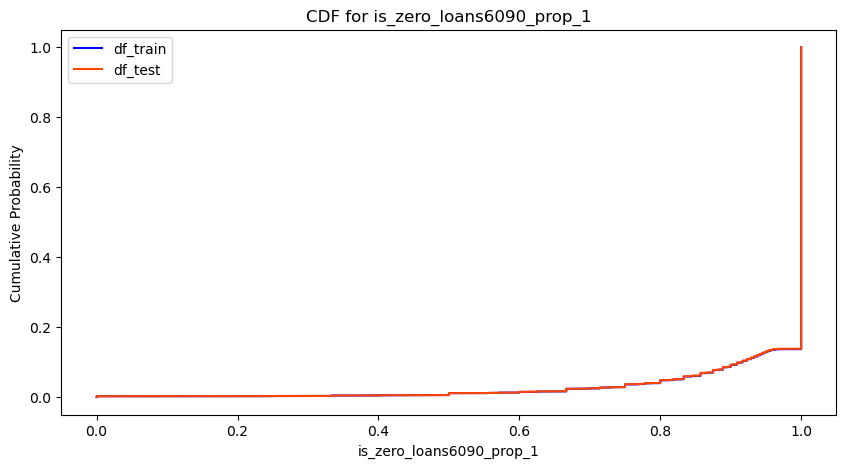

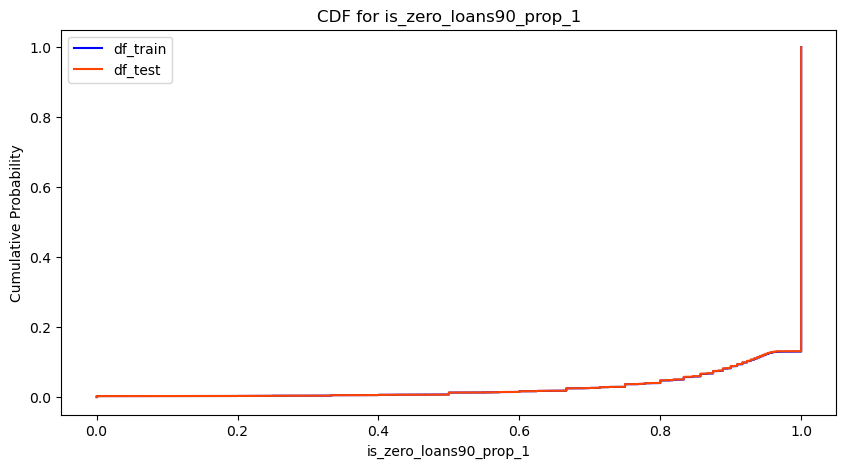

...

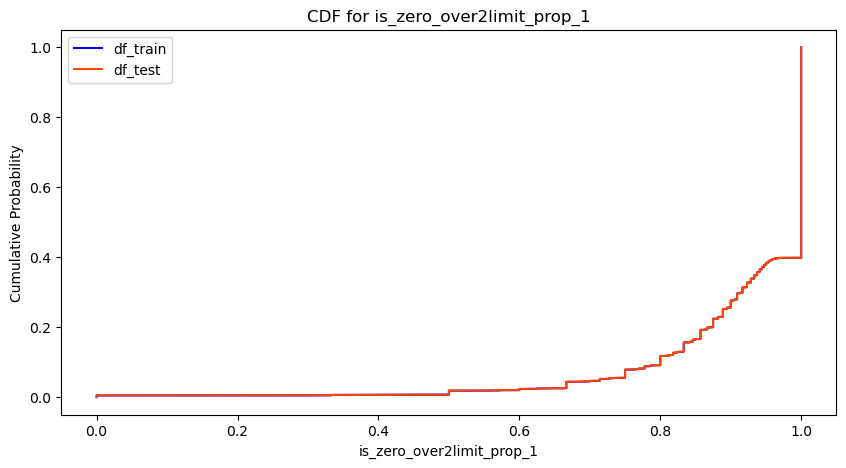

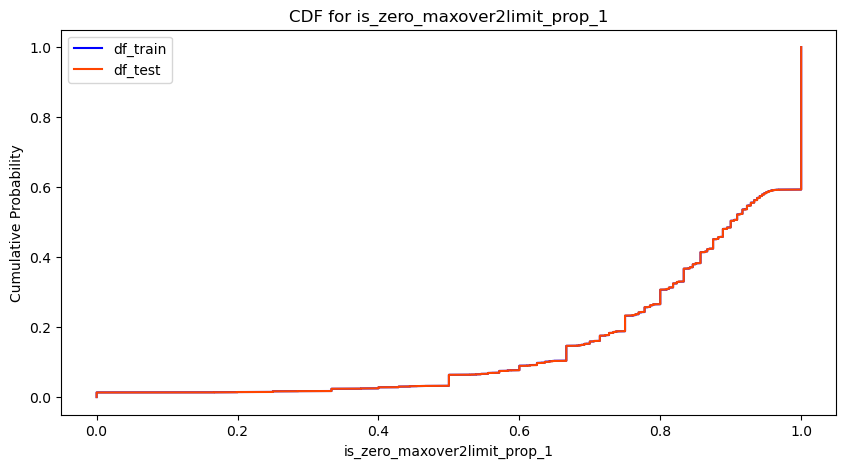

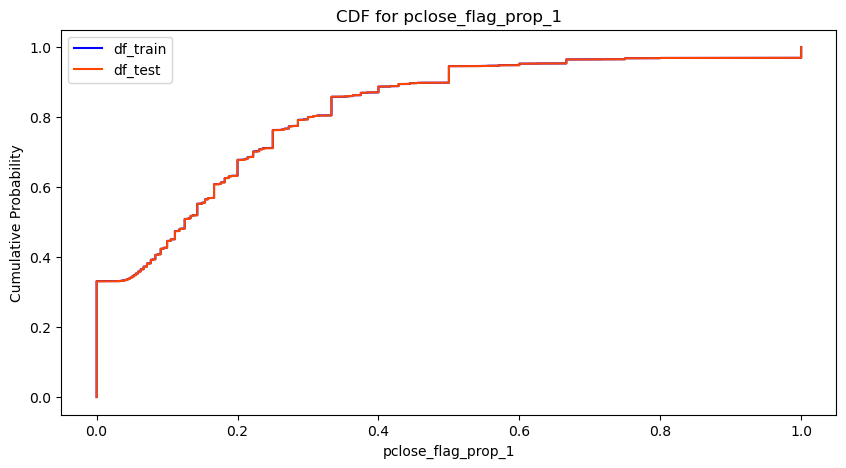

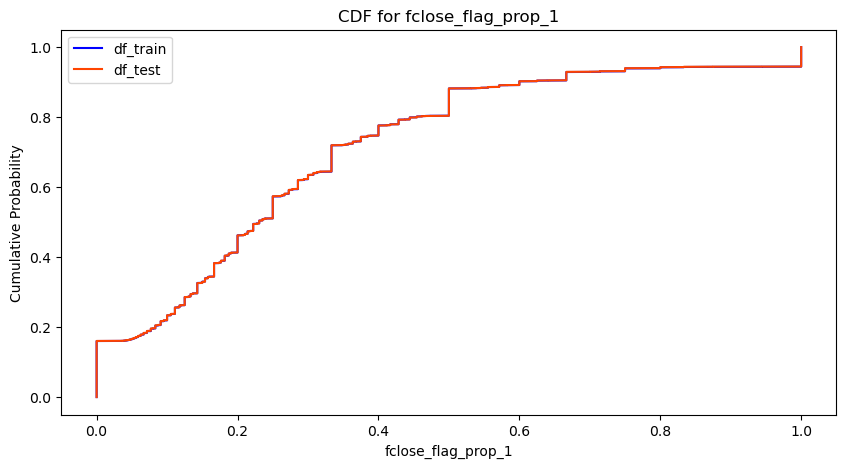

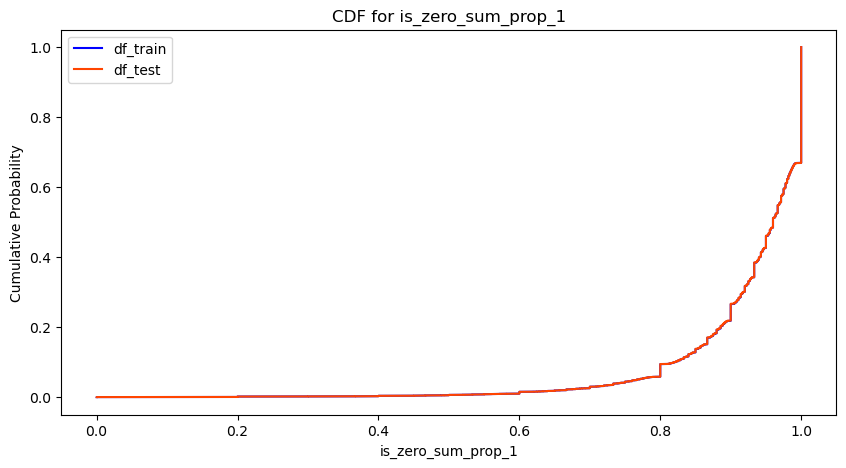

In [193]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-11:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

In [194]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(
    df_train, df_test, "flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn"
)

Фолд 0
ROC AUC на трейне: 0.7779
ROC AUC на валидации: 0.7568
ROC AUC на тесте: 0.7556
Фолд 1
ROC AUC на трейне: 0.7747
ROC AUC на валидации: 0.7534
ROC AUC на тесте: 0.7551
Фолд 2
ROC AUC на трейне: 0.7710
ROC AUC на валидации: 0.7519
ROC AUC на тесте: 0.7546
Фолд 3
ROC AUC на трейне: 0.7803
ROC AUC на валидации: 0.7539
ROC AUC на тесте: 0.7548
Фолд 4
ROC AUC на трейне: 0.7722
ROC AUC на валидации: 0.7516
ROC AUC на тесте: 0.7546
Среднее ROC AUC на трейне: 0.7752 ± 0.0035
Среднее ROC AUC на валидации: 0.7535 ± 0.0019
Среднее ROC AUC на тесте: 0.7549 ± 0.0004


In [195]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455
7,encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.771210,0.002581,0.751143,0.001899,0.752105,0.000246
8,flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.775219,0.003499,0.753511,0.001877,0.754948,0.000369


In [196]:
# Посмотрим на важности признаков
importances_dict

{'is_zero_sum_prop_1': 7.881182223529712,
 'pre_util_prop_3': 5.303348654474881,
 'enc_paym_avg_0_1_this_year_diff': 4.628269472827802,
 'enc_loans_credit_type_prop_0': 3.9001088357193123,
 'pre_till_pclose_prop_10': 3.7472366650486904,
 'pre_util_prop_6': 3.161300217402409,
 'pre_loans_outstanding_prop_1': 2.6471537898682804,
 'rn_max': 2.3127469198388915,
 'pre_loans_credit_limit_prop_2': 2.207907614561619,
 'pre_loans_outstanding_prop_5': 1.81418404471993,
 'pre_util_prop_16': 1.7841172678456183,
 'pre_loans_credit_cost_rate_prop_6': 1.7454540674087011,
 'pre_loans_credit_cost_rate_prop_11': 1.713414961513915,
 'pre_loans_credit_cost_rate_prop_4': 1.5698971933913812,
 'pre_loans_credit_limit_mean_freq': 1.4961909565507936,
 'enc_paym_avg_0_1_all_diff': 1.447376016365233,
 'pre_util_mean_freq': 1.4035166979023779,
 'pre_since_opened_mean_freq': 1.214217189909756,
 'enc_loans_credit_type_mean_freq': 1.2133817846572863,
 'pre_loans_next_pay_summ_prop_5': 1.1326429236621272,
 'pre_loans

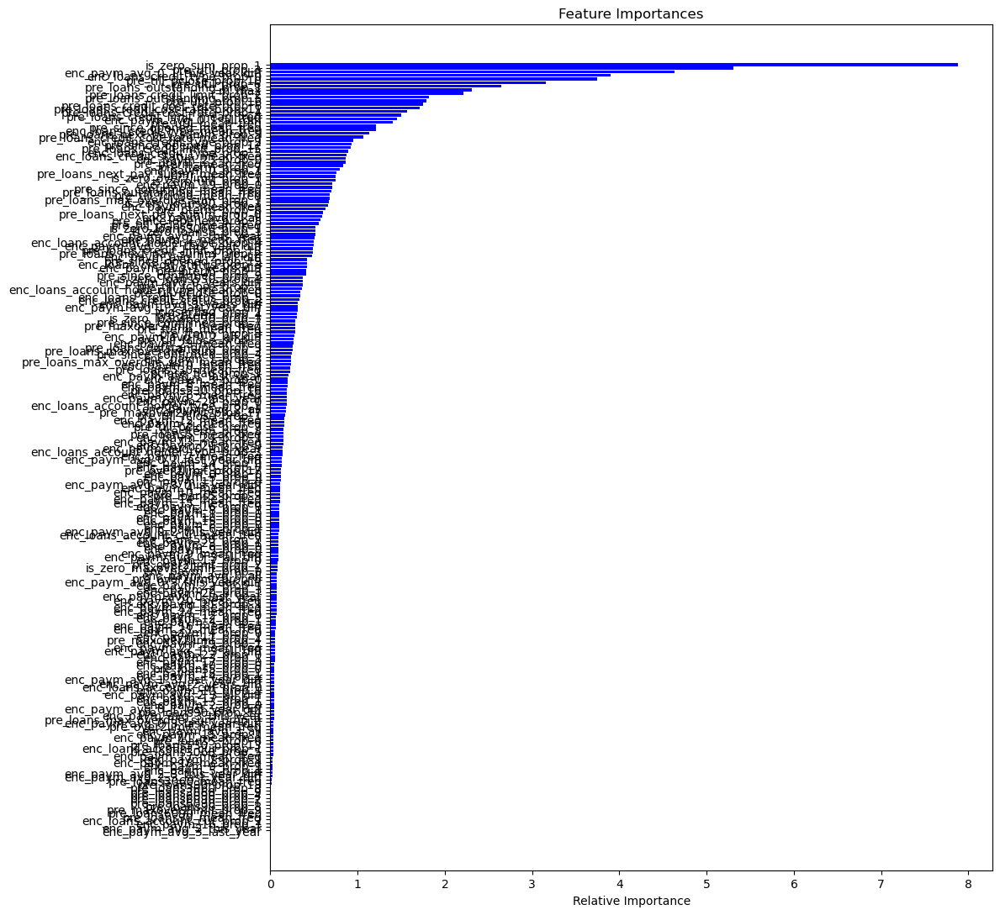

In [197]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

## Custom features

In [198]:
source_df_train = pd.read_csv("../data/processed/source_data_train_1.csv")
source_df_test = pd.read_csv("../data/processed/source_data_test_1.csv")
source_df_train.shape, source_df_test.shape

((20931476, 61), (5231241, 61))

In [199]:
df_train = pd.read_csv(
    "../data/processed/flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv"
)
df_test = pd.read_csv(
    "../data/processed/flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv"
)
df_train.shape, df_test.shape

((2400000, 215), (600000, 215))

Создам признак количества одинаковых значений признака pre_since_opened, как признак закредитованности.
Одинаковые значения признака должны указывать что кредиты брались примерно в одно и то же время.
И пронормирую его на количество кредитов.

In [201]:
df_train = from_pre_since_opened_create_pre_since_opened_sum_mean_repeated(
    source_df_train, df_train
)
df_test = from_pre_since_opened_create_pre_since_opened_sum_mean_repeated(
    source_df_test, df_test
)
df_train.shape, df_test.shape

((2400000, 216), (600000, 216))

In [202]:
#  Посмотрим на количество уникальных значений нового признака
df_train.pre_since_opened_repeated_prop.nunique()

380

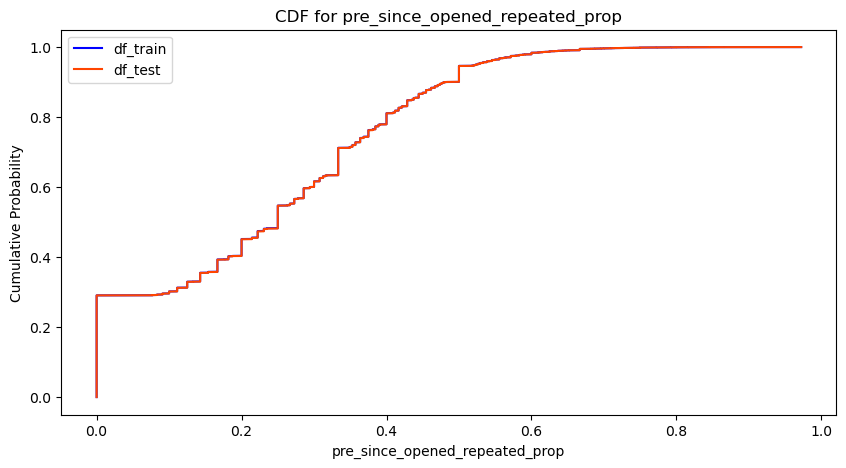

In [203]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-1:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

In [204]:
df_train = from_pre_term_till_mean_freq_create_diff_features(df_train)
df_test = from_pre_term_till_mean_freq_create_diff_features(df_test)
df_train.shape, df_test.shape

((2400000, 218), (600000, 218))

In [205]:
#  Посмотрим на количество уникальных значений нового признака
df_train.pre_fterm_pterm_mean_freq_diff.nunique()

1798316

In [206]:
#  Посмотрим на количество уникальных значений нового признака
df_train.pre_till_fclose_pclose_mean_freq_diff.nunique()

1720818

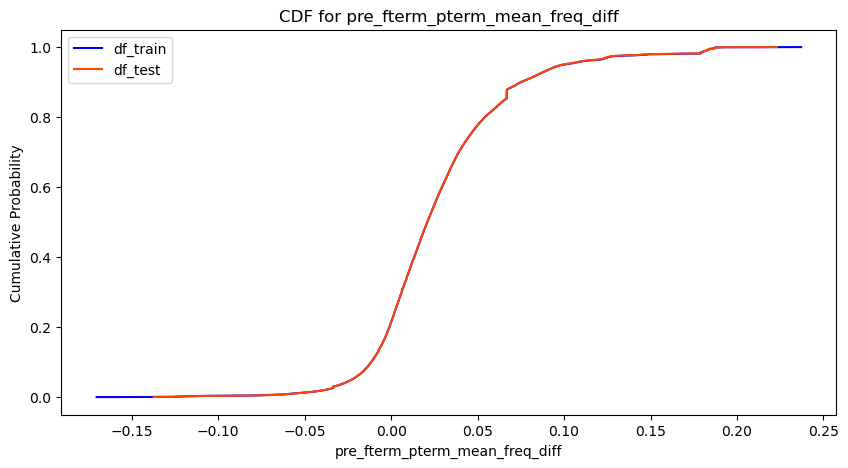

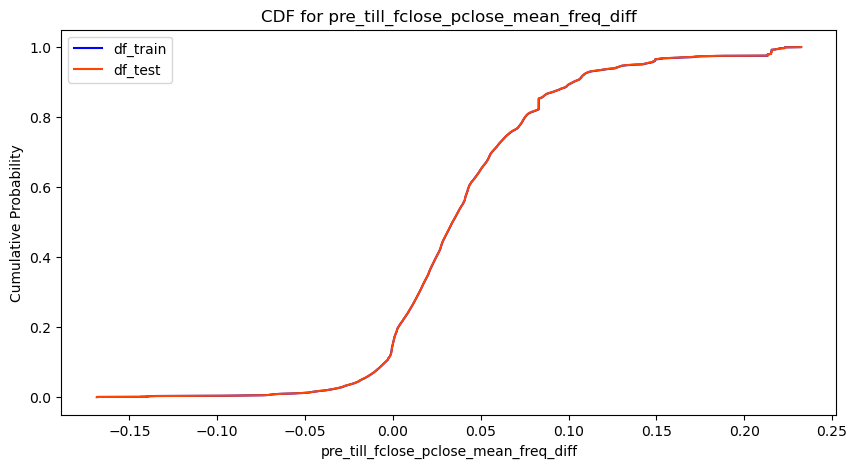

In [207]:
""" 
Для сравнения распределений новых признаков между тренировочным
и тестовым датасетами используем 
кумулятивную функцию распределения CDF.
"""
columns = df_train.columns[-2:]

for col in columns:
    plt.figure(figsize=(10, 5))

    # Для каждого датасета строим CDF — эмпирическую функцию распределения
    for data, label, color in [
        (df_train[col], "df_train", "blue"),
        (df_test[col], "df_test", "orangered"),
    ]:
        # Сортируем данные по возрастанию
        sorted_data = np.sort(data)

        # Вычисляем значения CDF: для каждого отсортированного значения
        # доля элементов, не превышающих его (кумулятивная вероятность)
        cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)

        # Строим график CDF
        plt.plot(sorted_data, cdf, label=label, color=color)

    plt.title(f"CDF for {col}")
    plt.xlabel(col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    plt.show()

Формы распределения практически совпадают.

In [208]:
# Запишем промежуточные результаты в файлы
df_train.to_csv(
    "../data/processed/cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv",
    index=False,
)
df_test.to_csv(
    "../data/processed/cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv",
    index=False,
)
df_train.shape, df_test.shape

((2400000, 218), (600000, 218))

In [209]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(
    df_train, df_test, "cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn"
)

Фолд 0
ROC AUC на трейне: 0.7803
ROC AUC на валидации: 0.7562
ROC AUC на тесте: 0.7543
Фолд 1
ROC AUC на трейне: 0.7765
ROC AUC на валидации: 0.7536
ROC AUC на тесте: 0.7547
Фолд 2
ROC AUC на трейне: 0.7731
ROC AUC на валидации: 0.7523
ROC AUC на тесте: 0.7551
Фолд 3
ROC AUC на трейне: 0.7820
ROC AUC на валидации: 0.7529
ROC AUC на тесте: 0.7544
Фолд 4
ROC AUC на трейне: 0.7746
ROC AUC на валидации: 0.7519
ROC AUC на тесте: 0.7554
Среднее ROC AUC на трейне: 0.7773 ± 0.0034
Среднее ROC AUC на валидации: 0.7534 ± 0.0015
Среднее ROC AUC на тесте: 0.7548 ± 0.0004


In [210]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455
7,encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.771210,0.002581,0.751143,0.001899,0.752105,0.000246
8,flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.775219,0.003499,0.753511,0.001877,0.754948,0.000369
9,cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.777299,0.003380,0.753371,0.001517,0.754799,0.000422


In [211]:
# Посмотрим на важности признаков
importances_dict

{'is_zero_sum_prop_1': 7.364457469561486,
 'enc_paym_avg_0_1_this_year_diff': 5.781582284851507,
 'pre_util_prop_3': 4.819124585838127,
 'enc_loans_credit_type_prop_0': 3.981744268477956,
 'pre_till_pclose_prop_10': 3.373294535447774,
 'pre_util_prop_6': 3.1396406579802565,
 'pre_loans_outstanding_prop_1': 2.5908373326181846,
 'pre_util_mean_freq': 2.312329218760038,
 'rn_max': 2.2432991845940857,
 'pre_loans_credit_limit_prop_2': 1.940382981444204,
 'pre_loans_credit_cost_rate_prop_6': 1.8466736793062692,
 'pre_loans_outstanding_prop_5': 1.7993715656231364,
 'pre_loans_credit_cost_rate_prop_11': 1.7639238770673626,
 'pre_loans_credit_cost_rate_prop_4': 1.5541752200208832,
 'pre_loans_credit_limit_mean_freq': 1.5100429057829998,
 'pre_since_opened_mean_freq': 1.2594465655777753,
 'pre_loans_credit_cost_rate_mean_freq': 1.2239969687437118,
 'enc_paym_avg_0_1_all_diff': 1.1945057516829136,
 'enc_paym_avg_1_all': 1.0970834584299256,
 'enc_loans_credit_type_mean_freq': 1.0555604039503503,


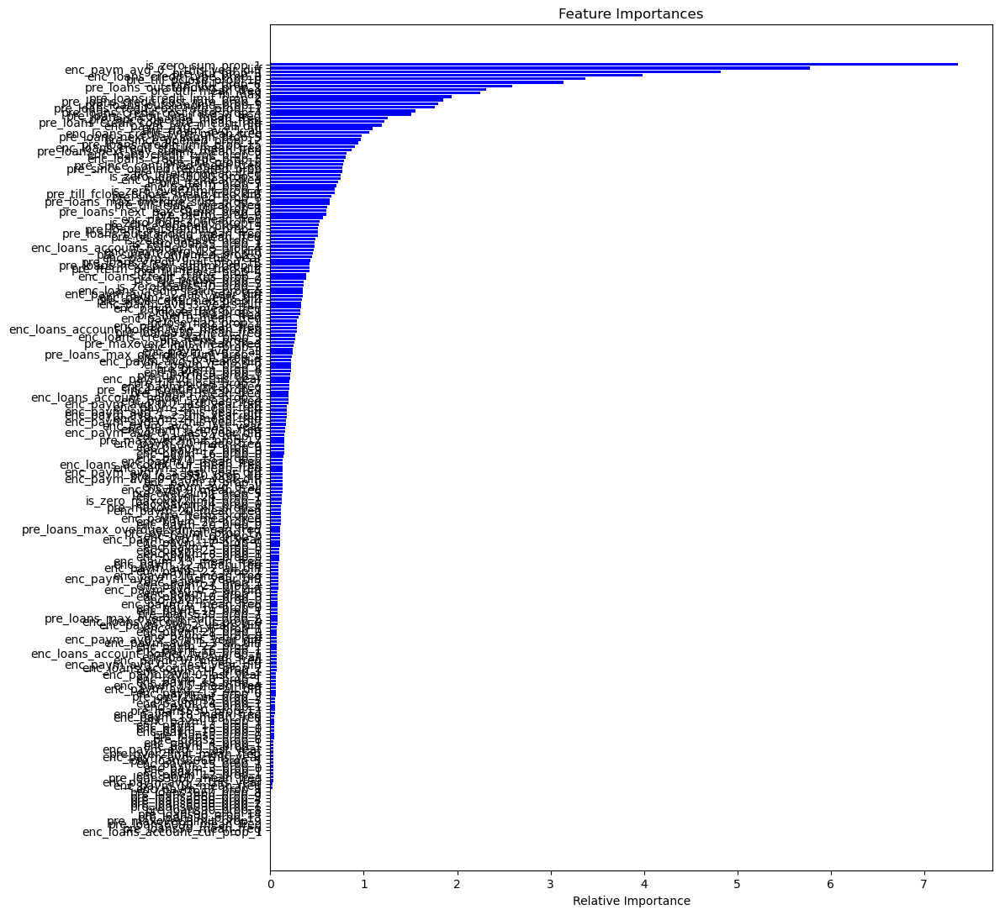

In [212]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

In [213]:
# Сохраним словарь важностей признаков в отдельную переменную
all_features_importances_dict = importances_dict

# Trimming features by importance

In [214]:
df_train = pd.read_csv(
    "../data/processed/cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_train.csv"
)
df_test = pd.read_csv(
    "../data/processed/cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn_test.csv"
)
df_train.shape, df_test.shape

((2400000, 218), (600000, 218))

In [215]:
# Отберем из словаря важности признаков признаки дающие прирост качества > 0.1
filtered_importances_dict = {
    k: v for k, v in all_features_importances_dict.items() if v > 0.1
}
len(filtered_importances_dict)

136

In [216]:
# Создадим новый список признаков
new_features_list = list(filtered_importances_dict.keys())
len(new_features_list)

136

In [217]:
df_train = df_train[["id", "flag"] + new_features_list]
df_test = df_test[["id", "flag"] + new_features_list]
df_train.shape, df_test.shape

((2400000, 138), (600000, 138))

In [218]:
# Запишем промежуточный результат в файл
df_train.to_csv("../data/processed/cut_imp_train.csv", index=False)
df_test.to_csv("../data/processed/cut_imp_test.csv", index=False)
df_train.shape, df_test.shape

((2400000, 138), (600000, 138))

In [219]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(df_train, df_test, "cut_imp")

Фолд 0
ROC AUC на трейне: 0.7773
ROC AUC на валидации: 0.7570
ROC AUC на тесте: 0.7550
Фолд 1
ROC AUC на трейне: 0.7803
ROC AUC на валидации: 0.7540
ROC AUC на тесте: 0.7552
Фолд 2
ROC AUC на трейне: 0.7766
ROC AUC на валидации: 0.7518
ROC AUC на тесте: 0.7550
Фолд 3
ROC AUC на трейне: 0.7816
ROC AUC на валидации: 0.7542
ROC AUC на тесте: 0.7560
Фолд 4
ROC AUC на трейне: 0.7736
ROC AUC на валидации: 0.7521
ROC AUC на тесте: 0.7554
Среднее ROC AUC на трейне: 0.7779 ± 0.0028
Среднее ROC AUC на валидации: 0.7538 ± 0.0018
Среднее ROC AUC на тесте: 0.7553 ± 0.0004


In [220]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455
7,encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.771210,0.002581,0.751143,0.001899,0.752105,0.000246
8,flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.775219,0.003499,0.753511,0.001877,0.754948,0.000369
9,cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.777299,0.003380,0.753371,0.001517,0.754799,0.000422


In [221]:
# Посмотрим на важности признаков
importances_dict

{'is_zero_sum_prop_1': 7.002073504934776,
 'pre_util_prop_3': 4.856695840973746,
 'enc_loans_credit_type_prop_0': 4.15256217551908,
 'enc_paym_avg_0_1_this_year_diff': 4.124247687621228,
 'pre_till_pclose_prop_10': 3.5537702805862965,
 'pre_util_prop_6': 3.0621018094197856,
 'pre_loans_outstanding_prop_1': 2.723633917588994,
 'pre_loans_credit_limit_prop_2': 2.145733628327441,
 'rn_max': 2.1231322505933723,
 'pre_util_mean_freq': 1.980183812453113,
 'enc_paym_avg_0_1_all_diff': 1.9706008065708764,
 'pre_loans_outstanding_prop_5': 1.8542347011262732,
 'pre_loans_credit_cost_rate_prop_11': 1.7867399673681603,
 'pre_loans_credit_cost_rate_prop_4': 1.724367962051071,
 'pre_loans_credit_limit_mean_freq': 1.681589798546487,
 'pre_loans_credit_cost_rate_prop_6': 1.6208605489563628,
 'pre_since_opened_mean_freq': 1.5178892238830768,
 'enc_loans_credit_type_mean_freq': 1.2421706484017683,
 'enc_paym_avg_1_2_all_diff': 1.167448899923196,
 'pre_loans_next_pay_summ_prop_5': 1.1585987506033433,
 'p

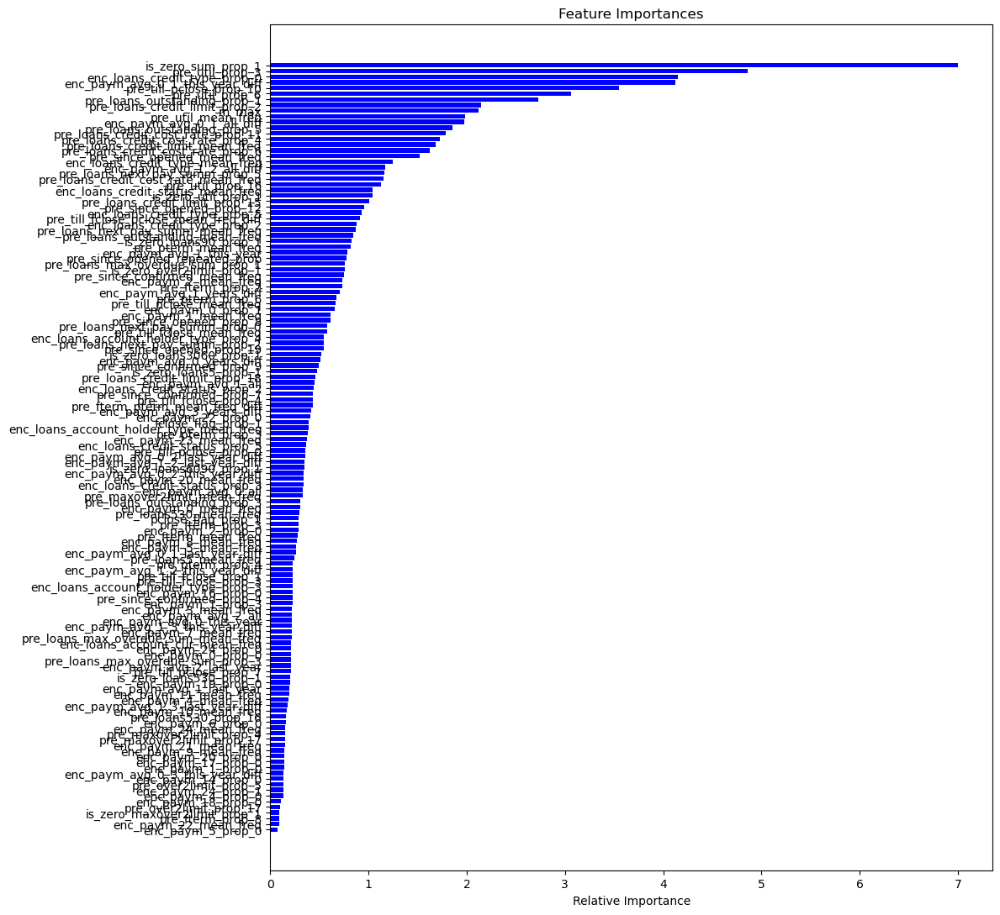

In [222]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()

In [223]:
# Сохраним словарь важностей в отдельную переменную
cut_imp_dict = importances_dict

# Trimming collinear features

Мультиколениарность не должна мешать работе алгоритма градиентного бустинга,   
но для уменьшения размерности датасетаa ускорения обучения и более ясной     
интерпритируемости признаков удалю колениарные признаки из датасета.

In [224]:
df_train = pd.read_csv("../data/processed/cut_imp_train.csv")
df_test = pd.read_csv("../data/processed/cut_imp_test.csv")
df_train.shape, df_test.shape

((2400000, 138), (600000, 138))

In [225]:
df_corr = df_train.corr()
df_corr

,id,flag,is_zero_sum_prop_1,enc_paym_avg_0_1_this_year_diff,pre_util_prop_3,enc_loans_credit_type_prop_0,pre_till_pclose_prop_10,pre_util_prop_6,pre_loans_outstanding_prop_1,pre_util_mean_freq,rn_max,pre_loans_credit_limit_prop_2,pre_loans_credit_cost_rate_prop_6,pre_loans_outstanding_prop_5,pre_loans_credit_cost_rate_prop_11,pre_loans_credit_cost_rate_prop_4,pre_loans_credit_limit_mean_freq,pre_since_opened_mean_freq,pre_loans_credit_cost_rate_mean_freq,enc_paym_avg_0_1_all_diff,enc_paym_avg_1_all,enc_loans_credit_type_mean_freq,pre_loans_next_pay_summ_prop_5,pre_since_opened_prop_12,pre_loans_credit_limit_prop_15,enc_loans_credit_status_mean_freq,pre_loans_next_pay_summ_mean_freq,enc_loans_credit_type_prop_2,enc_loans_credit_type_prop_5,pre_util_prop_16,pre_since_confirmed_mean_freq,pre_since_opened_repeated_prop,pre_pterm_mean_freq,is_zero_loans6090_prop_1,enc_paym_1_mean_freq,pre_fterm_prop_7,enc_paym_0_prop_1,is_zero_over2limit_prop_1,pre_till_fclose_pclose_mean_freq_diff,pre_since_opened_prop_8,pre_loans_max_overdue_sum_prop_1,pre_till_fclose_mean_freq,is_zero_util_prop_1,pre_loans_next_pay_summ_prop_0,pre_pterm_prop_6,enc_paym_2_mean_freq,is_zero_loans3060_prop_1,pre_since_opened_prop_19,pre_loans_outstanding_prop_3,pre_loans_outstanding_mean_freq,pre_till_pclose_mean_freq,is_zero_loans90_prop_1,is_zero_loans5_prop_1,enc_loans_account_holder_type_prop_4,enc_paym_avg_1_2_all_diff,pre_since_confirmed_prop_9,enc_paym_avg_1_this_year,pre_loans_credit_limit_prop_18,pre_loans_next_pay_summ_prop_2,pre_fterm_pterm_mean_freq_diff,pre_till_fclose_prop_4,enc_loans_credit_status_prop_2,pre_till_pclose_prop_0,pre_pterm_prop_3,is_zero_loans530_prop_1,enc_loans_credit_status_prop_5,enc_paym_avg_1_2_last_year_diff,enc_paym_avg_1_years_diff,pre_since_confirmed_prop_4,enc_paym_avg_3_years_diff,enc_paym_23_mean_freq,fclose_flag_prop_1,pre_fterm_mean_freq,enc_paym_0_mean_freq,pclose_flag_prop_1,enc_paym_21_mean_freq,enc_loans_account_holder_type_mean_freq,pre_loans530_mean_freq,enc_loans_credit_status_prop_3,pre_fterm_prop_3,pre_maxover2limit_mean_freq,enc_paym_1_prop_3,enc_paym_avg_2_all,pre_loans_max_overdue_sum_prop_3,pre_till_fclose_prop_3,enc_paym_avg_0_years_diff,enc_paym_1_prop_0,pre_pterm_prop_4,enc_paym_4_prop_0,pre_till_fclose_prop_1,enc_paym_avg_0_this_year,pre_till_pclose_prop_7,enc_paym_8_mean_freq,pre_since_confirmed_prop_7,pre_loans5_mean_freq,enc_loans_account_holder_type_prop_3,enc_paym_5_mean_freq,enc_paym_avg_0_2_last_year_diff,enc_paym_22_mean_freq,enc_paym_avg_1_3_this_year_diff,enc_paym_avg_1_2_this_year_diff,enc_paym_24_mean_freq,enc_paym_avg_0_3_this_year_diff,enc_paym_avg_2_last_year,enc_paym_3_mean_freq,enc_paym_avg_0_1_last_year_diff,enc_paym_24_prop_0,pre_maxover2limit_prop_17,enc_paym_10_mean_freq,enc_paym_19_prop_0,enc_paym_2_prop_0,enc_paym_16_prop_0,enc_paym_18_prop_0,enc_paym_4_mean_freq,enc_loans_account_cur_mean_freq,enc_paym_11_mean_freq,enc_paym_avg_1_3_last_year_diff,pre_loans530_prop_16,enc_paym_avg_0_2_this_year_diff,enc_paym_0_prop_0,enc_paym_avg_0_all,enc_paym_9_mean_freq,pre_over2limit_prop_5,enc_paym_24_prop_1,is_zero_maxover2limit_prop_1,enc_paym_14_prop_0,pre_maxover2limit_prop_4,enc_paym_20_mean_freq,pre_fterm_prop_8,enc_paym_7_mean_freq,enc_paym_22_prop_0,enc_paym_20_prop_0,pre_loans_max_overdue_sum_mean_freq,pre_over2limit_prop_17,enc_paym_6_prop_0,enc_paym_avg_1_last_year,enc_paym_17_prop_0,enc_paym_5_prop_0
id,1.000000,-0.000153,-0.003917,0.055588,-0.001318,0.048148,0.022418,-0.008304,0.043305,-0.003542,0.074200,0.040603,0.011408,0.005502,0.078538,-0.067281,0.034167,-0.098458,-0.017849,0.049711,-0.018438,0.043740,0.027044,-0.019659,0.027264,-0.004788,0.096294,-0.010052,0.030783,-0.005668,-0.058542,0.041674,-0.024507,-0.027439,0.027193,0.039702,-0.046847,-0.059823,0.000037,-0.072876,-0.056188,-0.028132,-0.007938,-0.019799,0.053119,0.024190,-0.017037,-0.013177,0.012923,0.012982,-0.051515,-0.026688,0.039859,0.010315,-0.020004,-0.057000,-0.024170,-0.002396,0.096141,-0.015693,0.036591,0.000188,

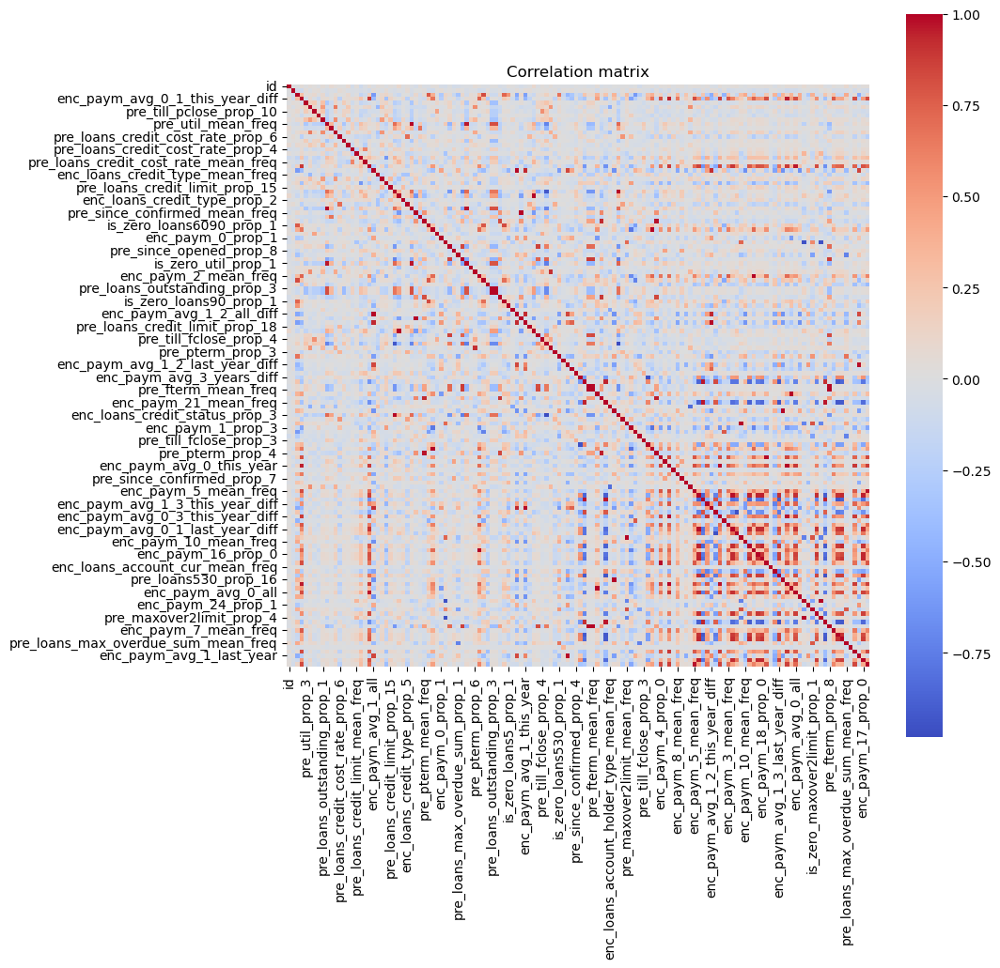

In [235]:
# Визуализация корреляционной матрицы
plt.figure(figsize=(10, 10))
sns.heatmap(df_corr, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation matrix")
plt.show()

In [227]:
# Собираем словарь признаков с высокой корреляцией
mult_dict = {}

for col in df_corr.columns:
    mult_dict[col] = []
    for i, val in enumerate(df_corr[col]):
        # Если у признаков высокая корреляция (модуль значения > 0.7), но не 1 (не с самим собой)
        if (abs(val) > 0.7) and (abs(val) != 1):
            # Добавляем название коррелирующего признака в словарь
            mult_dict[col].append(df_corr.index[i])

# Оставляем только признаки, у которых есть коррелирующие с ними признаки
mult_dict = {k: v for k, v in mult_dict.items() if len(v) > 0}

print("Number of features with high correlation", len(mult_dict))
mult_dict

Number of features with high correlation 92


{'is_zero_sum_prop_1': ['is_zero_loans6090_prop_1',
  'is_zero_loans3060_prop_1',
  'is_zero_loans90_prop_1'],
 'enc_paym_avg_0_1_this_year_diff': ['enc_paym_avg_0_1_all_diff',
  'enc_paym_2_mean_freq',
  'enc_paym_4_prop_0',
  'enc_paym_avg_0_this_year',
  'enc_paym_5_mean_freq',
  'enc_paym_avg_0_3_this_year_diff',
  'enc_paym_3_mean_freq',
  'enc_paym_2_prop_0',
  'enc_paym_4_mean_freq',
  'enc_paym_avg_0_2_this_year_diff',
  'enc_paym_avg_0_all',
  'enc_paym_7_mean_freq',
  'enc_paym_6_prop_0',
  'enc_paym_5_prop_0'],
 'pre_util_mean_freq': ['pre_util_prop_16',
  'is_zero_util_prop_1',
  'pre_loans_outstanding_prop_3',
  'pre_loans_outstanding_mean_freq',
  'enc_loans_credit_status_prop_2',
  'enc_loans_credit_status_prop_3'],
 'pre_loans_credit_cost_rate_prop_6': ['enc_loans_credit_type_prop_5'],
 'enc_paym_avg_0_1_all_diff': ['enc_paym_avg_0_1_this_year_diff',
  'enc_paym_avg_0_this_year',
  'enc_paym_5_mean_freq',
  'enc_paym_avg_0_2_last_year_diff',
  'enc_paym_avg_0_3_this_yea

In [228]:
"""
Из словаря корелирующих признаков сделаем список в котором останется 
только одно значение из каждого ключа(ключ или значение) которое 
дает наибольший прирост качества согласно cut_imp_dict
"""
del_list = []

for key, values in mult_dict.items():
    corr_list = [key] + values

    # Считаем важности для всех признаков из corr_list
    imps = [cut_imp_dict[col] for col in corr_list]

    # Находим индекс максимального значения важности
    max_idx = imps.index(max(imps))

    # Добавляем в de_list все элементы кроме максимального
    for i, col in enumerate(corr_list):
        if i != max_idx:
            del_list.append(col)

# Удаляем дубликаты из списка
del_list = list(set(del_list))

print("Length of the list to delete", len(del_list))
del_list

Length of the list to delete 77


['enc_paym_23_mean_freq',
 'enc_paym_6_prop_0',
 'enc_paym_0_prop_0',
 'enc_paym_20_prop_0',
 'enc_paym_2_mean_freq',
 'enc_paym_7_mean_freq',
 'enc_paym_5_mean_freq',
 'enc_paym_avg_0_1_last_year_diff',
 'enc_paym_4_mean_freq',
 'enc_paym_avg_1_all',
 'enc_paym_1_prop_3',
 'enc_paym_19_prop_0',
 'pre_till_fclose_pclose_mean_freq_diff',
 'enc_paym_4_prop_0',
 'pre_till_fclose_mean_freq',
 'enc_paym_14_prop_0',
 'enc_loans_account_holder_type_prop_3',
 'pre_loans_outstanding_prop_3',
 'enc_paym_1_prop_0',
 'pre_fterm_mean_freq',
 'is_zero_loans3060_prop_1',
 'enc_paym_avg_1_3_last_year_diff',
 'enc_paym_avg_0_all',
 'enc_paym_avg_1_2_last_year_diff',
 'enc_paym_11_mean_freq',
 'enc_paym_avg_0_this_year',
 'enc_paym_avg_1_this_year',
 'pre_loans_max_overdue_sum_mean_freq',
 'enc_paym_5_prop_0',
 'enc_paym_avg_0_3_this_year_diff',
 'pre_till_pclose_mean_freq',
 'pre_fterm_pterm_mean_freq_diff',
 'enc_paym_22_prop_0',
 'pre_maxover2limit_mean_freq',
 'enc_paym_avg_1_last_year',
 'pre_maxov

In [229]:
# Удалим корелирующие фичи
df_train = df_train.drop(del_list, axis=1)
df_test = df_test.drop(del_list, axis=1)
df_train.shape, df_test.shape

((2400000, 61), (600000, 61))

In [230]:
# Запишем  результат в файл
df_train.to_csv("../data/processed/cut_corr_imp_train.csv", index=False)
df_test.to_csv("../data/processed/cut_corr_imp_test.csv", index=False)
df_train.shape, df_test.shape

((2400000, 61), (600000, 61))

In [231]:
# Проведём кроссвалидацию нового датасета
df_metrics_new, importances_dict = check_cat_boost(df_train, df_test, "cut_corr_imp")

Фолд 0
ROC AUC на трейне: 0.7734
ROC AUC на валидации: 0.7552
ROC AUC на тесте: 0.7540
Фолд 1
ROC AUC на трейне: 0.7688
ROC AUC на валидации: 0.7529
ROC AUC на тесте: 0.7539
Фолд 2
ROC AUC на трейне: 0.7710
ROC AUC на валидации: 0.7507
ROC AUC на тесте: 0.7541
Фолд 3
ROC AUC на трейне: 0.7719
ROC AUC на валидации: 0.7525
ROC AUC на тесте: 0.7539
Фолд 4
ROC AUC на трейне: 0.7755
ROC AUC на валидации: 0.7504
ROC AUC на тесте: 0.7534
Среднее ROC AUC на трейне: 0.7721 ± 0.0022
Среднее ROC AUC на валидации: 0.7524 ± 0.0017
Среднее ROC AUC на тесте: 0.7539 ± 0.0002


In [232]:
# Перезапишем и посмотрим на df_metrics
df_metrics = pd.read_csv("../data/processed/df_metrics.csv")
df_metrics = pd.concat([df_metrics, df_metrics_new], ignore_index=True)
df_metrics.to_csv("../data/processed/df_metrics.csv", index=False)
df_metrics

,dataset_name,train_mean,train_std,val_mean,val_std,test_mean,test_std
0,pre_p_rn,0.746117,0.000942,0.724348,0.001412,0.726025,0.000326
1,pre_f_p_rn,0.753549,0.004418,0.728264,0.001649,0.729349,0.000196
2,enc_p_pre_f_p_rn,0.757535,0.001712,0.732721,0.001808,0.734503,0.000453
3,enc_f_p_pre_f_p_rn,0.757417,0.002354,0.733117,0.002177,0.734940,0.000271
4,encpaym_p_enc_f_p_pre_f_p_rn,0.771858,0.002497,0.747711,0.001638,0.749142,0.000388
5,encpaym_f_p_enc_f_p_pre_f_p_rn,0.769667,0.002765,0.747801,0.001486,0.749259,0.000456
6,encpaym_y_f_p_enc_f_p_pre_f_p_rn,0.773325,0.001601,0.750704,0.001753,0.752126,0.000455
7,encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.771210,0.002581,0.751143,0.001899,0.752105,0.000246
8,flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.775219,0.003499,0.753511,0.001877,0.754948,0.000369
9,cust_flag_encpaym_d_y_f_p_enc_f_p_pre_f_p_rn,0.777299,0.003380,0.753371,0.001517,0.754799,0.000422


Несмотря на снижение AUC на валидации на 0.00146, считаю это приемлемой ценой за   
существенное уменьшение размерности датасета — с 138 до 61 признака.    
Такая оптимизация упрощает модель,    
ускоряет обучение и повышает интерпретируемость без значительной потери качества.

In [233]:
# Посмотрим на важности признаков
importances_dict

{'enc_paym_avg_0_1_this_year_diff': 10.541363842103316,
 'is_zero_sum_prop_1': 9.721407971060769,
 'pre_util_prop_3': 5.302670343632289,
 'pre_util_mean_freq': 5.016371592101838,
 'enc_loans_credit_type_prop_0': 4.576182481339506,
 'pre_till_pclose_prop_10': 3.7956473580836967,
 'pre_util_prop_6': 3.2007070144306335,
 'rn_max': 3.1495609082700673,
 'pre_loans_outstanding_prop_1': 2.956403994793042,
 'pre_since_opened_mean_freq': 2.571951556175923,
 'enc_paym_avg_0_years_diff': 2.4721923396376413,
 'pre_loans_credit_cost_rate_prop_6': 2.2901062314794345,
 'pre_loans_credit_limit_prop_2': 2.178331120139408,
 'enc_paym_avg_1_2_all_diff': 2.144380249309474,
 'pre_loans_outstanding_prop_5': 2.050059191174736,
 'pre_loans_credit_cost_rate_prop_11': 2.0326961692570014,
 'pre_loans_credit_limit_mean_freq': 2.004317556985904,
 'pre_loans_credit_cost_rate_prop_4': 1.9438199292656737,
 'pre_loans_next_pay_summ_mean_freq': 1.672918257356083,
 'pre_loans_credit_cost_rate_mean_freq': 1.5428990438512

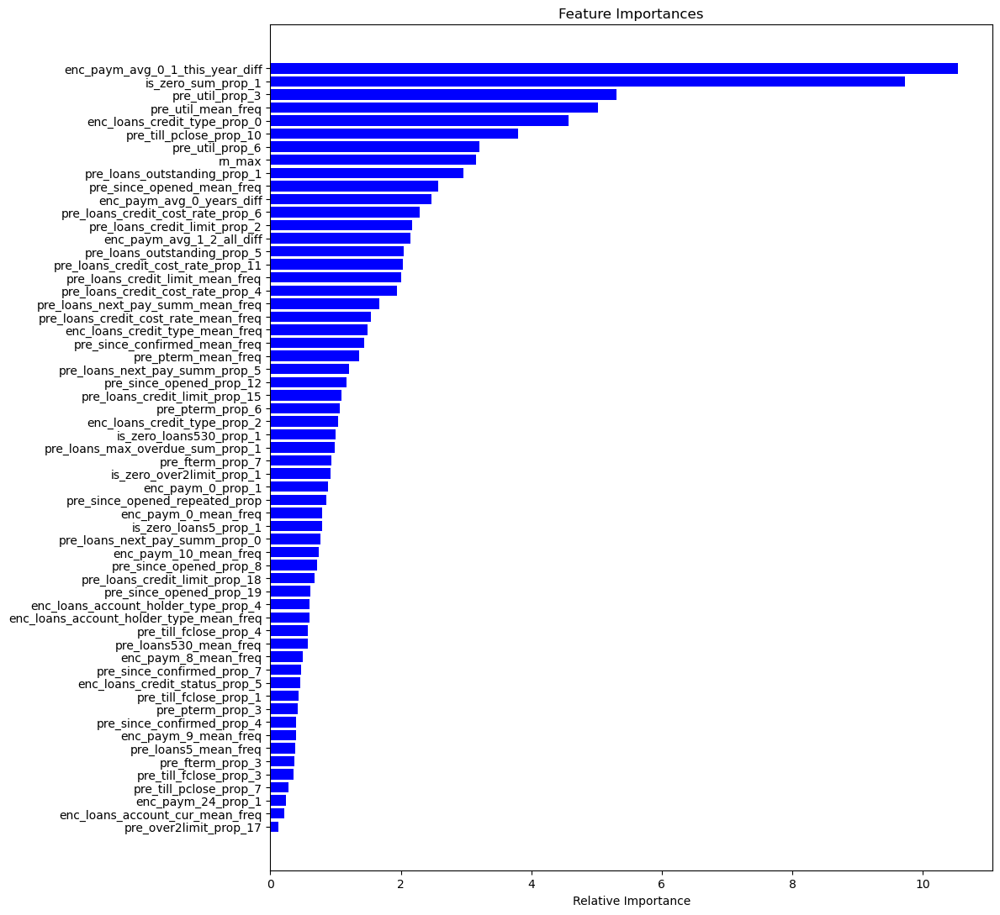

In [234]:
# Визуализируем важности признаков
features = importances_dict.keys()
values = importances_dict.values()

plt.figure(figsize=(12, 11))
plt.barh(features, values, color="blue")
plt.xlabel("Relative Importance")
plt.title("Feature Importances")
plt.gca().invert_yaxis()  # Самый важный сверху
plt.tight_layout()
plt.show()